# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162164.jpg  
  inflating: processed_celeba_small/celeba/162165.jpg  
  inflating: processed_celeba_small/celeba/162166.jpg  
  inflating: processed_celeba_small/celeba/162167.jpg  
  inflating: processed_celeba_small/celeba/162168.jpg  
  inflating: processed_celeba_small/celeba/162169.jpg  
  inflating: processed_celeba_small/celeba/162170.jpg  
  inflating: processed_celeba_small/celeba/162171.jpg  
  inflating: processed_celeba_small/celeba/162172.jpg  
  inflating: processed_celeba_small/celeba/162173.jpg  
  inflating: processed_celeba_small/celeba/162174.jpg  
  inflating: processed_celeba_small/celeba/162175.jpg  
  inflating: processed_celeba_small/celeba/162176.jpg  
  inflating: processed_celeba_small/celeba/162177.jpg  
  inflating: processed_celeba_small/celeba/162178.jpg  
  inflating: processed_celeba_small/celeba/162179.jpg  
  inflating: processed_celeba_small/celeba/162180.jpg  
  inflating: processed_celeba_small/celeba/16218

  inflating: processed_celeba_small/celeba/162317.jpg  
  inflating: processed_celeba_small/celeba/162318.jpg  
  inflating: processed_celeba_small/celeba/162319.jpg  
  inflating: processed_celeba_small/celeba/162320.jpg  
  inflating: processed_celeba_small/celeba/162321.jpg  
  inflating: processed_celeba_small/celeba/162322.jpg  
  inflating: processed_celeba_small/celeba/162323.jpg  
  inflating: processed_celeba_small/celeba/162324.jpg  
  inflating: processed_celeba_small/celeba/162325.jpg  
  inflating: processed_celeba_small/celeba/162326.jpg  
  inflating: processed_celeba_small/celeba/162327.jpg  
  inflating: processed_celeba_small/celeba/162328.jpg  
  inflating: processed_celeba_small/celeba/162329.jpg  
  inflating: processed_celeba_small/celeba/162330.jpg  
  inflating: processed_celeba_small/celeba/162331.jpg  
  inflating: processed_celeba_small/celeba/162332.jpg  
  inflating: processed_celeba_small/celeba/162333.jpg  
  inflating: processed_celeba_small/celeba/16233

  inflating: processed_celeba_small/celeba/162547.jpg  
  inflating: processed_celeba_small/celeba/162548.jpg  
  inflating: processed_celeba_small/celeba/162549.jpg  
  inflating: processed_celeba_small/celeba/162550.jpg  
  inflating: processed_celeba_small/celeba/162551.jpg  
  inflating: processed_celeba_small/celeba/162552.jpg  
  inflating: processed_celeba_small/celeba/162553.jpg  
  inflating: processed_celeba_small/celeba/162554.jpg  
  inflating: processed_celeba_small/celeba/162555.jpg  
  inflating: processed_celeba_small/celeba/162556.jpg  
  inflating: processed_celeba_small/celeba/162557.jpg  
  inflating: processed_celeba_small/celeba/162558.jpg  
  inflating: processed_celeba_small/celeba/162559.jpg  
  inflating: processed_celeba_small/celeba/162560.jpg  
  inflating: processed_celeba_small/celeba/162561.jpg  
  inflating: processed_celeba_small/celeba/162562.jpg  
  inflating: processed_celeba_small/celeba/162563.jpg  
  inflating: processed_celeba_small/celeba/16256

  inflating: processed_celeba_small/celeba/162759.jpg  
  inflating: processed_celeba_small/celeba/162760.jpg  
  inflating: processed_celeba_small/celeba/162761.jpg  
  inflating: processed_celeba_small/celeba/162762.jpg  
  inflating: processed_celeba_small/celeba/162763.jpg  
  inflating: processed_celeba_small/celeba/162764.jpg  
  inflating: processed_celeba_small/celeba/162765.jpg  
  inflating: processed_celeba_small/celeba/162766.jpg  
  inflating: processed_celeba_small/celeba/162767.jpg  
  inflating: processed_celeba_small/celeba/162768.jpg  
  inflating: processed_celeba_small/celeba/162769.jpg  
  inflating: processed_celeba_small/celeba/162770.jpg  
  inflating: processed_celeba_small/celeba/162771.jpg  
  inflating: processed_celeba_small/celeba/162772.jpg  
  inflating: processed_celeba_small/celeba/162773.jpg  
  inflating: processed_celeba_small/celeba/162774.jpg  
  inflating: processed_celeba_small/celeba/162775.jpg  
  inflating: processed_celeba_small/celeba/16277

  inflating: processed_celeba_small/celeba/162963.jpg  
  inflating: processed_celeba_small/celeba/162964.jpg  
  inflating: processed_celeba_small/celeba/162965.jpg  
  inflating: processed_celeba_small/celeba/162966.jpg  
  inflating: processed_celeba_small/celeba/162967.jpg  
  inflating: processed_celeba_small/celeba/162968.jpg  
  inflating: processed_celeba_small/celeba/162969.jpg  
  inflating: processed_celeba_small/celeba/162970.jpg  
  inflating: processed_celeba_small/celeba/162971.jpg  
  inflating: processed_celeba_small/celeba/162972.jpg  
  inflating: processed_celeba_small/celeba/162973.jpg  
  inflating: processed_celeba_small/celeba/162974.jpg  
  inflating: processed_celeba_small/celeba/162975.jpg  
  inflating: processed_celeba_small/celeba/162976.jpg  
  inflating: processed_celeba_small/celeba/162977.jpg  
  inflating: processed_celeba_small/celeba/162978.jpg  
  inflating: processed_celeba_small/celeba/162979.jpg  
  inflating: processed_celeba_small/celeba/16298

  inflating: processed_celeba_small/celeba/163162.jpg  
  inflating: processed_celeba_small/celeba/163163.jpg  
  inflating: processed_celeba_small/celeba/163164.jpg  
  inflating: processed_celeba_small/celeba/163165.jpg  
  inflating: processed_celeba_small/celeba/163166.jpg  
  inflating: processed_celeba_small/celeba/163167.jpg  
  inflating: processed_celeba_small/celeba/163168.jpg  
  inflating: processed_celeba_small/celeba/163169.jpg  
  inflating: processed_celeba_small/celeba/163170.jpg  
  inflating: processed_celeba_small/celeba/163171.jpg  
  inflating: processed_celeba_small/celeba/163172.jpg  
  inflating: processed_celeba_small/celeba/163173.jpg  
  inflating: processed_celeba_small/celeba/163174.jpg  
  inflating: processed_celeba_small/celeba/163175.jpg  
  inflating: processed_celeba_small/celeba/163176.jpg  
  inflating: processed_celeba_small/celeba/163177.jpg  
  inflating: processed_celeba_small/celeba/163178.jpg  
  inflating: processed_celeba_small/celeba/16317

  inflating: processed_celeba_small/celeba/163369.jpg  
  inflating: processed_celeba_small/celeba/163370.jpg  
  inflating: processed_celeba_small/celeba/163371.jpg  
  inflating: processed_celeba_small/celeba/163372.jpg  
  inflating: processed_celeba_small/celeba/163373.jpg  
  inflating: processed_celeba_small/celeba/163374.jpg  
  inflating: processed_celeba_small/celeba/163375.jpg  
  inflating: processed_celeba_small/celeba/163376.jpg  
  inflating: processed_celeba_small/celeba/163377.jpg  
  inflating: processed_celeba_small/celeba/163378.jpg  
  inflating: processed_celeba_small/celeba/163379.jpg  
  inflating: processed_celeba_small/celeba/163380.jpg  
  inflating: processed_celeba_small/celeba/163381.jpg  
  inflating: processed_celeba_small/celeba/163382.jpg  
  inflating: processed_celeba_small/celeba/163383.jpg  
  inflating: processed_celeba_small/celeba/163384.jpg  
  inflating: processed_celeba_small/celeba/163385.jpg  
  inflating: processed_celeba_small/celeba/16338

  inflating: processed_celeba_small/celeba/163577.jpg  
  inflating: processed_celeba_small/celeba/163578.jpg  
  inflating: processed_celeba_small/celeba/163579.jpg  
  inflating: processed_celeba_small/celeba/163580.jpg  
  inflating: processed_celeba_small/celeba/163581.jpg  
  inflating: processed_celeba_small/celeba/163582.jpg  
  inflating: processed_celeba_small/celeba/163583.jpg  
  inflating: processed_celeba_small/celeba/163584.jpg  
  inflating: processed_celeba_small/celeba/163585.jpg  
  inflating: processed_celeba_small/celeba/163586.jpg  
  inflating: processed_celeba_small/celeba/163587.jpg  
  inflating: processed_celeba_small/celeba/163588.jpg  
  inflating: processed_celeba_small/celeba/163589.jpg  
  inflating: processed_celeba_small/celeba/163590.jpg  
  inflating: processed_celeba_small/celeba/163591.jpg  
  inflating: processed_celeba_small/celeba/163592.jpg  
  inflating: processed_celeba_small/celeba/163593.jpg  
  inflating: processed_celeba_small/celeba/16359

  inflating: processed_celeba_small/celeba/163786.jpg  
  inflating: processed_celeba_small/celeba/163787.jpg  
  inflating: processed_celeba_small/celeba/163788.jpg  
  inflating: processed_celeba_small/celeba/163789.jpg  
  inflating: processed_celeba_small/celeba/163790.jpg  
  inflating: processed_celeba_small/celeba/163791.jpg  
  inflating: processed_celeba_small/celeba/163792.jpg  
  inflating: processed_celeba_small/celeba/163793.jpg  
  inflating: processed_celeba_small/celeba/163794.jpg  
  inflating: processed_celeba_small/celeba/163795.jpg  
  inflating: processed_celeba_small/celeba/163796.jpg  
  inflating: processed_celeba_small/celeba/163797.jpg  
  inflating: processed_celeba_small/celeba/163798.jpg  
  inflating: processed_celeba_small/celeba/163799.jpg  
  inflating: processed_celeba_small/celeba/163800.jpg  
  inflating: processed_celeba_small/celeba/163801.jpg  
  inflating: processed_celeba_small/celeba/163802.jpg  
  inflating: processed_celeba_small/celeba/16380

  inflating: processed_celeba_small/celeba/163982.jpg  
  inflating: processed_celeba_small/celeba/163983.jpg  
  inflating: processed_celeba_small/celeba/163984.jpg  
  inflating: processed_celeba_small/celeba/163985.jpg  
  inflating: processed_celeba_small/celeba/163986.jpg  
  inflating: processed_celeba_small/celeba/163987.jpg  
  inflating: processed_celeba_small/celeba/163988.jpg  
  inflating: processed_celeba_small/celeba/163989.jpg  
  inflating: processed_celeba_small/celeba/163990.jpg  
  inflating: processed_celeba_small/celeba/163991.jpg  
  inflating: processed_celeba_small/celeba/163992.jpg  
  inflating: processed_celeba_small/celeba/163993.jpg  
  inflating: processed_celeba_small/celeba/163994.jpg  
  inflating: processed_celeba_small/celeba/163995.jpg  
  inflating: processed_celeba_small/celeba/163996.jpg  
  inflating: processed_celeba_small/celeba/163997.jpg  
  inflating: processed_celeba_small/celeba/163998.jpg  
  inflating: processed_celeba_small/celeba/16399

  inflating: processed_celeba_small/celeba/164188.jpg  
  inflating: processed_celeba_small/celeba/164189.jpg  
  inflating: processed_celeba_small/celeba/164190.jpg  
  inflating: processed_celeba_small/celeba/164191.jpg  
  inflating: processed_celeba_small/celeba/164192.jpg  
  inflating: processed_celeba_small/celeba/164193.jpg  
  inflating: processed_celeba_small/celeba/164194.jpg  
  inflating: processed_celeba_small/celeba/164195.jpg  
  inflating: processed_celeba_small/celeba/164196.jpg  
  inflating: processed_celeba_small/celeba/164197.jpg  
  inflating: processed_celeba_small/celeba/164198.jpg  
  inflating: processed_celeba_small/celeba/164199.jpg  
  inflating: processed_celeba_small/celeba/164200.jpg  
  inflating: processed_celeba_small/celeba/164201.jpg  
  inflating: processed_celeba_small/celeba/164202.jpg  
  inflating: processed_celeba_small/celeba/164203.jpg  
  inflating: processed_celeba_small/celeba/164204.jpg  
  inflating: processed_celeba_small/celeba/16420

  inflating: processed_celeba_small/celeba/164396.jpg  
  inflating: processed_celeba_small/celeba/164397.jpg  
  inflating: processed_celeba_small/celeba/164398.jpg  
  inflating: processed_celeba_small/celeba/164399.jpg  
  inflating: processed_celeba_small/celeba/164400.jpg  
  inflating: processed_celeba_small/celeba/164401.jpg  
  inflating: processed_celeba_small/celeba/164402.jpg  
  inflating: processed_celeba_small/celeba/164403.jpg  
  inflating: processed_celeba_small/celeba/164404.jpg  
  inflating: processed_celeba_small/celeba/164405.jpg  
  inflating: processed_celeba_small/celeba/164406.jpg  
  inflating: processed_celeba_small/celeba/164407.jpg  
  inflating: processed_celeba_small/celeba/164408.jpg  
  inflating: processed_celeba_small/celeba/164409.jpg  
  inflating: processed_celeba_small/celeba/164410.jpg  
  inflating: processed_celeba_small/celeba/164411.jpg  
  inflating: processed_celeba_small/celeba/164412.jpg  
  inflating: processed_celeba_small/celeba/16441

  inflating: processed_celeba_small/celeba/164598.jpg  
  inflating: processed_celeba_small/celeba/164599.jpg  
  inflating: processed_celeba_small/celeba/164600.jpg  
  inflating: processed_celeba_small/celeba/164601.jpg  
  inflating: processed_celeba_small/celeba/164602.jpg  
  inflating: processed_celeba_small/celeba/164603.jpg  
  inflating: processed_celeba_small/celeba/164604.jpg  
  inflating: processed_celeba_small/celeba/164605.jpg  
  inflating: processed_celeba_small/celeba/164606.jpg  
  inflating: processed_celeba_small/celeba/164607.jpg  
  inflating: processed_celeba_small/celeba/164608.jpg  
  inflating: processed_celeba_small/celeba/164609.jpg  
  inflating: processed_celeba_small/celeba/164610.jpg  
  inflating: processed_celeba_small/celeba/164611.jpg  
  inflating: processed_celeba_small/celeba/164612.jpg  
  inflating: processed_celeba_small/celeba/164613.jpg  
  inflating: processed_celeba_small/celeba/164614.jpg  
  inflating: processed_celeba_small/celeba/16461

  inflating: processed_celeba_small/celeba/164796.jpg  
  inflating: processed_celeba_small/celeba/164797.jpg  
  inflating: processed_celeba_small/celeba/164798.jpg  
  inflating: processed_celeba_small/celeba/164799.jpg  
  inflating: processed_celeba_small/celeba/164800.jpg  
  inflating: processed_celeba_small/celeba/164801.jpg  
  inflating: processed_celeba_small/celeba/164802.jpg  
  inflating: processed_celeba_small/celeba/164803.jpg  
  inflating: processed_celeba_small/celeba/164804.jpg  
  inflating: processed_celeba_small/celeba/164805.jpg  
  inflating: processed_celeba_small/celeba/164806.jpg  
  inflating: processed_celeba_small/celeba/164807.jpg  
  inflating: processed_celeba_small/celeba/164808.jpg  
  inflating: processed_celeba_small/celeba/164809.jpg  
  inflating: processed_celeba_small/celeba/164810.jpg  
  inflating: processed_celeba_small/celeba/164811.jpg  
  inflating: processed_celeba_small/celeba/164812.jpg  
  inflating: processed_celeba_small/celeba/16481

  inflating: processed_celeba_small/celeba/164961.jpg  
  inflating: processed_celeba_small/celeba/164962.jpg  
  inflating: processed_celeba_small/celeba/164963.jpg  
  inflating: processed_celeba_small/celeba/164964.jpg  
  inflating: processed_celeba_small/celeba/164965.jpg  
  inflating: processed_celeba_small/celeba/164966.jpg  
  inflating: processed_celeba_small/celeba/164967.jpg  
  inflating: processed_celeba_small/celeba/164968.jpg  
  inflating: processed_celeba_small/celeba/164969.jpg  
  inflating: processed_celeba_small/celeba/164970.jpg  
  inflating: processed_celeba_small/celeba/164971.jpg  
  inflating: processed_celeba_small/celeba/164972.jpg  
  inflating: processed_celeba_small/celeba/164973.jpg  
  inflating: processed_celeba_small/celeba/164974.jpg  
  inflating: processed_celeba_small/celeba/164975.jpg  
  inflating: processed_celeba_small/celeba/164976.jpg  
  inflating: processed_celeba_small/celeba/164977.jpg  
  inflating: processed_celeba_small/celeba/16497

  inflating: processed_celeba_small/celeba/165161.jpg  
  inflating: processed_celeba_small/celeba/165162.jpg  
  inflating: processed_celeba_small/celeba/165163.jpg  
  inflating: processed_celeba_small/celeba/165164.jpg  
  inflating: processed_celeba_small/celeba/165165.jpg  
  inflating: processed_celeba_small/celeba/165166.jpg  
  inflating: processed_celeba_small/celeba/165167.jpg  
  inflating: processed_celeba_small/celeba/165168.jpg  
  inflating: processed_celeba_small/celeba/165169.jpg  
  inflating: processed_celeba_small/celeba/165170.jpg  
  inflating: processed_celeba_small/celeba/165171.jpg  
  inflating: processed_celeba_small/celeba/165172.jpg  
  inflating: processed_celeba_small/celeba/165173.jpg  
  inflating: processed_celeba_small/celeba/165174.jpg  
  inflating: processed_celeba_small/celeba/165175.jpg  
  inflating: processed_celeba_small/celeba/165176.jpg  
  inflating: processed_celeba_small/celeba/165177.jpg  
  inflating: processed_celeba_small/celeba/16517

  inflating: processed_celeba_small/celeba/165366.jpg  
  inflating: processed_celeba_small/celeba/165367.jpg  
  inflating: processed_celeba_small/celeba/165368.jpg  
  inflating: processed_celeba_small/celeba/165369.jpg  
  inflating: processed_celeba_small/celeba/165370.jpg  
  inflating: processed_celeba_small/celeba/165371.jpg  
  inflating: processed_celeba_small/celeba/165372.jpg  
  inflating: processed_celeba_small/celeba/165373.jpg  
  inflating: processed_celeba_small/celeba/165374.jpg  
  inflating: processed_celeba_small/celeba/165375.jpg  
  inflating: processed_celeba_small/celeba/165376.jpg  
  inflating: processed_celeba_small/celeba/165377.jpg  
  inflating: processed_celeba_small/celeba/165378.jpg  
  inflating: processed_celeba_small/celeba/165379.jpg  
  inflating: processed_celeba_small/celeba/165380.jpg  
  inflating: processed_celeba_small/celeba/165381.jpg  
  inflating: processed_celeba_small/celeba/165382.jpg  
  inflating: processed_celeba_small/celeba/16538

  inflating: processed_celeba_small/celeba/165574.jpg  
  inflating: processed_celeba_small/celeba/165575.jpg  
  inflating: processed_celeba_small/celeba/165576.jpg  
  inflating: processed_celeba_small/celeba/165577.jpg  
  inflating: processed_celeba_small/celeba/165578.jpg  
  inflating: processed_celeba_small/celeba/165579.jpg  
  inflating: processed_celeba_small/celeba/165580.jpg  
  inflating: processed_celeba_small/celeba/165581.jpg  
  inflating: processed_celeba_small/celeba/165582.jpg  
  inflating: processed_celeba_small/celeba/165583.jpg  
  inflating: processed_celeba_small/celeba/165584.jpg  
  inflating: processed_celeba_small/celeba/165585.jpg  
  inflating: processed_celeba_small/celeba/165586.jpg  
  inflating: processed_celeba_small/celeba/165587.jpg  
  inflating: processed_celeba_small/celeba/165588.jpg  
  inflating: processed_celeba_small/celeba/165589.jpg  
  inflating: processed_celeba_small/celeba/165590.jpg  
  inflating: processed_celeba_small/celeba/16559

  inflating: processed_celeba_small/celeba/165785.jpg  
  inflating: processed_celeba_small/celeba/165786.jpg  
  inflating: processed_celeba_small/celeba/165787.jpg  
  inflating: processed_celeba_small/celeba/165788.jpg  
  inflating: processed_celeba_small/celeba/165789.jpg  
  inflating: processed_celeba_small/celeba/165790.jpg  
  inflating: processed_celeba_small/celeba/165791.jpg  
  inflating: processed_celeba_small/celeba/165792.jpg  
  inflating: processed_celeba_small/celeba/165793.jpg  
  inflating: processed_celeba_small/celeba/165794.jpg  
  inflating: processed_celeba_small/celeba/165795.jpg  
  inflating: processed_celeba_small/celeba/165796.jpg  
  inflating: processed_celeba_small/celeba/165797.jpg  
  inflating: processed_celeba_small/celeba/165798.jpg  
  inflating: processed_celeba_small/celeba/165799.jpg  
  inflating: processed_celeba_small/celeba/165800.jpg  
  inflating: processed_celeba_small/celeba/165801.jpg  
  inflating: processed_celeba_small/celeba/16580

  inflating: processed_celeba_small/celeba/165998.jpg  
  inflating: processed_celeba_small/celeba/165999.jpg  
  inflating: processed_celeba_small/celeba/166000.jpg  
  inflating: processed_celeba_small/celeba/166001.jpg  
  inflating: processed_celeba_small/celeba/166002.jpg  
  inflating: processed_celeba_small/celeba/166003.jpg  
  inflating: processed_celeba_small/celeba/166004.jpg  
  inflating: processed_celeba_small/celeba/166005.jpg  
  inflating: processed_celeba_small/celeba/166006.jpg  
  inflating: processed_celeba_small/celeba/166007.jpg  
  inflating: processed_celeba_small/celeba/166008.jpg  
  inflating: processed_celeba_small/celeba/166009.jpg  
  inflating: processed_celeba_small/celeba/166010.jpg  
  inflating: processed_celeba_small/celeba/166011.jpg  
  inflating: processed_celeba_small/celeba/166012.jpg  
  inflating: processed_celeba_small/celeba/166013.jpg  
  inflating: processed_celeba_small/celeba/166014.jpg  
  inflating: processed_celeba_small/celeba/16601

  inflating: processed_celeba_small/celeba/166211.jpg  
  inflating: processed_celeba_small/celeba/166212.jpg  
  inflating: processed_celeba_small/celeba/166213.jpg  
  inflating: processed_celeba_small/celeba/166214.jpg  
  inflating: processed_celeba_small/celeba/166215.jpg  
  inflating: processed_celeba_small/celeba/166216.jpg  
  inflating: processed_celeba_small/celeba/166217.jpg  
  inflating: processed_celeba_small/celeba/166218.jpg  
  inflating: processed_celeba_small/celeba/166219.jpg  
  inflating: processed_celeba_small/celeba/166220.jpg  
  inflating: processed_celeba_small/celeba/166221.jpg  
  inflating: processed_celeba_small/celeba/166222.jpg  
  inflating: processed_celeba_small/celeba/166223.jpg  
  inflating: processed_celeba_small/celeba/166224.jpg  
  inflating: processed_celeba_small/celeba/166225.jpg  
  inflating: processed_celeba_small/celeba/166226.jpg  
  inflating: processed_celeba_small/celeba/166227.jpg  
  inflating: processed_celeba_small/celeba/16622

  inflating: processed_celeba_small/celeba/166412.jpg  
  inflating: processed_celeba_small/celeba/166413.jpg  
  inflating: processed_celeba_small/celeba/166414.jpg  
  inflating: processed_celeba_small/celeba/166415.jpg  
  inflating: processed_celeba_small/celeba/166416.jpg  
  inflating: processed_celeba_small/celeba/166417.jpg  
  inflating: processed_celeba_small/celeba/166418.jpg  
  inflating: processed_celeba_small/celeba/166419.jpg  
  inflating: processed_celeba_small/celeba/166420.jpg  
  inflating: processed_celeba_small/celeba/166421.jpg  
  inflating: processed_celeba_small/celeba/166422.jpg  
  inflating: processed_celeba_small/celeba/166423.jpg  
  inflating: processed_celeba_small/celeba/166424.jpg  
  inflating: processed_celeba_small/celeba/166425.jpg  
  inflating: processed_celeba_small/celeba/166426.jpg  
  inflating: processed_celeba_small/celeba/166427.jpg  
  inflating: processed_celeba_small/celeba/166428.jpg  
  inflating: processed_celeba_small/celeba/16642

  inflating: processed_celeba_small/celeba/166614.jpg  
  inflating: processed_celeba_small/celeba/166615.jpg  
  inflating: processed_celeba_small/celeba/166616.jpg  
  inflating: processed_celeba_small/celeba/166617.jpg  
  inflating: processed_celeba_small/celeba/166618.jpg  
  inflating: processed_celeba_small/celeba/166619.jpg  
  inflating: processed_celeba_small/celeba/166620.jpg  
  inflating: processed_celeba_small/celeba/166621.jpg  
  inflating: processed_celeba_small/celeba/166622.jpg  
  inflating: processed_celeba_small/celeba/166623.jpg  
  inflating: processed_celeba_small/celeba/166624.jpg  
  inflating: processed_celeba_small/celeba/166625.jpg  
  inflating: processed_celeba_small/celeba/166626.jpg  
  inflating: processed_celeba_small/celeba/166627.jpg  
  inflating: processed_celeba_small/celeba/166628.jpg  
  inflating: processed_celeba_small/celeba/166629.jpg  
  inflating: processed_celeba_small/celeba/166630.jpg  
  inflating: processed_celeba_small/celeba/16663

  inflating: processed_celeba_small/celeba/166814.jpg  
  inflating: processed_celeba_small/celeba/166815.jpg  
  inflating: processed_celeba_small/celeba/166816.jpg  
  inflating: processed_celeba_small/celeba/166817.jpg  
  inflating: processed_celeba_small/celeba/166818.jpg  
  inflating: processed_celeba_small/celeba/166819.jpg  
  inflating: processed_celeba_small/celeba/166820.jpg  
  inflating: processed_celeba_small/celeba/166821.jpg  
  inflating: processed_celeba_small/celeba/166822.jpg  
  inflating: processed_celeba_small/celeba/166823.jpg  
  inflating: processed_celeba_small/celeba/166824.jpg  
  inflating: processed_celeba_small/celeba/166825.jpg  
  inflating: processed_celeba_small/celeba/166826.jpg  
  inflating: processed_celeba_small/celeba/166827.jpg  
  inflating: processed_celeba_small/celeba/166828.jpg  
  inflating: processed_celeba_small/celeba/166829.jpg  
  inflating: processed_celeba_small/celeba/166830.jpg  
  inflating: processed_celeba_small/celeba/16683

  inflating: processed_celeba_small/celeba/167017.jpg  
  inflating: processed_celeba_small/celeba/167018.jpg  
  inflating: processed_celeba_small/celeba/167019.jpg  
  inflating: processed_celeba_small/celeba/167020.jpg  
  inflating: processed_celeba_small/celeba/167021.jpg  
  inflating: processed_celeba_small/celeba/167022.jpg  
  inflating: processed_celeba_small/celeba/167023.jpg  
  inflating: processed_celeba_small/celeba/167024.jpg  
  inflating: processed_celeba_small/celeba/167025.jpg  
  inflating: processed_celeba_small/celeba/167026.jpg  
  inflating: processed_celeba_small/celeba/167027.jpg  
  inflating: processed_celeba_small/celeba/167028.jpg  
  inflating: processed_celeba_small/celeba/167029.jpg  
  inflating: processed_celeba_small/celeba/167030.jpg  
  inflating: processed_celeba_small/celeba/167031.jpg  
  inflating: processed_celeba_small/celeba/167032.jpg  
  inflating: processed_celeba_small/celeba/167033.jpg  
  inflating: processed_celeba_small/celeba/16703

  inflating: processed_celeba_small/celeba/167220.jpg  
  inflating: processed_celeba_small/celeba/167221.jpg  
  inflating: processed_celeba_small/celeba/167222.jpg  
  inflating: processed_celeba_small/celeba/167223.jpg  
  inflating: processed_celeba_small/celeba/167224.jpg  
  inflating: processed_celeba_small/celeba/167225.jpg  
  inflating: processed_celeba_small/celeba/167226.jpg  
  inflating: processed_celeba_small/celeba/167227.jpg  
  inflating: processed_celeba_small/celeba/167228.jpg  
  inflating: processed_celeba_small/celeba/167229.jpg  
  inflating: processed_celeba_small/celeba/167230.jpg  
  inflating: processed_celeba_small/celeba/167231.jpg  
  inflating: processed_celeba_small/celeba/167232.jpg  
  inflating: processed_celeba_small/celeba/167233.jpg  
  inflating: processed_celeba_small/celeba/167234.jpg  
  inflating: processed_celeba_small/celeba/167235.jpg  
  inflating: processed_celeba_small/celeba/167236.jpg  
  inflating: processed_celeba_small/celeba/16723

  inflating: processed_celeba_small/celeba/167419.jpg  
  inflating: processed_celeba_small/celeba/167420.jpg  
  inflating: processed_celeba_small/celeba/167421.jpg  
  inflating: processed_celeba_small/celeba/167422.jpg  
  inflating: processed_celeba_small/celeba/167423.jpg  
  inflating: processed_celeba_small/celeba/167424.jpg  
  inflating: processed_celeba_small/celeba/167425.jpg  
  inflating: processed_celeba_small/celeba/167426.jpg  
  inflating: processed_celeba_small/celeba/167427.jpg  
  inflating: processed_celeba_small/celeba/167428.jpg  
  inflating: processed_celeba_small/celeba/167429.jpg  
  inflating: processed_celeba_small/celeba/167430.jpg  
  inflating: processed_celeba_small/celeba/167431.jpg  
  inflating: processed_celeba_small/celeba/167432.jpg  
  inflating: processed_celeba_small/celeba/167433.jpg  
  inflating: processed_celeba_small/celeba/167434.jpg  
  inflating: processed_celeba_small/celeba/167435.jpg  
  inflating: processed_celeba_small/celeba/16743

  inflating: processed_celeba_small/celeba/167614.jpg  
  inflating: processed_celeba_small/celeba/167615.jpg  
  inflating: processed_celeba_small/celeba/167616.jpg  
  inflating: processed_celeba_small/celeba/167617.jpg  
  inflating: processed_celeba_small/celeba/167618.jpg  
  inflating: processed_celeba_small/celeba/167619.jpg  
  inflating: processed_celeba_small/celeba/167620.jpg  
  inflating: processed_celeba_small/celeba/167621.jpg  
  inflating: processed_celeba_small/celeba/167622.jpg  
  inflating: processed_celeba_small/celeba/167623.jpg  
  inflating: processed_celeba_small/celeba/167624.jpg  
  inflating: processed_celeba_small/celeba/167625.jpg  
  inflating: processed_celeba_small/celeba/167626.jpg  
  inflating: processed_celeba_small/celeba/167627.jpg  
  inflating: processed_celeba_small/celeba/167628.jpg  
  inflating: processed_celeba_small/celeba/167629.jpg  
  inflating: processed_celeba_small/celeba/167630.jpg  
  inflating: processed_celeba_small/celeba/16763

  inflating: processed_celeba_small/celeba/167809.jpg  
  inflating: processed_celeba_small/celeba/167810.jpg  
  inflating: processed_celeba_small/celeba/167811.jpg  
  inflating: processed_celeba_small/celeba/167812.jpg  
  inflating: processed_celeba_small/celeba/167813.jpg  
  inflating: processed_celeba_small/celeba/167814.jpg  
  inflating: processed_celeba_small/celeba/167815.jpg  
  inflating: processed_celeba_small/celeba/167816.jpg  
  inflating: processed_celeba_small/celeba/167817.jpg  
  inflating: processed_celeba_small/celeba/167818.jpg  
  inflating: processed_celeba_small/celeba/167819.jpg  
  inflating: processed_celeba_small/celeba/167820.jpg  
  inflating: processed_celeba_small/celeba/167821.jpg  
  inflating: processed_celeba_small/celeba/167822.jpg  
  inflating: processed_celeba_small/celeba/167823.jpg  
  inflating: processed_celeba_small/celeba/167824.jpg  
  inflating: processed_celeba_small/celeba/167825.jpg  
  inflating: processed_celeba_small/celeba/16782

  inflating: processed_celeba_small/celeba/168012.jpg  
  inflating: processed_celeba_small/celeba/168013.jpg  
  inflating: processed_celeba_small/celeba/168014.jpg  
  inflating: processed_celeba_small/celeba/168015.jpg  
  inflating: processed_celeba_small/celeba/168016.jpg  
  inflating: processed_celeba_small/celeba/168017.jpg  
  inflating: processed_celeba_small/celeba/168018.jpg  
  inflating: processed_celeba_small/celeba/168019.jpg  
  inflating: processed_celeba_small/celeba/168020.jpg  
  inflating: processed_celeba_small/celeba/168021.jpg  
  inflating: processed_celeba_small/celeba/168022.jpg  
  inflating: processed_celeba_small/celeba/168023.jpg  
  inflating: processed_celeba_small/celeba/168024.jpg  
  inflating: processed_celeba_small/celeba/168025.jpg  
  inflating: processed_celeba_small/celeba/168026.jpg  
  inflating: processed_celeba_small/celeba/168027.jpg  
  inflating: processed_celeba_small/celeba/168028.jpg  
  inflating: processed_celeba_small/celeba/16802

  inflating: processed_celeba_small/celeba/168218.jpg  
  inflating: processed_celeba_small/celeba/168219.jpg  
  inflating: processed_celeba_small/celeba/168220.jpg  
  inflating: processed_celeba_small/celeba/168221.jpg  
  inflating: processed_celeba_small/celeba/168222.jpg  
  inflating: processed_celeba_small/celeba/168223.jpg  
  inflating: processed_celeba_small/celeba/168224.jpg  
  inflating: processed_celeba_small/celeba/168225.jpg  
  inflating: processed_celeba_small/celeba/168226.jpg  
  inflating: processed_celeba_small/celeba/168227.jpg  
  inflating: processed_celeba_small/celeba/168228.jpg  
  inflating: processed_celeba_small/celeba/168229.jpg  
  inflating: processed_celeba_small/celeba/168230.jpg  
  inflating: processed_celeba_small/celeba/168231.jpg  
  inflating: processed_celeba_small/celeba/168232.jpg  
  inflating: processed_celeba_small/celeba/168233.jpg  
  inflating: processed_celeba_small/celeba/168234.jpg  
  inflating: processed_celeba_small/celeba/16823

  inflating: processed_celeba_small/celeba/168428.jpg  
  inflating: processed_celeba_small/celeba/168429.jpg  
  inflating: processed_celeba_small/celeba/168430.jpg  
  inflating: processed_celeba_small/celeba/168431.jpg  
  inflating: processed_celeba_small/celeba/168432.jpg  
  inflating: processed_celeba_small/celeba/168433.jpg  
  inflating: processed_celeba_small/celeba/168434.jpg  
  inflating: processed_celeba_small/celeba/168435.jpg  
  inflating: processed_celeba_small/celeba/168436.jpg  
  inflating: processed_celeba_small/celeba/168437.jpg  
  inflating: processed_celeba_small/celeba/168438.jpg  
  inflating: processed_celeba_small/celeba/168439.jpg  
  inflating: processed_celeba_small/celeba/168440.jpg  
  inflating: processed_celeba_small/celeba/168441.jpg  
  inflating: processed_celeba_small/celeba/168442.jpg  
  inflating: processed_celeba_small/celeba/168443.jpg  
  inflating: processed_celeba_small/celeba/168444.jpg  
  inflating: processed_celeba_small/celeba/16844

  inflating: processed_celeba_small/celeba/168632.jpg  
  inflating: processed_celeba_small/celeba/168633.jpg  
  inflating: processed_celeba_small/celeba/168634.jpg  
  inflating: processed_celeba_small/celeba/168635.jpg  
  inflating: processed_celeba_small/celeba/168636.jpg  
  inflating: processed_celeba_small/celeba/168637.jpg  
  inflating: processed_celeba_small/celeba/168638.jpg  
  inflating: processed_celeba_small/celeba/168639.jpg  
  inflating: processed_celeba_small/celeba/168640.jpg  
  inflating: processed_celeba_small/celeba/168641.jpg  
  inflating: processed_celeba_small/celeba/168642.jpg  
  inflating: processed_celeba_small/celeba/168643.jpg  
  inflating: processed_celeba_small/celeba/168644.jpg  
  inflating: processed_celeba_small/celeba/168645.jpg  
  inflating: processed_celeba_small/celeba/168646.jpg  
  inflating: processed_celeba_small/celeba/168647.jpg  
  inflating: processed_celeba_small/celeba/168648.jpg  
  inflating: processed_celeba_small/celeba/16864

  inflating: processed_celeba_small/celeba/168838.jpg  
  inflating: processed_celeba_small/celeba/168839.jpg  
  inflating: processed_celeba_small/celeba/168840.jpg  
  inflating: processed_celeba_small/celeba/168841.jpg  
  inflating: processed_celeba_small/celeba/168842.jpg  
  inflating: processed_celeba_small/celeba/168843.jpg  
  inflating: processed_celeba_small/celeba/168844.jpg  
  inflating: processed_celeba_small/celeba/168845.jpg  
  inflating: processed_celeba_small/celeba/168846.jpg  
  inflating: processed_celeba_small/celeba/168847.jpg  
  inflating: processed_celeba_small/celeba/168848.jpg  
  inflating: processed_celeba_small/celeba/168849.jpg  
  inflating: processed_celeba_small/celeba/168850.jpg  
  inflating: processed_celeba_small/celeba/168851.jpg  
  inflating: processed_celeba_small/celeba/168852.jpg  
  inflating: processed_celeba_small/celeba/168853.jpg  
  inflating: processed_celeba_small/celeba/168854.jpg  
  inflating: processed_celeba_small/celeba/16885

  inflating: processed_celeba_small/celeba/169045.jpg  
  inflating: processed_celeba_small/celeba/169046.jpg  
  inflating: processed_celeba_small/celeba/169047.jpg  
  inflating: processed_celeba_small/celeba/169048.jpg  
  inflating: processed_celeba_small/celeba/169049.jpg  
  inflating: processed_celeba_small/celeba/169050.jpg  
  inflating: processed_celeba_small/celeba/169051.jpg  
  inflating: processed_celeba_small/celeba/169052.jpg  
  inflating: processed_celeba_small/celeba/169053.jpg  
  inflating: processed_celeba_small/celeba/169054.jpg  
  inflating: processed_celeba_small/celeba/169055.jpg  
  inflating: processed_celeba_small/celeba/169056.jpg  
  inflating: processed_celeba_small/celeba/169057.jpg  
  inflating: processed_celeba_small/celeba/169058.jpg  
  inflating: processed_celeba_small/celeba/169059.jpg  
  inflating: processed_celeba_small/celeba/169060.jpg  
  inflating: processed_celeba_small/celeba/169061.jpg  
  inflating: processed_celeba_small/celeba/16906

  inflating: processed_celeba_small/celeba/169251.jpg  
  inflating: processed_celeba_small/celeba/169252.jpg  
  inflating: processed_celeba_small/celeba/169253.jpg  
  inflating: processed_celeba_small/celeba/169254.jpg  
  inflating: processed_celeba_small/celeba/169255.jpg  
  inflating: processed_celeba_small/celeba/169256.jpg  
  inflating: processed_celeba_small/celeba/169257.jpg  
  inflating: processed_celeba_small/celeba/169258.jpg  
  inflating: processed_celeba_small/celeba/169259.jpg  
  inflating: processed_celeba_small/celeba/169260.jpg  
  inflating: processed_celeba_small/celeba/169261.jpg  
  inflating: processed_celeba_small/celeba/169262.jpg  
  inflating: processed_celeba_small/celeba/169263.jpg  
  inflating: processed_celeba_small/celeba/169264.jpg  
  inflating: processed_celeba_small/celeba/169265.jpg  
  inflating: processed_celeba_small/celeba/169266.jpg  
  inflating: processed_celeba_small/celeba/169267.jpg  
  inflating: processed_celeba_small/celeba/16926

  inflating: processed_celeba_small/celeba/169449.jpg  
  inflating: processed_celeba_small/celeba/169450.jpg  
  inflating: processed_celeba_small/celeba/169451.jpg  
  inflating: processed_celeba_small/celeba/169452.jpg  
  inflating: processed_celeba_small/celeba/169453.jpg  
  inflating: processed_celeba_small/celeba/169454.jpg  
  inflating: processed_celeba_small/celeba/169455.jpg  
  inflating: processed_celeba_small/celeba/169456.jpg  
  inflating: processed_celeba_small/celeba/169457.jpg  
  inflating: processed_celeba_small/celeba/169458.jpg  
  inflating: processed_celeba_small/celeba/169459.jpg  
  inflating: processed_celeba_small/celeba/169460.jpg  
  inflating: processed_celeba_small/celeba/169461.jpg  
  inflating: processed_celeba_small/celeba/169462.jpg  
  inflating: processed_celeba_small/celeba/169463.jpg  
  inflating: processed_celeba_small/celeba/169464.jpg  
  inflating: processed_celeba_small/celeba/169465.jpg  
  inflating: processed_celeba_small/celeba/16946

  inflating: processed_celeba_small/celeba/169650.jpg  
  inflating: processed_celeba_small/celeba/169651.jpg  
  inflating: processed_celeba_small/celeba/169652.jpg  
  inflating: processed_celeba_small/celeba/169653.jpg  
  inflating: processed_celeba_small/celeba/169654.jpg  
  inflating: processed_celeba_small/celeba/169655.jpg  
  inflating: processed_celeba_small/celeba/169656.jpg  
  inflating: processed_celeba_small/celeba/169657.jpg  
  inflating: processed_celeba_small/celeba/169658.jpg  
  inflating: processed_celeba_small/celeba/169659.jpg  
  inflating: processed_celeba_small/celeba/169660.jpg  
  inflating: processed_celeba_small/celeba/169661.jpg  
  inflating: processed_celeba_small/celeba/169662.jpg  
  inflating: processed_celeba_small/celeba/169663.jpg  
  inflating: processed_celeba_small/celeba/169664.jpg  
  inflating: processed_celeba_small/celeba/169665.jpg  
  inflating: processed_celeba_small/celeba/169666.jpg  
  inflating: processed_celeba_small/celeba/16966

  inflating: processed_celeba_small/celeba/169854.jpg  
  inflating: processed_celeba_small/celeba/169855.jpg  
  inflating: processed_celeba_small/celeba/169856.jpg  
  inflating: processed_celeba_small/celeba/169857.jpg  
  inflating: processed_celeba_small/celeba/169858.jpg  
  inflating: processed_celeba_small/celeba/169859.jpg  
  inflating: processed_celeba_small/celeba/169860.jpg  
  inflating: processed_celeba_small/celeba/169861.jpg  
  inflating: processed_celeba_small/celeba/169862.jpg  
  inflating: processed_celeba_small/celeba/169863.jpg  
  inflating: processed_celeba_small/celeba/169864.jpg  
  inflating: processed_celeba_small/celeba/169865.jpg  
  inflating: processed_celeba_small/celeba/169866.jpg  
  inflating: processed_celeba_small/celeba/169867.jpg  
  inflating: processed_celeba_small/celeba/169868.jpg  
  inflating: processed_celeba_small/celeba/169869.jpg  
  inflating: processed_celeba_small/celeba/169870.jpg  
  inflating: processed_celeba_small/celeba/16987

  inflating: processed_celeba_small/celeba/170059.jpg  
  inflating: processed_celeba_small/celeba/170060.jpg  
  inflating: processed_celeba_small/celeba/170061.jpg  
  inflating: processed_celeba_small/celeba/170062.jpg  
  inflating: processed_celeba_small/celeba/170063.jpg  
  inflating: processed_celeba_small/celeba/170064.jpg  
  inflating: processed_celeba_small/celeba/170065.jpg  
  inflating: processed_celeba_small/celeba/170066.jpg  
  inflating: processed_celeba_small/celeba/170067.jpg  
  inflating: processed_celeba_small/celeba/170068.jpg  
  inflating: processed_celeba_small/celeba/170069.jpg  
  inflating: processed_celeba_small/celeba/170070.jpg  
  inflating: processed_celeba_small/celeba/170071.jpg  
  inflating: processed_celeba_small/celeba/170072.jpg  
  inflating: processed_celeba_small/celeba/170073.jpg  
  inflating: processed_celeba_small/celeba/170074.jpg  
  inflating: processed_celeba_small/celeba/170075.jpg  
  inflating: processed_celeba_small/celeba/17007

  inflating: processed_celeba_small/celeba/170264.jpg  
  inflating: processed_celeba_small/celeba/170265.jpg  
  inflating: processed_celeba_small/celeba/170266.jpg  
  inflating: processed_celeba_small/celeba/170267.jpg  
  inflating: processed_celeba_small/celeba/170268.jpg  
  inflating: processed_celeba_small/celeba/170269.jpg  
  inflating: processed_celeba_small/celeba/170270.jpg  
  inflating: processed_celeba_small/celeba/170271.jpg  
  inflating: processed_celeba_small/celeba/170272.jpg  
  inflating: processed_celeba_small/celeba/170273.jpg  
  inflating: processed_celeba_small/celeba/170274.jpg  
  inflating: processed_celeba_small/celeba/170275.jpg  
  inflating: processed_celeba_small/celeba/170276.jpg  
  inflating: processed_celeba_small/celeba/170277.jpg  
  inflating: processed_celeba_small/celeba/170278.jpg  
  inflating: processed_celeba_small/celeba/170279.jpg  
  inflating: processed_celeba_small/celeba/170280.jpg  
  inflating: processed_celeba_small/celeba/17028

  inflating: processed_celeba_small/celeba/170467.jpg  
  inflating: processed_celeba_small/celeba/170468.jpg  
  inflating: processed_celeba_small/celeba/170469.jpg  
  inflating: processed_celeba_small/celeba/170470.jpg  
  inflating: processed_celeba_small/celeba/170471.jpg  
  inflating: processed_celeba_small/celeba/170472.jpg  
  inflating: processed_celeba_small/celeba/170473.jpg  
  inflating: processed_celeba_small/celeba/170474.jpg  
  inflating: processed_celeba_small/celeba/170475.jpg  
  inflating: processed_celeba_small/celeba/170476.jpg  
  inflating: processed_celeba_small/celeba/170477.jpg  
  inflating: processed_celeba_small/celeba/170478.jpg  
  inflating: processed_celeba_small/celeba/170479.jpg  
  inflating: processed_celeba_small/celeba/170480.jpg  
  inflating: processed_celeba_small/celeba/170481.jpg  
  inflating: processed_celeba_small/celeba/170482.jpg  
  inflating: processed_celeba_small/celeba/170483.jpg  
  inflating: processed_celeba_small/celeba/17048

  inflating: processed_celeba_small/celeba/170670.jpg  
  inflating: processed_celeba_small/celeba/170671.jpg  
  inflating: processed_celeba_small/celeba/170672.jpg  
  inflating: processed_celeba_small/celeba/170673.jpg  
  inflating: processed_celeba_small/celeba/170674.jpg  
  inflating: processed_celeba_small/celeba/170675.jpg  
  inflating: processed_celeba_small/celeba/170676.jpg  
  inflating: processed_celeba_small/celeba/170677.jpg  
  inflating: processed_celeba_small/celeba/170678.jpg  
  inflating: processed_celeba_small/celeba/170679.jpg  
  inflating: processed_celeba_small/celeba/170680.jpg  
  inflating: processed_celeba_small/celeba/170681.jpg  
  inflating: processed_celeba_small/celeba/170682.jpg  
  inflating: processed_celeba_small/celeba/170683.jpg  
  inflating: processed_celeba_small/celeba/170684.jpg  
  inflating: processed_celeba_small/celeba/170685.jpg  
  inflating: processed_celeba_small/celeba/170686.jpg  
  inflating: processed_celeba_small/celeba/17068

  inflating: processed_celeba_small/celeba/170851.jpg  
  inflating: processed_celeba_small/celeba/170852.jpg  
  inflating: processed_celeba_small/celeba/170853.jpg  
  inflating: processed_celeba_small/celeba/170854.jpg  
  inflating: processed_celeba_small/celeba/170855.jpg  
  inflating: processed_celeba_small/celeba/170856.jpg  
  inflating: processed_celeba_small/celeba/170857.jpg  
  inflating: processed_celeba_small/celeba/170858.jpg  
  inflating: processed_celeba_small/celeba/170859.jpg  
  inflating: processed_celeba_small/celeba/170860.jpg  
  inflating: processed_celeba_small/celeba/170861.jpg  
  inflating: processed_celeba_small/celeba/170862.jpg  
  inflating: processed_celeba_small/celeba/170863.jpg  
  inflating: processed_celeba_small/celeba/170864.jpg  
  inflating: processed_celeba_small/celeba/170865.jpg  
  inflating: processed_celeba_small/celeba/170866.jpg  
  inflating: processed_celeba_small/celeba/170867.jpg  
  inflating: processed_celeba_small/celeba/17086

  inflating: processed_celeba_small/celeba/171008.jpg  
  inflating: processed_celeba_small/celeba/171009.jpg  
  inflating: processed_celeba_small/celeba/171010.jpg  
  inflating: processed_celeba_small/celeba/171011.jpg  
  inflating: processed_celeba_small/celeba/171012.jpg  
  inflating: processed_celeba_small/celeba/171013.jpg  
  inflating: processed_celeba_small/celeba/171014.jpg  
  inflating: processed_celeba_small/celeba/171015.jpg  
  inflating: processed_celeba_small/celeba/171016.jpg  
  inflating: processed_celeba_small/celeba/171017.jpg  
  inflating: processed_celeba_small/celeba/171018.jpg  
  inflating: processed_celeba_small/celeba/171019.jpg  
  inflating: processed_celeba_small/celeba/171020.jpg  
  inflating: processed_celeba_small/celeba/171021.jpg  
  inflating: processed_celeba_small/celeba/171022.jpg  
  inflating: processed_celeba_small/celeba/171023.jpg  
  inflating: processed_celeba_small/celeba/171024.jpg  
  inflating: processed_celeba_small/celeba/17102

  inflating: processed_celeba_small/celeba/171199.jpg  
  inflating: processed_celeba_small/celeba/171200.jpg  
  inflating: processed_celeba_small/celeba/171201.jpg  
  inflating: processed_celeba_small/celeba/171202.jpg  
  inflating: processed_celeba_small/celeba/171203.jpg  
  inflating: processed_celeba_small/celeba/171204.jpg  
  inflating: processed_celeba_small/celeba/171205.jpg  
  inflating: processed_celeba_small/celeba/171206.jpg  
  inflating: processed_celeba_small/celeba/171207.jpg  
  inflating: processed_celeba_small/celeba/171208.jpg  
  inflating: processed_celeba_small/celeba/171209.jpg  
  inflating: processed_celeba_small/celeba/171210.jpg  
  inflating: processed_celeba_small/celeba/171211.jpg  
  inflating: processed_celeba_small/celeba/171212.jpg  
  inflating: processed_celeba_small/celeba/171213.jpg  
  inflating: processed_celeba_small/celeba/171214.jpg  
  inflating: processed_celeba_small/celeba/171215.jpg  
  inflating: processed_celeba_small/celeba/17121

  inflating: processed_celeba_small/celeba/171383.jpg  
  inflating: processed_celeba_small/celeba/171384.jpg  
  inflating: processed_celeba_small/celeba/171385.jpg  
  inflating: processed_celeba_small/celeba/171386.jpg  
  inflating: processed_celeba_small/celeba/171387.jpg  
  inflating: processed_celeba_small/celeba/171388.jpg  
  inflating: processed_celeba_small/celeba/171389.jpg  
  inflating: processed_celeba_small/celeba/171390.jpg  
  inflating: processed_celeba_small/celeba/171391.jpg  
  inflating: processed_celeba_small/celeba/171392.jpg  
  inflating: processed_celeba_small/celeba/171393.jpg  
  inflating: processed_celeba_small/celeba/171394.jpg  
  inflating: processed_celeba_small/celeba/171395.jpg  
  inflating: processed_celeba_small/celeba/171396.jpg  
  inflating: processed_celeba_small/celeba/171397.jpg  
  inflating: processed_celeba_small/celeba/171398.jpg  
  inflating: processed_celeba_small/celeba/171399.jpg  
  inflating: processed_celeba_small/celeba/17140

  inflating: processed_celeba_small/celeba/171557.jpg  
  inflating: processed_celeba_small/celeba/171558.jpg  
  inflating: processed_celeba_small/celeba/171559.jpg  
  inflating: processed_celeba_small/celeba/171560.jpg  
  inflating: processed_celeba_small/celeba/171561.jpg  
  inflating: processed_celeba_small/celeba/171562.jpg  
  inflating: processed_celeba_small/celeba/171563.jpg  
  inflating: processed_celeba_small/celeba/171564.jpg  
  inflating: processed_celeba_small/celeba/171565.jpg  
  inflating: processed_celeba_small/celeba/171566.jpg  
  inflating: processed_celeba_small/celeba/171567.jpg  
  inflating: processed_celeba_small/celeba/171568.jpg  
  inflating: processed_celeba_small/celeba/171569.jpg  
  inflating: processed_celeba_small/celeba/171570.jpg  
  inflating: processed_celeba_small/celeba/171571.jpg  
  inflating: processed_celeba_small/celeba/171572.jpg  
  inflating: processed_celeba_small/celeba/171573.jpg  
  inflating: processed_celeba_small/celeba/17157

  inflating: processed_celeba_small/celeba/171723.jpg  
  inflating: processed_celeba_small/celeba/171724.jpg  
  inflating: processed_celeba_small/celeba/171725.jpg  
  inflating: processed_celeba_small/celeba/171726.jpg  
  inflating: processed_celeba_small/celeba/171727.jpg  
  inflating: processed_celeba_small/celeba/171728.jpg  
  inflating: processed_celeba_small/celeba/171729.jpg  
  inflating: processed_celeba_small/celeba/171730.jpg  
  inflating: processed_celeba_small/celeba/171731.jpg  
  inflating: processed_celeba_small/celeba/171732.jpg  
  inflating: processed_celeba_small/celeba/171733.jpg  
  inflating: processed_celeba_small/celeba/171734.jpg  
  inflating: processed_celeba_small/celeba/171735.jpg  
  inflating: processed_celeba_small/celeba/171736.jpg  
  inflating: processed_celeba_small/celeba/171737.jpg  
  inflating: processed_celeba_small/celeba/171738.jpg  
  inflating: processed_celeba_small/celeba/171739.jpg  
  inflating: processed_celeba_small/celeba/17174

  inflating: processed_celeba_small/celeba/171883.jpg  
  inflating: processed_celeba_small/celeba/171884.jpg  
  inflating: processed_celeba_small/celeba/171885.jpg  
  inflating: processed_celeba_small/celeba/171886.jpg  
  inflating: processed_celeba_small/celeba/171887.jpg  
  inflating: processed_celeba_small/celeba/171888.jpg  
  inflating: processed_celeba_small/celeba/171889.jpg  
  inflating: processed_celeba_small/celeba/171890.jpg  
  inflating: processed_celeba_small/celeba/171891.jpg  
  inflating: processed_celeba_small/celeba/171892.jpg  
  inflating: processed_celeba_small/celeba/171893.jpg  
  inflating: processed_celeba_small/celeba/171894.jpg  
  inflating: processed_celeba_small/celeba/171895.jpg  
  inflating: processed_celeba_small/celeba/171896.jpg  
  inflating: processed_celeba_small/celeba/171897.jpg  
  inflating: processed_celeba_small/celeba/171898.jpg  
  inflating: processed_celeba_small/celeba/171899.jpg  
  inflating: processed_celeba_small/celeba/17190

  inflating: processed_celeba_small/celeba/172059.jpg  
  inflating: processed_celeba_small/celeba/172060.jpg  
  inflating: processed_celeba_small/celeba/172061.jpg  
  inflating: processed_celeba_small/celeba/172062.jpg  
  inflating: processed_celeba_small/celeba/172063.jpg  
  inflating: processed_celeba_small/celeba/172064.jpg  
  inflating: processed_celeba_small/celeba/172065.jpg  
  inflating: processed_celeba_small/celeba/172066.jpg  
  inflating: processed_celeba_small/celeba/172067.jpg  
  inflating: processed_celeba_small/celeba/172068.jpg  
  inflating: processed_celeba_small/celeba/172069.jpg  
  inflating: processed_celeba_small/celeba/172070.jpg  
  inflating: processed_celeba_small/celeba/172071.jpg  
  inflating: processed_celeba_small/celeba/172072.jpg  
  inflating: processed_celeba_small/celeba/172073.jpg  
  inflating: processed_celeba_small/celeba/172074.jpg  
  inflating: processed_celeba_small/celeba/172075.jpg  
  inflating: processed_celeba_small/celeba/17207

  inflating: processed_celeba_small/celeba/172237.jpg  
  inflating: processed_celeba_small/celeba/172238.jpg  
  inflating: processed_celeba_small/celeba/172239.jpg  
  inflating: processed_celeba_small/celeba/172240.jpg  
  inflating: processed_celeba_small/celeba/172241.jpg  
  inflating: processed_celeba_small/celeba/172242.jpg  
  inflating: processed_celeba_small/celeba/172243.jpg  
  inflating: processed_celeba_small/celeba/172244.jpg  
  inflating: processed_celeba_small/celeba/172245.jpg  
  inflating: processed_celeba_small/celeba/172246.jpg  
  inflating: processed_celeba_small/celeba/172247.jpg  
  inflating: processed_celeba_small/celeba/172248.jpg  
  inflating: processed_celeba_small/celeba/172249.jpg  
  inflating: processed_celeba_small/celeba/172250.jpg  
  inflating: processed_celeba_small/celeba/172251.jpg  
  inflating: processed_celeba_small/celeba/172252.jpg  
  inflating: processed_celeba_small/celeba/172253.jpg  
  inflating: processed_celeba_small/celeba/17225

  inflating: processed_celeba_small/celeba/172416.jpg  
  inflating: processed_celeba_small/celeba/172417.jpg  
  inflating: processed_celeba_small/celeba/172418.jpg  
  inflating: processed_celeba_small/celeba/172419.jpg  
  inflating: processed_celeba_small/celeba/172420.jpg  
  inflating: processed_celeba_small/celeba/172421.jpg  
  inflating: processed_celeba_small/celeba/172422.jpg  
  inflating: processed_celeba_small/celeba/172423.jpg  
  inflating: processed_celeba_small/celeba/172424.jpg  
  inflating: processed_celeba_small/celeba/172425.jpg  
  inflating: processed_celeba_small/celeba/172426.jpg  
  inflating: processed_celeba_small/celeba/172427.jpg  
  inflating: processed_celeba_small/celeba/172428.jpg  
  inflating: processed_celeba_small/celeba/172429.jpg  
  inflating: processed_celeba_small/celeba/172430.jpg  
  inflating: processed_celeba_small/celeba/172431.jpg  
  inflating: processed_celeba_small/celeba/172432.jpg  
  inflating: processed_celeba_small/celeba/17243

  inflating: processed_celeba_small/celeba/172598.jpg  
  inflating: processed_celeba_small/celeba/172599.jpg  
  inflating: processed_celeba_small/celeba/172600.jpg  
  inflating: processed_celeba_small/celeba/172601.jpg  
  inflating: processed_celeba_small/celeba/172602.jpg  
  inflating: processed_celeba_small/celeba/172603.jpg  
  inflating: processed_celeba_small/celeba/172604.jpg  
  inflating: processed_celeba_small/celeba/172605.jpg  
  inflating: processed_celeba_small/celeba/172606.jpg  
  inflating: processed_celeba_small/celeba/172607.jpg  
  inflating: processed_celeba_small/celeba/172608.jpg  
  inflating: processed_celeba_small/celeba/172609.jpg  
  inflating: processed_celeba_small/celeba/172610.jpg  
  inflating: processed_celeba_small/celeba/172611.jpg  
  inflating: processed_celeba_small/celeba/172612.jpg  
  inflating: processed_celeba_small/celeba/172613.jpg  
  inflating: processed_celeba_small/celeba/172614.jpg  
  inflating: processed_celeba_small/celeba/17261

  inflating: processed_celeba_small/celeba/172772.jpg  
  inflating: processed_celeba_small/celeba/172773.jpg  
  inflating: processed_celeba_small/celeba/172774.jpg  
  inflating: processed_celeba_small/celeba/172775.jpg  
  inflating: processed_celeba_small/celeba/172776.jpg  
  inflating: processed_celeba_small/celeba/172777.jpg  
  inflating: processed_celeba_small/celeba/172778.jpg  
  inflating: processed_celeba_small/celeba/172779.jpg  
  inflating: processed_celeba_small/celeba/172780.jpg  
  inflating: processed_celeba_small/celeba/172781.jpg  
  inflating: processed_celeba_small/celeba/172782.jpg  
  inflating: processed_celeba_small/celeba/172783.jpg  
  inflating: processed_celeba_small/celeba/172784.jpg  
  inflating: processed_celeba_small/celeba/172785.jpg  
  inflating: processed_celeba_small/celeba/172786.jpg  
  inflating: processed_celeba_small/celeba/172787.jpg  
  inflating: processed_celeba_small/celeba/172788.jpg  
  inflating: processed_celeba_small/celeba/17278

  inflating: processed_celeba_small/celeba/172961.jpg  
  inflating: processed_celeba_small/celeba/172962.jpg  
  inflating: processed_celeba_small/celeba/172963.jpg  
  inflating: processed_celeba_small/celeba/172964.jpg  
  inflating: processed_celeba_small/celeba/172965.jpg  
  inflating: processed_celeba_small/celeba/172966.jpg  
  inflating: processed_celeba_small/celeba/172967.jpg  
  inflating: processed_celeba_small/celeba/172968.jpg  
  inflating: processed_celeba_small/celeba/172969.jpg  
  inflating: processed_celeba_small/celeba/172970.jpg  
  inflating: processed_celeba_small/celeba/172971.jpg  
  inflating: processed_celeba_small/celeba/172972.jpg  
  inflating: processed_celeba_small/celeba/172973.jpg  
  inflating: processed_celeba_small/celeba/172974.jpg  
  inflating: processed_celeba_small/celeba/172975.jpg  
  inflating: processed_celeba_small/celeba/172976.jpg  
  inflating: processed_celeba_small/celeba/172977.jpg  
  inflating: processed_celeba_small/celeba/17297

  inflating: processed_celeba_small/celeba/173144.jpg  
  inflating: processed_celeba_small/celeba/173145.jpg  
  inflating: processed_celeba_small/celeba/173146.jpg  
  inflating: processed_celeba_small/celeba/173147.jpg  
  inflating: processed_celeba_small/celeba/173148.jpg  
  inflating: processed_celeba_small/celeba/173149.jpg  
  inflating: processed_celeba_small/celeba/173150.jpg  
  inflating: processed_celeba_small/celeba/173151.jpg  
  inflating: processed_celeba_small/celeba/173152.jpg  
  inflating: processed_celeba_small/celeba/173153.jpg  
  inflating: processed_celeba_small/celeba/173154.jpg  
  inflating: processed_celeba_small/celeba/173155.jpg  
  inflating: processed_celeba_small/celeba/173156.jpg  
  inflating: processed_celeba_small/celeba/173157.jpg  
  inflating: processed_celeba_small/celeba/173158.jpg  
  inflating: processed_celeba_small/celeba/173159.jpg  
  inflating: processed_celeba_small/celeba/173160.jpg  
  inflating: processed_celeba_small/celeba/17316

  inflating: processed_celeba_small/celeba/173323.jpg  
  inflating: processed_celeba_small/celeba/173324.jpg  
  inflating: processed_celeba_small/celeba/173325.jpg  
  inflating: processed_celeba_small/celeba/173326.jpg  
  inflating: processed_celeba_small/celeba/173327.jpg  
  inflating: processed_celeba_small/celeba/173328.jpg  
  inflating: processed_celeba_small/celeba/173329.jpg  
  inflating: processed_celeba_small/celeba/173330.jpg  
  inflating: processed_celeba_small/celeba/173331.jpg  
  inflating: processed_celeba_small/celeba/173332.jpg  
  inflating: processed_celeba_small/celeba/173333.jpg  
  inflating: processed_celeba_small/celeba/173334.jpg  
  inflating: processed_celeba_small/celeba/173335.jpg  
  inflating: processed_celeba_small/celeba/173336.jpg  
  inflating: processed_celeba_small/celeba/173337.jpg  
  inflating: processed_celeba_small/celeba/173338.jpg  
  inflating: processed_celeba_small/celeba/173339.jpg  
  inflating: processed_celeba_small/celeba/17334

  inflating: processed_celeba_small/celeba/173506.jpg  
  inflating: processed_celeba_small/celeba/173507.jpg  
  inflating: processed_celeba_small/celeba/173508.jpg  
  inflating: processed_celeba_small/celeba/173509.jpg  
  inflating: processed_celeba_small/celeba/173510.jpg  
  inflating: processed_celeba_small/celeba/173511.jpg  
  inflating: processed_celeba_small/celeba/173512.jpg  
  inflating: processed_celeba_small/celeba/173513.jpg  
  inflating: processed_celeba_small/celeba/173514.jpg  
  inflating: processed_celeba_small/celeba/173515.jpg  
  inflating: processed_celeba_small/celeba/173516.jpg  
  inflating: processed_celeba_small/celeba/173517.jpg  
  inflating: processed_celeba_small/celeba/173518.jpg  
  inflating: processed_celeba_small/celeba/173519.jpg  
  inflating: processed_celeba_small/celeba/173520.jpg  
  inflating: processed_celeba_small/celeba/173521.jpg  
  inflating: processed_celeba_small/celeba/173522.jpg  
  inflating: processed_celeba_small/celeba/17352

  inflating: processed_celeba_small/celeba/173693.jpg  
  inflating: processed_celeba_small/celeba/173694.jpg  
  inflating: processed_celeba_small/celeba/173695.jpg  
  inflating: processed_celeba_small/celeba/173696.jpg  
  inflating: processed_celeba_small/celeba/173697.jpg  
  inflating: processed_celeba_small/celeba/173698.jpg  
  inflating: processed_celeba_small/celeba/173699.jpg  
  inflating: processed_celeba_small/celeba/173700.jpg  
  inflating: processed_celeba_small/celeba/173701.jpg  
  inflating: processed_celeba_small/celeba/173702.jpg  
  inflating: processed_celeba_small/celeba/173703.jpg  
  inflating: processed_celeba_small/celeba/173704.jpg  
  inflating: processed_celeba_small/celeba/173705.jpg  
  inflating: processed_celeba_small/celeba/173706.jpg  
  inflating: processed_celeba_small/celeba/173707.jpg  
  inflating: processed_celeba_small/celeba/173708.jpg  
  inflating: processed_celeba_small/celeba/173709.jpg  
  inflating: processed_celeba_small/celeba/17371

  inflating: processed_celeba_small/celeba/173877.jpg  
  inflating: processed_celeba_small/celeba/173878.jpg  
  inflating: processed_celeba_small/celeba/173879.jpg  
  inflating: processed_celeba_small/celeba/173880.jpg  
  inflating: processed_celeba_small/celeba/173881.jpg  
  inflating: processed_celeba_small/celeba/173882.jpg  
  inflating: processed_celeba_small/celeba/173883.jpg  
  inflating: processed_celeba_small/celeba/173884.jpg  
  inflating: processed_celeba_small/celeba/173885.jpg  
  inflating: processed_celeba_small/celeba/173886.jpg  
  inflating: processed_celeba_small/celeba/173887.jpg  
  inflating: processed_celeba_small/celeba/173888.jpg  
  inflating: processed_celeba_small/celeba/173889.jpg  
  inflating: processed_celeba_small/celeba/173890.jpg  
  inflating: processed_celeba_small/celeba/173891.jpg  
  inflating: processed_celeba_small/celeba/173892.jpg  
  inflating: processed_celeba_small/celeba/173893.jpg  
  inflating: processed_celeba_small/celeba/17389

  inflating: processed_celeba_small/celeba/174068.jpg  
  inflating: processed_celeba_small/celeba/174069.jpg  
  inflating: processed_celeba_small/celeba/174070.jpg  
  inflating: processed_celeba_small/celeba/174071.jpg  
  inflating: processed_celeba_small/celeba/174072.jpg  
  inflating: processed_celeba_small/celeba/174073.jpg  
  inflating: processed_celeba_small/celeba/174074.jpg  
  inflating: processed_celeba_small/celeba/174075.jpg  
  inflating: processed_celeba_small/celeba/174076.jpg  
  inflating: processed_celeba_small/celeba/174077.jpg  
  inflating: processed_celeba_small/celeba/174078.jpg  
  inflating: processed_celeba_small/celeba/174079.jpg  
  inflating: processed_celeba_small/celeba/174080.jpg  
  inflating: processed_celeba_small/celeba/174081.jpg  
  inflating: processed_celeba_small/celeba/174082.jpg  
  inflating: processed_celeba_small/celeba/174083.jpg  
  inflating: processed_celeba_small/celeba/174084.jpg  
  inflating: processed_celeba_small/celeba/17408

  inflating: processed_celeba_small/celeba/174253.jpg  
  inflating: processed_celeba_small/celeba/174254.jpg  
  inflating: processed_celeba_small/celeba/174255.jpg  
  inflating: processed_celeba_small/celeba/174256.jpg  
  inflating: processed_celeba_small/celeba/174257.jpg  
  inflating: processed_celeba_small/celeba/174258.jpg  
  inflating: processed_celeba_small/celeba/174259.jpg  
  inflating: processed_celeba_small/celeba/174260.jpg  
  inflating: processed_celeba_small/celeba/174261.jpg  
  inflating: processed_celeba_small/celeba/174262.jpg  
  inflating: processed_celeba_small/celeba/174263.jpg  
  inflating: processed_celeba_small/celeba/174264.jpg  
  inflating: processed_celeba_small/celeba/174265.jpg  
  inflating: processed_celeba_small/celeba/174266.jpg  
  inflating: processed_celeba_small/celeba/174267.jpg  
  inflating: processed_celeba_small/celeba/174268.jpg  
  inflating: processed_celeba_small/celeba/174269.jpg  
  inflating: processed_celeba_small/celeba/17427

  inflating: processed_celeba_small/celeba/174439.jpg  
  inflating: processed_celeba_small/celeba/174440.jpg  
  inflating: processed_celeba_small/celeba/174441.jpg  
  inflating: processed_celeba_small/celeba/174442.jpg  
  inflating: processed_celeba_small/celeba/174443.jpg  
  inflating: processed_celeba_small/celeba/174444.jpg  
  inflating: processed_celeba_small/celeba/174445.jpg  
  inflating: processed_celeba_small/celeba/174446.jpg  
  inflating: processed_celeba_small/celeba/174447.jpg  
  inflating: processed_celeba_small/celeba/174448.jpg  
  inflating: processed_celeba_small/celeba/174449.jpg  
  inflating: processed_celeba_small/celeba/174450.jpg  
  inflating: processed_celeba_small/celeba/174451.jpg  
  inflating: processed_celeba_small/celeba/174452.jpg  
  inflating: processed_celeba_small/celeba/174453.jpg  
  inflating: processed_celeba_small/celeba/174454.jpg  
  inflating: processed_celeba_small/celeba/174455.jpg  
  inflating: processed_celeba_small/celeba/17445

  inflating: processed_celeba_small/celeba/174626.jpg  
  inflating: processed_celeba_small/celeba/174627.jpg  
  inflating: processed_celeba_small/celeba/174628.jpg  
  inflating: processed_celeba_small/celeba/174629.jpg  
  inflating: processed_celeba_small/celeba/174630.jpg  
  inflating: processed_celeba_small/celeba/174631.jpg  
  inflating: processed_celeba_small/celeba/174632.jpg  
  inflating: processed_celeba_small/celeba/174633.jpg  
  inflating: processed_celeba_small/celeba/174634.jpg  
  inflating: processed_celeba_small/celeba/174635.jpg  
  inflating: processed_celeba_small/celeba/174636.jpg  
  inflating: processed_celeba_small/celeba/174637.jpg  
  inflating: processed_celeba_small/celeba/174638.jpg  
  inflating: processed_celeba_small/celeba/174639.jpg  
  inflating: processed_celeba_small/celeba/174640.jpg  
  inflating: processed_celeba_small/celeba/174641.jpg  
  inflating: processed_celeba_small/celeba/174642.jpg  
  inflating: processed_celeba_small/celeba/17464

  inflating: processed_celeba_small/celeba/174818.jpg  
  inflating: processed_celeba_small/celeba/174819.jpg  
  inflating: processed_celeba_small/celeba/174820.jpg  
  inflating: processed_celeba_small/celeba/174821.jpg  
  inflating: processed_celeba_small/celeba/174822.jpg  
  inflating: processed_celeba_small/celeba/174823.jpg  
  inflating: processed_celeba_small/celeba/174824.jpg  
  inflating: processed_celeba_small/celeba/174825.jpg  
  inflating: processed_celeba_small/celeba/174826.jpg  
  inflating: processed_celeba_small/celeba/174827.jpg  
  inflating: processed_celeba_small/celeba/174828.jpg  
  inflating: processed_celeba_small/celeba/174829.jpg  
  inflating: processed_celeba_small/celeba/174830.jpg  
  inflating: processed_celeba_small/celeba/174831.jpg  
  inflating: processed_celeba_small/celeba/174832.jpg  
  inflating: processed_celeba_small/celeba/174833.jpg  
  inflating: processed_celeba_small/celeba/174834.jpg  
  inflating: processed_celeba_small/celeba/17483

  inflating: processed_celeba_small/celeba/175015.jpg  
  inflating: processed_celeba_small/celeba/175016.jpg  
  inflating: processed_celeba_small/celeba/175017.jpg  
  inflating: processed_celeba_small/celeba/175018.jpg  
  inflating: processed_celeba_small/celeba/175019.jpg  
  inflating: processed_celeba_small/celeba/175020.jpg  
  inflating: processed_celeba_small/celeba/175021.jpg  
  inflating: processed_celeba_small/celeba/175022.jpg  
  inflating: processed_celeba_small/celeba/175023.jpg  
  inflating: processed_celeba_small/celeba/175024.jpg  
  inflating: processed_celeba_small/celeba/175025.jpg  
  inflating: processed_celeba_small/celeba/175026.jpg  
  inflating: processed_celeba_small/celeba/175027.jpg  
  inflating: processed_celeba_small/celeba/175028.jpg  
  inflating: processed_celeba_small/celeba/175029.jpg  
  inflating: processed_celeba_small/celeba/175030.jpg  
  inflating: processed_celeba_small/celeba/175031.jpg  
  inflating: processed_celeba_small/celeba/17503

  inflating: processed_celeba_small/celeba/175209.jpg  
  inflating: processed_celeba_small/celeba/175210.jpg  
  inflating: processed_celeba_small/celeba/175211.jpg  
  inflating: processed_celeba_small/celeba/175212.jpg  
  inflating: processed_celeba_small/celeba/175213.jpg  
  inflating: processed_celeba_small/celeba/175214.jpg  
  inflating: processed_celeba_small/celeba/175215.jpg  
  inflating: processed_celeba_small/celeba/175216.jpg  
  inflating: processed_celeba_small/celeba/175217.jpg  
  inflating: processed_celeba_small/celeba/175218.jpg  
  inflating: processed_celeba_small/celeba/175219.jpg  
  inflating: processed_celeba_small/celeba/175220.jpg  
  inflating: processed_celeba_small/celeba/175221.jpg  
  inflating: processed_celeba_small/celeba/175222.jpg  
  inflating: processed_celeba_small/celeba/175223.jpg  
  inflating: processed_celeba_small/celeba/175224.jpg  
  inflating: processed_celeba_small/celeba/175225.jpg  
  inflating: processed_celeba_small/celeba/17522

  inflating: processed_celeba_small/celeba/175403.jpg  
  inflating: processed_celeba_small/celeba/175404.jpg  
  inflating: processed_celeba_small/celeba/175405.jpg  
  inflating: processed_celeba_small/celeba/175406.jpg  
  inflating: processed_celeba_small/celeba/175407.jpg  
  inflating: processed_celeba_small/celeba/175408.jpg  
  inflating: processed_celeba_small/celeba/175409.jpg  
  inflating: processed_celeba_small/celeba/175410.jpg  
  inflating: processed_celeba_small/celeba/175411.jpg  
  inflating: processed_celeba_small/celeba/175412.jpg  
  inflating: processed_celeba_small/celeba/175413.jpg  
  inflating: processed_celeba_small/celeba/175414.jpg  
  inflating: processed_celeba_small/celeba/175415.jpg  
  inflating: processed_celeba_small/celeba/175416.jpg  
  inflating: processed_celeba_small/celeba/175417.jpg  
  inflating: processed_celeba_small/celeba/175418.jpg  
  inflating: processed_celeba_small/celeba/175419.jpg  
  inflating: processed_celeba_small/celeba/17542

  inflating: processed_celeba_small/celeba/175598.jpg  
  inflating: processed_celeba_small/celeba/175599.jpg  
  inflating: processed_celeba_small/celeba/175600.jpg  
  inflating: processed_celeba_small/celeba/175601.jpg  
  inflating: processed_celeba_small/celeba/175602.jpg  
  inflating: processed_celeba_small/celeba/175603.jpg  
  inflating: processed_celeba_small/celeba/175604.jpg  
  inflating: processed_celeba_small/celeba/175605.jpg  
  inflating: processed_celeba_small/celeba/175606.jpg  
  inflating: processed_celeba_small/celeba/175607.jpg  
  inflating: processed_celeba_small/celeba/175608.jpg  
  inflating: processed_celeba_small/celeba/175609.jpg  
  inflating: processed_celeba_small/celeba/175610.jpg  
  inflating: processed_celeba_small/celeba/175611.jpg  
  inflating: processed_celeba_small/celeba/175612.jpg  
  inflating: processed_celeba_small/celeba/175613.jpg  
  inflating: processed_celeba_small/celeba/175614.jpg  
  inflating: processed_celeba_small/celeba/17561

  inflating: processed_celeba_small/celeba/175780.jpg  
  inflating: processed_celeba_small/celeba/175781.jpg  
  inflating: processed_celeba_small/celeba/175782.jpg  
  inflating: processed_celeba_small/celeba/175783.jpg  
  inflating: processed_celeba_small/celeba/175784.jpg  
  inflating: processed_celeba_small/celeba/175785.jpg  
  inflating: processed_celeba_small/celeba/175786.jpg  
  inflating: processed_celeba_small/celeba/175787.jpg  
  inflating: processed_celeba_small/celeba/175788.jpg  
  inflating: processed_celeba_small/celeba/175789.jpg  
  inflating: processed_celeba_small/celeba/175790.jpg  
  inflating: processed_celeba_small/celeba/175791.jpg  
  inflating: processed_celeba_small/celeba/175792.jpg  
  inflating: processed_celeba_small/celeba/175793.jpg  
  inflating: processed_celeba_small/celeba/175794.jpg  
  inflating: processed_celeba_small/celeba/175795.jpg  
  inflating: processed_celeba_small/celeba/175796.jpg  
  inflating: processed_celeba_small/celeba/17579

  inflating: processed_celeba_small/celeba/175970.jpg  
  inflating: processed_celeba_small/celeba/175971.jpg  
  inflating: processed_celeba_small/celeba/175972.jpg  
  inflating: processed_celeba_small/celeba/175973.jpg  
  inflating: processed_celeba_small/celeba/175974.jpg  
  inflating: processed_celeba_small/celeba/175975.jpg  
  inflating: processed_celeba_small/celeba/175976.jpg  
  inflating: processed_celeba_small/celeba/175977.jpg  
  inflating: processed_celeba_small/celeba/175978.jpg  
  inflating: processed_celeba_small/celeba/175979.jpg  
  inflating: processed_celeba_small/celeba/175980.jpg  
  inflating: processed_celeba_small/celeba/175981.jpg  
  inflating: processed_celeba_small/celeba/175982.jpg  
  inflating: processed_celeba_small/celeba/175983.jpg  
  inflating: processed_celeba_small/celeba/175984.jpg  
  inflating: processed_celeba_small/celeba/175985.jpg  
  inflating: processed_celeba_small/celeba/175986.jpg  
  inflating: processed_celeba_small/celeba/17598

  inflating: processed_celeba_small/celeba/176153.jpg  
  inflating: processed_celeba_small/celeba/176154.jpg  
  inflating: processed_celeba_small/celeba/176155.jpg  
  inflating: processed_celeba_small/celeba/176156.jpg  
  inflating: processed_celeba_small/celeba/176157.jpg  
  inflating: processed_celeba_small/celeba/176158.jpg  
  inflating: processed_celeba_small/celeba/176159.jpg  
  inflating: processed_celeba_small/celeba/176160.jpg  
  inflating: processed_celeba_small/celeba/176161.jpg  
  inflating: processed_celeba_small/celeba/176162.jpg  
  inflating: processed_celeba_small/celeba/176163.jpg  
  inflating: processed_celeba_small/celeba/176164.jpg  
  inflating: processed_celeba_small/celeba/176165.jpg  
  inflating: processed_celeba_small/celeba/176166.jpg  
  inflating: processed_celeba_small/celeba/176167.jpg  
  inflating: processed_celeba_small/celeba/176168.jpg  
  inflating: processed_celeba_small/celeba/176169.jpg  
  inflating: processed_celeba_small/celeba/17617

  inflating: processed_celeba_small/celeba/176326.jpg  
  inflating: processed_celeba_small/celeba/176327.jpg  
  inflating: processed_celeba_small/celeba/176328.jpg  
  inflating: processed_celeba_small/celeba/176329.jpg  
  inflating: processed_celeba_small/celeba/176330.jpg  
  inflating: processed_celeba_small/celeba/176331.jpg  
  inflating: processed_celeba_small/celeba/176332.jpg  
  inflating: processed_celeba_small/celeba/176333.jpg  
  inflating: processed_celeba_small/celeba/176334.jpg  
  inflating: processed_celeba_small/celeba/176335.jpg  
  inflating: processed_celeba_small/celeba/176336.jpg  
  inflating: processed_celeba_small/celeba/176337.jpg  
  inflating: processed_celeba_small/celeba/176338.jpg  
  inflating: processed_celeba_small/celeba/176339.jpg  
  inflating: processed_celeba_small/celeba/176340.jpg  
  inflating: processed_celeba_small/celeba/176341.jpg  
  inflating: processed_celeba_small/celeba/176342.jpg  
  inflating: processed_celeba_small/celeba/17634

  inflating: processed_celeba_small/celeba/176503.jpg  
  inflating: processed_celeba_small/celeba/176504.jpg  
  inflating: processed_celeba_small/celeba/176505.jpg  
  inflating: processed_celeba_small/celeba/176506.jpg  
  inflating: processed_celeba_small/celeba/176507.jpg  
  inflating: processed_celeba_small/celeba/176508.jpg  
  inflating: processed_celeba_small/celeba/176509.jpg  
  inflating: processed_celeba_small/celeba/176510.jpg  
  inflating: processed_celeba_small/celeba/176511.jpg  
  inflating: processed_celeba_small/celeba/176512.jpg  
  inflating: processed_celeba_small/celeba/176513.jpg  
  inflating: processed_celeba_small/celeba/176514.jpg  
  inflating: processed_celeba_small/celeba/176515.jpg  
  inflating: processed_celeba_small/celeba/176516.jpg  
  inflating: processed_celeba_small/celeba/176517.jpg  
  inflating: processed_celeba_small/celeba/176518.jpg  
  inflating: processed_celeba_small/celeba/176519.jpg  
  inflating: processed_celeba_small/celeba/17652

  inflating: processed_celeba_small/celeba/176677.jpg  
  inflating: processed_celeba_small/celeba/176678.jpg  
  inflating: processed_celeba_small/celeba/176679.jpg  
  inflating: processed_celeba_small/celeba/176680.jpg  
  inflating: processed_celeba_small/celeba/176681.jpg  
  inflating: processed_celeba_small/celeba/176682.jpg  
  inflating: processed_celeba_small/celeba/176683.jpg  
  inflating: processed_celeba_small/celeba/176684.jpg  
  inflating: processed_celeba_small/celeba/176685.jpg  
  inflating: processed_celeba_small/celeba/176686.jpg  
  inflating: processed_celeba_small/celeba/176687.jpg  
  inflating: processed_celeba_small/celeba/176688.jpg  
  inflating: processed_celeba_small/celeba/176689.jpg  
  inflating: processed_celeba_small/celeba/176690.jpg  
  inflating: processed_celeba_small/celeba/176691.jpg  
  inflating: processed_celeba_small/celeba/176692.jpg  
  inflating: processed_celeba_small/celeba/176693.jpg  
  inflating: processed_celeba_small/celeba/17669

  inflating: processed_celeba_small/celeba/176854.jpg  
  inflating: processed_celeba_small/celeba/176855.jpg  
  inflating: processed_celeba_small/celeba/176856.jpg  
  inflating: processed_celeba_small/celeba/176857.jpg  
  inflating: processed_celeba_small/celeba/176858.jpg  
  inflating: processed_celeba_small/celeba/176859.jpg  
  inflating: processed_celeba_small/celeba/176860.jpg  
  inflating: processed_celeba_small/celeba/176861.jpg  
  inflating: processed_celeba_small/celeba/176862.jpg  
  inflating: processed_celeba_small/celeba/176863.jpg  
  inflating: processed_celeba_small/celeba/176864.jpg  
  inflating: processed_celeba_small/celeba/176865.jpg  
  inflating: processed_celeba_small/celeba/176866.jpg  
  inflating: processed_celeba_small/celeba/176867.jpg  
  inflating: processed_celeba_small/celeba/176868.jpg  
  inflating: processed_celeba_small/celeba/176869.jpg  
  inflating: processed_celeba_small/celeba/176870.jpg  
  inflating: processed_celeba_small/celeba/17687

  inflating: processed_celeba_small/celeba/177018.jpg  
  inflating: processed_celeba_small/celeba/177019.jpg  
  inflating: processed_celeba_small/celeba/177020.jpg  
  inflating: processed_celeba_small/celeba/177021.jpg  
  inflating: processed_celeba_small/celeba/177022.jpg  
  inflating: processed_celeba_small/celeba/177023.jpg  
  inflating: processed_celeba_small/celeba/177024.jpg  
  inflating: processed_celeba_small/celeba/177025.jpg  
  inflating: processed_celeba_small/celeba/177026.jpg  
  inflating: processed_celeba_small/celeba/177027.jpg  
  inflating: processed_celeba_small/celeba/177028.jpg  
  inflating: processed_celeba_small/celeba/177029.jpg  
  inflating: processed_celeba_small/celeba/177030.jpg  
  inflating: processed_celeba_small/celeba/177031.jpg  
  inflating: processed_celeba_small/celeba/177032.jpg  
  inflating: processed_celeba_small/celeba/177033.jpg  
  inflating: processed_celeba_small/celeba/177034.jpg  
  inflating: processed_celeba_small/celeba/17703

  inflating: processed_celeba_small/celeba/177195.jpg  
  inflating: processed_celeba_small/celeba/177196.jpg  
  inflating: processed_celeba_small/celeba/177197.jpg  
  inflating: processed_celeba_small/celeba/177198.jpg  
  inflating: processed_celeba_small/celeba/177199.jpg  
  inflating: processed_celeba_small/celeba/177200.jpg  
  inflating: processed_celeba_small/celeba/177201.jpg  
  inflating: processed_celeba_small/celeba/177202.jpg  
  inflating: processed_celeba_small/celeba/177203.jpg  
  inflating: processed_celeba_small/celeba/177204.jpg  
  inflating: processed_celeba_small/celeba/177205.jpg  
  inflating: processed_celeba_small/celeba/177206.jpg  
  inflating: processed_celeba_small/celeba/177207.jpg  
  inflating: processed_celeba_small/celeba/177208.jpg  
  inflating: processed_celeba_small/celeba/177209.jpg  
  inflating: processed_celeba_small/celeba/177210.jpg  
  inflating: processed_celeba_small/celeba/177211.jpg  
  inflating: processed_celeba_small/celeba/17721

  inflating: processed_celeba_small/celeba/177368.jpg  
  inflating: processed_celeba_small/celeba/177369.jpg  
  inflating: processed_celeba_small/celeba/177370.jpg  
  inflating: processed_celeba_small/celeba/177371.jpg  
  inflating: processed_celeba_small/celeba/177372.jpg  
  inflating: processed_celeba_small/celeba/177373.jpg  
  inflating: processed_celeba_small/celeba/177374.jpg  
  inflating: processed_celeba_small/celeba/177375.jpg  
  inflating: processed_celeba_small/celeba/177376.jpg  
  inflating: processed_celeba_small/celeba/177377.jpg  
  inflating: processed_celeba_small/celeba/177378.jpg  
  inflating: processed_celeba_small/celeba/177379.jpg  
  inflating: processed_celeba_small/celeba/177380.jpg  
  inflating: processed_celeba_small/celeba/177381.jpg  
  inflating: processed_celeba_small/celeba/177382.jpg  
  inflating: processed_celeba_small/celeba/177383.jpg  
  inflating: processed_celeba_small/celeba/177384.jpg  
  inflating: processed_celeba_small/celeba/17738

  inflating: processed_celeba_small/celeba/177540.jpg  
  inflating: processed_celeba_small/celeba/177541.jpg  
  inflating: processed_celeba_small/celeba/177542.jpg  
  inflating: processed_celeba_small/celeba/177543.jpg  
  inflating: processed_celeba_small/celeba/177544.jpg  
  inflating: processed_celeba_small/celeba/177545.jpg  
  inflating: processed_celeba_small/celeba/177546.jpg  
  inflating: processed_celeba_small/celeba/177547.jpg  
  inflating: processed_celeba_small/celeba/177548.jpg  
  inflating: processed_celeba_small/celeba/177549.jpg  
  inflating: processed_celeba_small/celeba/177550.jpg  
  inflating: processed_celeba_small/celeba/177551.jpg  
  inflating: processed_celeba_small/celeba/177552.jpg  
  inflating: processed_celeba_small/celeba/177553.jpg  
  inflating: processed_celeba_small/celeba/177554.jpg  
  inflating: processed_celeba_small/celeba/177555.jpg  
  inflating: processed_celeba_small/celeba/177556.jpg  
  inflating: processed_celeba_small/celeba/17755

  inflating: processed_celeba_small/celeba/177716.jpg  
  inflating: processed_celeba_small/celeba/177717.jpg  
  inflating: processed_celeba_small/celeba/177718.jpg  
  inflating: processed_celeba_small/celeba/177719.jpg  
  inflating: processed_celeba_small/celeba/177720.jpg  
  inflating: processed_celeba_small/celeba/177721.jpg  
  inflating: processed_celeba_small/celeba/177722.jpg  
  inflating: processed_celeba_small/celeba/177723.jpg  
  inflating: processed_celeba_small/celeba/177724.jpg  
  inflating: processed_celeba_small/celeba/177725.jpg  
  inflating: processed_celeba_small/celeba/177726.jpg  
  inflating: processed_celeba_small/celeba/177727.jpg  
  inflating: processed_celeba_small/celeba/177728.jpg  
  inflating: processed_celeba_small/celeba/177729.jpg  
  inflating: processed_celeba_small/celeba/177730.jpg  
  inflating: processed_celeba_small/celeba/177731.jpg  
  inflating: processed_celeba_small/celeba/177732.jpg  
  inflating: processed_celeba_small/celeba/17773

  inflating: processed_celeba_small/celeba/177892.jpg  
  inflating: processed_celeba_small/celeba/177893.jpg  
  inflating: processed_celeba_small/celeba/177894.jpg  
  inflating: processed_celeba_small/celeba/177895.jpg  
  inflating: processed_celeba_small/celeba/177896.jpg  
  inflating: processed_celeba_small/celeba/177897.jpg  
  inflating: processed_celeba_small/celeba/177898.jpg  
  inflating: processed_celeba_small/celeba/177899.jpg  
  inflating: processed_celeba_small/celeba/177900.jpg  
  inflating: processed_celeba_small/celeba/177901.jpg  
  inflating: processed_celeba_small/celeba/177902.jpg  
  inflating: processed_celeba_small/celeba/177903.jpg  
  inflating: processed_celeba_small/celeba/177904.jpg  
  inflating: processed_celeba_small/celeba/177905.jpg  
  inflating: processed_celeba_small/celeba/177906.jpg  
  inflating: processed_celeba_small/celeba/177907.jpg  
  inflating: processed_celeba_small/celeba/177908.jpg  
  inflating: processed_celeba_small/celeba/17790

  inflating: processed_celeba_small/celeba/178069.jpg  
  inflating: processed_celeba_small/celeba/178070.jpg  
  inflating: processed_celeba_small/celeba/178071.jpg  
  inflating: processed_celeba_small/celeba/178072.jpg  
  inflating: processed_celeba_small/celeba/178073.jpg  
  inflating: processed_celeba_small/celeba/178074.jpg  
  inflating: processed_celeba_small/celeba/178075.jpg  
  inflating: processed_celeba_small/celeba/178076.jpg  
  inflating: processed_celeba_small/celeba/178077.jpg  
  inflating: processed_celeba_small/celeba/178078.jpg  
  inflating: processed_celeba_small/celeba/178079.jpg  
  inflating: processed_celeba_small/celeba/178080.jpg  
  inflating: processed_celeba_small/celeba/178081.jpg  
  inflating: processed_celeba_small/celeba/178082.jpg  
  inflating: processed_celeba_small/celeba/178083.jpg  
  inflating: processed_celeba_small/celeba/178084.jpg  
  inflating: processed_celeba_small/celeba/178085.jpg  
  inflating: processed_celeba_small/celeba/17808

  inflating: processed_celeba_small/celeba/178249.jpg  
  inflating: processed_celeba_small/celeba/178250.jpg  
  inflating: processed_celeba_small/celeba/178251.jpg  
  inflating: processed_celeba_small/celeba/178252.jpg  
  inflating: processed_celeba_small/celeba/178253.jpg  
  inflating: processed_celeba_small/celeba/178254.jpg  
  inflating: processed_celeba_small/celeba/178255.jpg  
  inflating: processed_celeba_small/celeba/178256.jpg  
  inflating: processed_celeba_small/celeba/178257.jpg  
  inflating: processed_celeba_small/celeba/178258.jpg  
  inflating: processed_celeba_small/celeba/178259.jpg  
  inflating: processed_celeba_small/celeba/178260.jpg  
  inflating: processed_celeba_small/celeba/178261.jpg  
  inflating: processed_celeba_small/celeba/178262.jpg  
  inflating: processed_celeba_small/celeba/178263.jpg  
  inflating: processed_celeba_small/celeba/178264.jpg  
  inflating: processed_celeba_small/celeba/178265.jpg  
  inflating: processed_celeba_small/celeba/17826

  inflating: processed_celeba_small/celeba/178420.jpg  
  inflating: processed_celeba_small/celeba/178421.jpg  
  inflating: processed_celeba_small/celeba/178422.jpg  
  inflating: processed_celeba_small/celeba/178423.jpg  
  inflating: processed_celeba_small/celeba/178424.jpg  
  inflating: processed_celeba_small/celeba/178425.jpg  
  inflating: processed_celeba_small/celeba/178426.jpg  
  inflating: processed_celeba_small/celeba/178427.jpg  
  inflating: processed_celeba_small/celeba/178428.jpg  
  inflating: processed_celeba_small/celeba/178429.jpg  
  inflating: processed_celeba_small/celeba/178430.jpg  
  inflating: processed_celeba_small/celeba/178431.jpg  
  inflating: processed_celeba_small/celeba/178432.jpg  
  inflating: processed_celeba_small/celeba/178433.jpg  
  inflating: processed_celeba_small/celeba/178434.jpg  
  inflating: processed_celeba_small/celeba/178435.jpg  
  inflating: processed_celeba_small/celeba/178436.jpg  
  inflating: processed_celeba_small/celeba/17843

  inflating: processed_celeba_small/celeba/178596.jpg  
  inflating: processed_celeba_small/celeba/178597.jpg  
  inflating: processed_celeba_small/celeba/178598.jpg  
  inflating: processed_celeba_small/celeba/178599.jpg  
  inflating: processed_celeba_small/celeba/178600.jpg  
  inflating: processed_celeba_small/celeba/178601.jpg  
  inflating: processed_celeba_small/celeba/178602.jpg  
  inflating: processed_celeba_small/celeba/178603.jpg  
  inflating: processed_celeba_small/celeba/178604.jpg  
  inflating: processed_celeba_small/celeba/178605.jpg  
  inflating: processed_celeba_small/celeba/178606.jpg  
  inflating: processed_celeba_small/celeba/178607.jpg  
  inflating: processed_celeba_small/celeba/178608.jpg  
  inflating: processed_celeba_small/celeba/178609.jpg  
  inflating: processed_celeba_small/celeba/178610.jpg  
  inflating: processed_celeba_small/celeba/178611.jpg  
  inflating: processed_celeba_small/celeba/178612.jpg  
  inflating: processed_celeba_small/celeba/17861

  inflating: processed_celeba_small/celeba/178767.jpg  
  inflating: processed_celeba_small/celeba/178768.jpg  
  inflating: processed_celeba_small/celeba/178769.jpg  
  inflating: processed_celeba_small/celeba/178770.jpg  
  inflating: processed_celeba_small/celeba/178771.jpg  
  inflating: processed_celeba_small/celeba/178772.jpg  
  inflating: processed_celeba_small/celeba/178773.jpg  
  inflating: processed_celeba_small/celeba/178774.jpg  
  inflating: processed_celeba_small/celeba/178775.jpg  
  inflating: processed_celeba_small/celeba/178776.jpg  
  inflating: processed_celeba_small/celeba/178777.jpg  
  inflating: processed_celeba_small/celeba/178778.jpg  
  inflating: processed_celeba_small/celeba/178779.jpg  
  inflating: processed_celeba_small/celeba/178780.jpg  
  inflating: processed_celeba_small/celeba/178781.jpg  
  inflating: processed_celeba_small/celeba/178782.jpg  
  inflating: processed_celeba_small/celeba/178783.jpg  
  inflating: processed_celeba_small/celeba/17878

  inflating: processed_celeba_small/celeba/178946.jpg  
  inflating: processed_celeba_small/celeba/178947.jpg  
  inflating: processed_celeba_small/celeba/178948.jpg  
  inflating: processed_celeba_small/celeba/178949.jpg  
  inflating: processed_celeba_small/celeba/178950.jpg  
  inflating: processed_celeba_small/celeba/178951.jpg  
  inflating: processed_celeba_small/celeba/178952.jpg  
  inflating: processed_celeba_small/celeba/178953.jpg  
  inflating: processed_celeba_small/celeba/178954.jpg  
  inflating: processed_celeba_small/celeba/178955.jpg  
  inflating: processed_celeba_small/celeba/178956.jpg  
  inflating: processed_celeba_small/celeba/178957.jpg  
  inflating: processed_celeba_small/celeba/178958.jpg  
  inflating: processed_celeba_small/celeba/178959.jpg  
  inflating: processed_celeba_small/celeba/178960.jpg  
  inflating: processed_celeba_small/celeba/178961.jpg  
  inflating: processed_celeba_small/celeba/178962.jpg  
  inflating: processed_celeba_small/celeba/17896

  inflating: processed_celeba_small/celeba/179122.jpg  
  inflating: processed_celeba_small/celeba/179123.jpg  
  inflating: processed_celeba_small/celeba/179124.jpg  
  inflating: processed_celeba_small/celeba/179125.jpg  
  inflating: processed_celeba_small/celeba/179126.jpg  
  inflating: processed_celeba_small/celeba/179127.jpg  
  inflating: processed_celeba_small/celeba/179128.jpg  
  inflating: processed_celeba_small/celeba/179129.jpg  
  inflating: processed_celeba_small/celeba/179130.jpg  
  inflating: processed_celeba_small/celeba/179131.jpg  
  inflating: processed_celeba_small/celeba/179132.jpg  
  inflating: processed_celeba_small/celeba/179133.jpg  
  inflating: processed_celeba_small/celeba/179134.jpg  
  inflating: processed_celeba_small/celeba/179135.jpg  
  inflating: processed_celeba_small/celeba/179136.jpg  
  inflating: processed_celeba_small/celeba/179137.jpg  
  inflating: processed_celeba_small/celeba/179138.jpg  
  inflating: processed_celeba_small/celeba/17913

  inflating: processed_celeba_small/celeba/179297.jpg  
  inflating: processed_celeba_small/celeba/179298.jpg  
  inflating: processed_celeba_small/celeba/179299.jpg  
  inflating: processed_celeba_small/celeba/179300.jpg  
  inflating: processed_celeba_small/celeba/179301.jpg  
  inflating: processed_celeba_small/celeba/179302.jpg  
  inflating: processed_celeba_small/celeba/179303.jpg  
  inflating: processed_celeba_small/celeba/179304.jpg  
  inflating: processed_celeba_small/celeba/179305.jpg  
  inflating: processed_celeba_small/celeba/179306.jpg  
  inflating: processed_celeba_small/celeba/179307.jpg  
  inflating: processed_celeba_small/celeba/179308.jpg  
  inflating: processed_celeba_small/celeba/179309.jpg  
  inflating: processed_celeba_small/celeba/179310.jpg  
  inflating: processed_celeba_small/celeba/179311.jpg  
  inflating: processed_celeba_small/celeba/179312.jpg  
  inflating: processed_celeba_small/celeba/179313.jpg  
  inflating: processed_celeba_small/celeba/17931

  inflating: processed_celeba_small/celeba/179475.jpg  
  inflating: processed_celeba_small/celeba/179476.jpg  
  inflating: processed_celeba_small/celeba/179477.jpg  
  inflating: processed_celeba_small/celeba/179478.jpg  
  inflating: processed_celeba_small/celeba/179479.jpg  
  inflating: processed_celeba_small/celeba/179480.jpg  
  inflating: processed_celeba_small/celeba/179481.jpg  
  inflating: processed_celeba_small/celeba/179482.jpg  
  inflating: processed_celeba_small/celeba/179483.jpg  
  inflating: processed_celeba_small/celeba/179484.jpg  
  inflating: processed_celeba_small/celeba/179485.jpg  
  inflating: processed_celeba_small/celeba/179486.jpg  
  inflating: processed_celeba_small/celeba/179487.jpg  
  inflating: processed_celeba_small/celeba/179488.jpg  
  inflating: processed_celeba_small/celeba/179489.jpg  
  inflating: processed_celeba_small/celeba/179490.jpg  
  inflating: processed_celeba_small/celeba/179491.jpg  
  inflating: processed_celeba_small/celeba/17949

  inflating: processed_celeba_small/celeba/179644.jpg  
  inflating: processed_celeba_small/celeba/179645.jpg  
  inflating: processed_celeba_small/celeba/179646.jpg  
  inflating: processed_celeba_small/celeba/179647.jpg  
  inflating: processed_celeba_small/celeba/179648.jpg  
  inflating: processed_celeba_small/celeba/179649.jpg  
  inflating: processed_celeba_small/celeba/179650.jpg  
  inflating: processed_celeba_small/celeba/179651.jpg  
  inflating: processed_celeba_small/celeba/179652.jpg  
  inflating: processed_celeba_small/celeba/179653.jpg  
  inflating: processed_celeba_small/celeba/179654.jpg  
  inflating: processed_celeba_small/celeba/179655.jpg  
  inflating: processed_celeba_small/celeba/179656.jpg  
  inflating: processed_celeba_small/celeba/179657.jpg  
  inflating: processed_celeba_small/celeba/179658.jpg  
  inflating: processed_celeba_small/celeba/179659.jpg  
  inflating: processed_celeba_small/celeba/179660.jpg  
  inflating: processed_celeba_small/celeba/17966

  inflating: processed_celeba_small/celeba/179794.jpg  
  inflating: processed_celeba_small/celeba/179795.jpg  
  inflating: processed_celeba_small/celeba/179796.jpg  
  inflating: processed_celeba_small/celeba/179797.jpg  
  inflating: processed_celeba_small/celeba/179798.jpg  
  inflating: processed_celeba_small/celeba/179799.jpg  
  inflating: processed_celeba_small/celeba/179800.jpg  
  inflating: processed_celeba_small/celeba/179801.jpg  
  inflating: processed_celeba_small/celeba/179802.jpg  
  inflating: processed_celeba_small/celeba/179803.jpg  
  inflating: processed_celeba_small/celeba/179804.jpg  
  inflating: processed_celeba_small/celeba/179805.jpg  
  inflating: processed_celeba_small/celeba/179806.jpg  
  inflating: processed_celeba_small/celeba/179807.jpg  
  inflating: processed_celeba_small/celeba/179808.jpg  
  inflating: processed_celeba_small/celeba/179809.jpg  
  inflating: processed_celeba_small/celeba/179810.jpg  
  inflating: processed_celeba_small/celeba/17981

  inflating: processed_celeba_small/celeba/179962.jpg  
  inflating: processed_celeba_small/celeba/179963.jpg  
  inflating: processed_celeba_small/celeba/179964.jpg  
  inflating: processed_celeba_small/celeba/179965.jpg  
  inflating: processed_celeba_small/celeba/179966.jpg  
  inflating: processed_celeba_small/celeba/179967.jpg  
  inflating: processed_celeba_small/celeba/179968.jpg  
  inflating: processed_celeba_small/celeba/179969.jpg  
  inflating: processed_celeba_small/celeba/179970.jpg  
  inflating: processed_celeba_small/celeba/179971.jpg  
  inflating: processed_celeba_small/celeba/179972.jpg  
  inflating: processed_celeba_small/celeba/179973.jpg  
  inflating: processed_celeba_small/celeba/179974.jpg  
  inflating: processed_celeba_small/celeba/179975.jpg  
  inflating: processed_celeba_small/celeba/179976.jpg  
  inflating: processed_celeba_small/celeba/179977.jpg  
  inflating: processed_celeba_small/celeba/179978.jpg  
  inflating: processed_celeba_small/celeba/17997

  inflating: processed_celeba_small/celeba/180137.jpg  
  inflating: processed_celeba_small/celeba/180138.jpg  
  inflating: processed_celeba_small/celeba/180139.jpg  
  inflating: processed_celeba_small/celeba/180140.jpg  
  inflating: processed_celeba_small/celeba/180141.jpg  
  inflating: processed_celeba_small/celeba/180142.jpg  
  inflating: processed_celeba_small/celeba/180143.jpg  
  inflating: processed_celeba_small/celeba/180144.jpg  
  inflating: processed_celeba_small/celeba/180145.jpg  
  inflating: processed_celeba_small/celeba/180146.jpg  
  inflating: processed_celeba_small/celeba/180147.jpg  
  inflating: processed_celeba_small/celeba/180148.jpg  
  inflating: processed_celeba_small/celeba/180149.jpg  
  inflating: processed_celeba_small/celeba/180150.jpg  
  inflating: processed_celeba_small/celeba/180151.jpg  
  inflating: processed_celeba_small/celeba/180152.jpg  
  inflating: processed_celeba_small/celeba/180153.jpg  
  inflating: processed_celeba_small/celeba/18015

  inflating: processed_celeba_small/celeba/180319.jpg  
  inflating: processed_celeba_small/celeba/180320.jpg  
  inflating: processed_celeba_small/celeba/180321.jpg  
  inflating: processed_celeba_small/celeba/180322.jpg  
  inflating: processed_celeba_small/celeba/180323.jpg  
  inflating: processed_celeba_small/celeba/180324.jpg  
  inflating: processed_celeba_small/celeba/180325.jpg  
  inflating: processed_celeba_small/celeba/180326.jpg  
  inflating: processed_celeba_small/celeba/180327.jpg  
  inflating: processed_celeba_small/celeba/180328.jpg  
  inflating: processed_celeba_small/celeba/180329.jpg  
  inflating: processed_celeba_small/celeba/180330.jpg  
  inflating: processed_celeba_small/celeba/180331.jpg  
  inflating: processed_celeba_small/celeba/180332.jpg  
  inflating: processed_celeba_small/celeba/180333.jpg  
  inflating: processed_celeba_small/celeba/180334.jpg  
  inflating: processed_celeba_small/celeba/180335.jpg  
  inflating: processed_celeba_small/celeba/18033

  inflating: processed_celeba_small/celeba/180501.jpg  
  inflating: processed_celeba_small/celeba/180502.jpg  
  inflating: processed_celeba_small/celeba/180503.jpg  
  inflating: processed_celeba_small/celeba/180504.jpg  
  inflating: processed_celeba_small/celeba/180505.jpg  
  inflating: processed_celeba_small/celeba/180506.jpg  
  inflating: processed_celeba_small/celeba/180507.jpg  
  inflating: processed_celeba_small/celeba/180508.jpg  
  inflating: processed_celeba_small/celeba/180509.jpg  
  inflating: processed_celeba_small/celeba/180510.jpg  
  inflating: processed_celeba_small/celeba/180511.jpg  
  inflating: processed_celeba_small/celeba/180512.jpg  
  inflating: processed_celeba_small/celeba/180513.jpg  
  inflating: processed_celeba_small/celeba/180514.jpg  
  inflating: processed_celeba_small/celeba/180515.jpg  
  inflating: processed_celeba_small/celeba/180516.jpg  
  inflating: processed_celeba_small/celeba/180517.jpg  
  inflating: processed_celeba_small/celeba/18051

  inflating: processed_celeba_small/celeba/180680.jpg  
  inflating: processed_celeba_small/celeba/180681.jpg  
  inflating: processed_celeba_small/celeba/180682.jpg  
  inflating: processed_celeba_small/celeba/180683.jpg  
  inflating: processed_celeba_small/celeba/180684.jpg  
  inflating: processed_celeba_small/celeba/180685.jpg  
  inflating: processed_celeba_small/celeba/180686.jpg  
  inflating: processed_celeba_small/celeba/180687.jpg  
  inflating: processed_celeba_small/celeba/180688.jpg  
  inflating: processed_celeba_small/celeba/180689.jpg  
  inflating: processed_celeba_small/celeba/180690.jpg  
  inflating: processed_celeba_small/celeba/180691.jpg  
  inflating: processed_celeba_small/celeba/180692.jpg  
  inflating: processed_celeba_small/celeba/180693.jpg  
  inflating: processed_celeba_small/celeba/180694.jpg  
  inflating: processed_celeba_small/celeba/180695.jpg  
  inflating: processed_celeba_small/celeba/180696.jpg  
  inflating: processed_celeba_small/celeba/18069

  inflating: processed_celeba_small/celeba/180856.jpg  
  inflating: processed_celeba_small/celeba/180857.jpg  
  inflating: processed_celeba_small/celeba/180858.jpg  
  inflating: processed_celeba_small/celeba/180859.jpg  
  inflating: processed_celeba_small/celeba/180860.jpg  
  inflating: processed_celeba_small/celeba/180861.jpg  
  inflating: processed_celeba_small/celeba/180862.jpg  
  inflating: processed_celeba_small/celeba/180863.jpg  
  inflating: processed_celeba_small/celeba/180864.jpg  
  inflating: processed_celeba_small/celeba/180865.jpg  
  inflating: processed_celeba_small/celeba/180866.jpg  
  inflating: processed_celeba_small/celeba/180867.jpg  
  inflating: processed_celeba_small/celeba/180868.jpg  
  inflating: processed_celeba_small/celeba/180869.jpg  
  inflating: processed_celeba_small/celeba/180870.jpg  
  inflating: processed_celeba_small/celeba/180871.jpg  
  inflating: processed_celeba_small/celeba/180872.jpg  
  inflating: processed_celeba_small/celeba/18087

  inflating: processed_celeba_small/celeba/181030.jpg  
  inflating: processed_celeba_small/celeba/181031.jpg  
  inflating: processed_celeba_small/celeba/181032.jpg  
  inflating: processed_celeba_small/celeba/181033.jpg  
  inflating: processed_celeba_small/celeba/181034.jpg  
  inflating: processed_celeba_small/celeba/181035.jpg  
  inflating: processed_celeba_small/celeba/181036.jpg  
  inflating: processed_celeba_small/celeba/181037.jpg  
  inflating: processed_celeba_small/celeba/181038.jpg  
  inflating: processed_celeba_small/celeba/181039.jpg  
  inflating: processed_celeba_small/celeba/181040.jpg  
  inflating: processed_celeba_small/celeba/181041.jpg  
  inflating: processed_celeba_small/celeba/181042.jpg  
  inflating: processed_celeba_small/celeba/181043.jpg  
  inflating: processed_celeba_small/celeba/181044.jpg  
  inflating: processed_celeba_small/celeba/181045.jpg  
  inflating: processed_celeba_small/celeba/181046.jpg  
  inflating: processed_celeba_small/celeba/18104

  inflating: processed_celeba_small/celeba/181205.jpg  
  inflating: processed_celeba_small/celeba/181206.jpg  
  inflating: processed_celeba_small/celeba/181207.jpg  
  inflating: processed_celeba_small/celeba/181208.jpg  
  inflating: processed_celeba_small/celeba/181209.jpg  
  inflating: processed_celeba_small/celeba/181210.jpg  
  inflating: processed_celeba_small/celeba/181211.jpg  
  inflating: processed_celeba_small/celeba/181212.jpg  
  inflating: processed_celeba_small/celeba/181213.jpg  
  inflating: processed_celeba_small/celeba/181214.jpg  
  inflating: processed_celeba_small/celeba/181215.jpg  
  inflating: processed_celeba_small/celeba/181216.jpg  
  inflating: processed_celeba_small/celeba/181217.jpg  
  inflating: processed_celeba_small/celeba/181218.jpg  
  inflating: processed_celeba_small/celeba/181219.jpg  
  inflating: processed_celeba_small/celeba/181220.jpg  
  inflating: processed_celeba_small/celeba/181221.jpg  
  inflating: processed_celeba_small/celeba/18122

  inflating: processed_celeba_small/celeba/181376.jpg  
  inflating: processed_celeba_small/celeba/181377.jpg  
  inflating: processed_celeba_small/celeba/181378.jpg  
  inflating: processed_celeba_small/celeba/181379.jpg  
  inflating: processed_celeba_small/celeba/181380.jpg  
  inflating: processed_celeba_small/celeba/181381.jpg  
  inflating: processed_celeba_small/celeba/181382.jpg  
  inflating: processed_celeba_small/celeba/181383.jpg  
  inflating: processed_celeba_small/celeba/181384.jpg  
  inflating: processed_celeba_small/celeba/181385.jpg  
  inflating: processed_celeba_small/celeba/181386.jpg  
  inflating: processed_celeba_small/celeba/181387.jpg  
  inflating: processed_celeba_small/celeba/181388.jpg  
  inflating: processed_celeba_small/celeba/181389.jpg  
  inflating: processed_celeba_small/celeba/181390.jpg  
  inflating: processed_celeba_small/celeba/181391.jpg  
  inflating: processed_celeba_small/celeba/181392.jpg  
  inflating: processed_celeba_small/celeba/18139

  inflating: processed_celeba_small/celeba/181550.jpg  
  inflating: processed_celeba_small/celeba/181551.jpg  
  inflating: processed_celeba_small/celeba/181552.jpg  
  inflating: processed_celeba_small/celeba/181553.jpg  
  inflating: processed_celeba_small/celeba/181554.jpg  
  inflating: processed_celeba_small/celeba/181555.jpg  
  inflating: processed_celeba_small/celeba/181556.jpg  
  inflating: processed_celeba_small/celeba/181557.jpg  
  inflating: processed_celeba_small/celeba/181558.jpg  
  inflating: processed_celeba_small/celeba/181559.jpg  
  inflating: processed_celeba_small/celeba/181560.jpg  
  inflating: processed_celeba_small/celeba/181561.jpg  
  inflating: processed_celeba_small/celeba/181562.jpg  
  inflating: processed_celeba_small/celeba/181563.jpg  
  inflating: processed_celeba_small/celeba/181564.jpg  
  inflating: processed_celeba_small/celeba/181565.jpg  
  inflating: processed_celeba_small/celeba/181566.jpg  
  inflating: processed_celeba_small/celeba/18156

  inflating: processed_celeba_small/celeba/181727.jpg  
  inflating: processed_celeba_small/celeba/181728.jpg  
  inflating: processed_celeba_small/celeba/181729.jpg  
  inflating: processed_celeba_small/celeba/181730.jpg  
  inflating: processed_celeba_small/celeba/181731.jpg  
  inflating: processed_celeba_small/celeba/181732.jpg  
  inflating: processed_celeba_small/celeba/181733.jpg  
  inflating: processed_celeba_small/celeba/181734.jpg  
  inflating: processed_celeba_small/celeba/181735.jpg  
  inflating: processed_celeba_small/celeba/181736.jpg  
  inflating: processed_celeba_small/celeba/181737.jpg  
  inflating: processed_celeba_small/celeba/181738.jpg  
  inflating: processed_celeba_small/celeba/181739.jpg  
  inflating: processed_celeba_small/celeba/181740.jpg  
  inflating: processed_celeba_small/celeba/181741.jpg  
  inflating: processed_celeba_small/celeba/181742.jpg  
  inflating: processed_celeba_small/celeba/181743.jpg  
  inflating: processed_celeba_small/celeba/18174

  inflating: processed_celeba_small/celeba/181904.jpg  
  inflating: processed_celeba_small/celeba/181905.jpg  
  inflating: processed_celeba_small/celeba/181906.jpg  
  inflating: processed_celeba_small/celeba/181907.jpg  
  inflating: processed_celeba_small/celeba/181908.jpg  
  inflating: processed_celeba_small/celeba/181909.jpg  
  inflating: processed_celeba_small/celeba/181910.jpg  
  inflating: processed_celeba_small/celeba/181911.jpg  
  inflating: processed_celeba_small/celeba/181912.jpg  
  inflating: processed_celeba_small/celeba/181913.jpg  
  inflating: processed_celeba_small/celeba/181914.jpg  
  inflating: processed_celeba_small/celeba/181915.jpg  
  inflating: processed_celeba_small/celeba/181916.jpg  
  inflating: processed_celeba_small/celeba/181917.jpg  
  inflating: processed_celeba_small/celeba/181918.jpg  
  inflating: processed_celeba_small/celeba/181919.jpg  
  inflating: processed_celeba_small/celeba/181920.jpg  
  inflating: processed_celeba_small/celeba/18192

  inflating: processed_celeba_small/celeba/182086.jpg  
  inflating: processed_celeba_small/celeba/182087.jpg  
  inflating: processed_celeba_small/celeba/182088.jpg  
  inflating: processed_celeba_small/celeba/182089.jpg  
  inflating: processed_celeba_small/celeba/182090.jpg  
  inflating: processed_celeba_small/celeba/182091.jpg  
  inflating: processed_celeba_small/celeba/182092.jpg  
  inflating: processed_celeba_small/celeba/182093.jpg  
  inflating: processed_celeba_small/celeba/182094.jpg  
  inflating: processed_celeba_small/celeba/182095.jpg  
  inflating: processed_celeba_small/celeba/182096.jpg  
  inflating: processed_celeba_small/celeba/182097.jpg  
  inflating: processed_celeba_small/celeba/182098.jpg  
  inflating: processed_celeba_small/celeba/182099.jpg  
  inflating: processed_celeba_small/celeba/182100.jpg  
  inflating: processed_celeba_small/celeba/182101.jpg  
  inflating: processed_celeba_small/celeba/182102.jpg  
  inflating: processed_celeba_small/celeba/18210

  inflating: processed_celeba_small/celeba/182268.jpg  
  inflating: processed_celeba_small/celeba/182269.jpg  
  inflating: processed_celeba_small/celeba/182270.jpg  
  inflating: processed_celeba_small/celeba/182271.jpg  
  inflating: processed_celeba_small/celeba/182272.jpg  
  inflating: processed_celeba_small/celeba/182273.jpg  
  inflating: processed_celeba_small/celeba/182274.jpg  
  inflating: processed_celeba_small/celeba/182275.jpg  
  inflating: processed_celeba_small/celeba/182276.jpg  
  inflating: processed_celeba_small/celeba/182277.jpg  
  inflating: processed_celeba_small/celeba/182278.jpg  
  inflating: processed_celeba_small/celeba/182279.jpg  
  inflating: processed_celeba_small/celeba/182280.jpg  
  inflating: processed_celeba_small/celeba/182281.jpg  
  inflating: processed_celeba_small/celeba/182282.jpg  
  inflating: processed_celeba_small/celeba/182283.jpg  
  inflating: processed_celeba_small/celeba/182284.jpg  
  inflating: processed_celeba_small/celeba/18228

  inflating: processed_celeba_small/celeba/182450.jpg  
  inflating: processed_celeba_small/celeba/182451.jpg  
  inflating: processed_celeba_small/celeba/182452.jpg  
  inflating: processed_celeba_small/celeba/182453.jpg  
  inflating: processed_celeba_small/celeba/182454.jpg  
  inflating: processed_celeba_small/celeba/182455.jpg  
  inflating: processed_celeba_small/celeba/182456.jpg  
  inflating: processed_celeba_small/celeba/182457.jpg  
  inflating: processed_celeba_small/celeba/182458.jpg  
  inflating: processed_celeba_small/celeba/182459.jpg  
  inflating: processed_celeba_small/celeba/182460.jpg  
  inflating: processed_celeba_small/celeba/182461.jpg  
  inflating: processed_celeba_small/celeba/182462.jpg  
  inflating: processed_celeba_small/celeba/182463.jpg  
  inflating: processed_celeba_small/celeba/182464.jpg  
  inflating: processed_celeba_small/celeba/182465.jpg  
  inflating: processed_celeba_small/celeba/182466.jpg  
  inflating: processed_celeba_small/celeba/18246

  inflating: processed_celeba_small/celeba/182636.jpg  
  inflating: processed_celeba_small/celeba/182637.jpg  
  inflating: processed_celeba_small/celeba/182638.jpg  
  inflating: processed_celeba_small/celeba/182639.jpg  
  inflating: processed_celeba_small/celeba/182640.jpg  
  inflating: processed_celeba_small/celeba/182641.jpg  
  inflating: processed_celeba_small/celeba/182642.jpg  
  inflating: processed_celeba_small/celeba/182643.jpg  
  inflating: processed_celeba_small/celeba/182644.jpg  
  inflating: processed_celeba_small/celeba/182645.jpg  
  inflating: processed_celeba_small/celeba/182646.jpg  
  inflating: processed_celeba_small/celeba/182647.jpg  
  inflating: processed_celeba_small/celeba/182648.jpg  
  inflating: processed_celeba_small/celeba/182649.jpg  
  inflating: processed_celeba_small/celeba/182650.jpg  
  inflating: processed_celeba_small/celeba/182651.jpg  
  inflating: processed_celeba_small/celeba/182652.jpg  
  inflating: processed_celeba_small/celeba/18265

  inflating: processed_celeba_small/celeba/182813.jpg  
  inflating: processed_celeba_small/celeba/182814.jpg  
  inflating: processed_celeba_small/celeba/182815.jpg  
  inflating: processed_celeba_small/celeba/182816.jpg  
  inflating: processed_celeba_small/celeba/182817.jpg  
  inflating: processed_celeba_small/celeba/182818.jpg  
  inflating: processed_celeba_small/celeba/182819.jpg  
  inflating: processed_celeba_small/celeba/182820.jpg  
  inflating: processed_celeba_small/celeba/182821.jpg  
  inflating: processed_celeba_small/celeba/182822.jpg  
  inflating: processed_celeba_small/celeba/182823.jpg  
  inflating: processed_celeba_small/celeba/182824.jpg  
  inflating: processed_celeba_small/celeba/182825.jpg  
  inflating: processed_celeba_small/celeba/182826.jpg  
  inflating: processed_celeba_small/celeba/182827.jpg  
  inflating: processed_celeba_small/celeba/182828.jpg  
  inflating: processed_celeba_small/celeba/182829.jpg  
  inflating: processed_celeba_small/celeba/18283

  inflating: processed_celeba_small/celeba/182991.jpg  
  inflating: processed_celeba_small/celeba/182992.jpg  
  inflating: processed_celeba_small/celeba/182993.jpg  
  inflating: processed_celeba_small/celeba/182994.jpg  
  inflating: processed_celeba_small/celeba/182995.jpg  
  inflating: processed_celeba_small/celeba/182996.jpg  
  inflating: processed_celeba_small/celeba/182997.jpg  
  inflating: processed_celeba_small/celeba/182998.jpg  
  inflating: processed_celeba_small/celeba/182999.jpg  
  inflating: processed_celeba_small/celeba/183000.jpg  
  inflating: processed_celeba_small/celeba/183001.jpg  
  inflating: processed_celeba_small/celeba/183002.jpg  
  inflating: processed_celeba_small/celeba/183003.jpg  
  inflating: processed_celeba_small/celeba/183004.jpg  
  inflating: processed_celeba_small/celeba/183005.jpg  
  inflating: processed_celeba_small/celeba/183006.jpg  
  inflating: processed_celeba_small/celeba/183007.jpg  
  inflating: processed_celeba_small/celeba/18300

  inflating: processed_celeba_small/celeba/183165.jpg  
  inflating: processed_celeba_small/celeba/183166.jpg  
  inflating: processed_celeba_small/celeba/183167.jpg  
  inflating: processed_celeba_small/celeba/183168.jpg  
  inflating: processed_celeba_small/celeba/183169.jpg  
  inflating: processed_celeba_small/celeba/183170.jpg  
  inflating: processed_celeba_small/celeba/183171.jpg  
  inflating: processed_celeba_small/celeba/183172.jpg  
  inflating: processed_celeba_small/celeba/183173.jpg  
  inflating: processed_celeba_small/celeba/183174.jpg  
  inflating: processed_celeba_small/celeba/183175.jpg  
  inflating: processed_celeba_small/celeba/183176.jpg  
  inflating: processed_celeba_small/celeba/183177.jpg  
  inflating: processed_celeba_small/celeba/183178.jpg  
  inflating: processed_celeba_small/celeba/183179.jpg  
  inflating: processed_celeba_small/celeba/183180.jpg  
  inflating: processed_celeba_small/celeba/183181.jpg  
  inflating: processed_celeba_small/celeba/18318

  inflating: processed_celeba_small/celeba/183333.jpg  
  inflating: processed_celeba_small/celeba/183334.jpg  
  inflating: processed_celeba_small/celeba/183335.jpg  
  inflating: processed_celeba_small/celeba/183336.jpg  
  inflating: processed_celeba_small/celeba/183337.jpg  
  inflating: processed_celeba_small/celeba/183338.jpg  
  inflating: processed_celeba_small/celeba/183339.jpg  
  inflating: processed_celeba_small/celeba/183340.jpg  
  inflating: processed_celeba_small/celeba/183341.jpg  
  inflating: processed_celeba_small/celeba/183342.jpg  
  inflating: processed_celeba_small/celeba/183343.jpg  
  inflating: processed_celeba_small/celeba/183344.jpg  
  inflating: processed_celeba_small/celeba/183345.jpg  
  inflating: processed_celeba_small/celeba/183346.jpg  
  inflating: processed_celeba_small/celeba/183347.jpg  
  inflating: processed_celeba_small/celeba/183348.jpg  
  inflating: processed_celeba_small/celeba/183349.jpg  
  inflating: processed_celeba_small/celeba/18335

  inflating: processed_celeba_small/celeba/183511.jpg  
  inflating: processed_celeba_small/celeba/183512.jpg  
  inflating: processed_celeba_small/celeba/183513.jpg  
  inflating: processed_celeba_small/celeba/183514.jpg  
  inflating: processed_celeba_small/celeba/183515.jpg  
  inflating: processed_celeba_small/celeba/183516.jpg  
  inflating: processed_celeba_small/celeba/183517.jpg  
  inflating: processed_celeba_small/celeba/183518.jpg  
  inflating: processed_celeba_small/celeba/183519.jpg  
  inflating: processed_celeba_small/celeba/183520.jpg  
  inflating: processed_celeba_small/celeba/183521.jpg  
  inflating: processed_celeba_small/celeba/183522.jpg  
  inflating: processed_celeba_small/celeba/183523.jpg  
  inflating: processed_celeba_small/celeba/183524.jpg  
  inflating: processed_celeba_small/celeba/183525.jpg  
  inflating: processed_celeba_small/celeba/183526.jpg  
  inflating: processed_celeba_small/celeba/183527.jpg  
  inflating: processed_celeba_small/celeba/18352

  inflating: processed_celeba_small/celeba/183686.jpg  
  inflating: processed_celeba_small/celeba/183687.jpg  
  inflating: processed_celeba_small/celeba/183688.jpg  
  inflating: processed_celeba_small/celeba/183689.jpg  
  inflating: processed_celeba_small/celeba/183690.jpg  
  inflating: processed_celeba_small/celeba/183691.jpg  
  inflating: processed_celeba_small/celeba/183692.jpg  
  inflating: processed_celeba_small/celeba/183693.jpg  
  inflating: processed_celeba_small/celeba/183694.jpg  
  inflating: processed_celeba_small/celeba/183695.jpg  
  inflating: processed_celeba_small/celeba/183696.jpg  
  inflating: processed_celeba_small/celeba/183697.jpg  
  inflating: processed_celeba_small/celeba/183698.jpg  
  inflating: processed_celeba_small/celeba/183699.jpg  
  inflating: processed_celeba_small/celeba/183700.jpg  
  inflating: processed_celeba_small/celeba/183701.jpg  
  inflating: processed_celeba_small/celeba/183702.jpg  
  inflating: processed_celeba_small/celeba/18370

  inflating: processed_celeba_small/celeba/183862.jpg  
  inflating: processed_celeba_small/celeba/183863.jpg  
  inflating: processed_celeba_small/celeba/183864.jpg  
  inflating: processed_celeba_small/celeba/183865.jpg  
  inflating: processed_celeba_small/celeba/183866.jpg  
  inflating: processed_celeba_small/celeba/183867.jpg  
  inflating: processed_celeba_small/celeba/183868.jpg  
  inflating: processed_celeba_small/celeba/183869.jpg  
  inflating: processed_celeba_small/celeba/183870.jpg  
  inflating: processed_celeba_small/celeba/183871.jpg  
  inflating: processed_celeba_small/celeba/183872.jpg  
  inflating: processed_celeba_small/celeba/183873.jpg  
  inflating: processed_celeba_small/celeba/183874.jpg  
  inflating: processed_celeba_small/celeba/183875.jpg  
  inflating: processed_celeba_small/celeba/183876.jpg  
  inflating: processed_celeba_small/celeba/183877.jpg  
  inflating: processed_celeba_small/celeba/183878.jpg  
  inflating: processed_celeba_small/celeba/18387

  inflating: processed_celeba_small/celeba/184033.jpg  
  inflating: processed_celeba_small/celeba/184034.jpg  
  inflating: processed_celeba_small/celeba/184035.jpg  
  inflating: processed_celeba_small/celeba/184036.jpg  
  inflating: processed_celeba_small/celeba/184037.jpg  
  inflating: processed_celeba_small/celeba/184038.jpg  
  inflating: processed_celeba_small/celeba/184039.jpg  
  inflating: processed_celeba_small/celeba/184040.jpg  
  inflating: processed_celeba_small/celeba/184041.jpg  
  inflating: processed_celeba_small/celeba/184042.jpg  
  inflating: processed_celeba_small/celeba/184043.jpg  
  inflating: processed_celeba_small/celeba/184044.jpg  
  inflating: processed_celeba_small/celeba/184045.jpg  
  inflating: processed_celeba_small/celeba/184046.jpg  
  inflating: processed_celeba_small/celeba/184047.jpg  
  inflating: processed_celeba_small/celeba/184048.jpg  
  inflating: processed_celeba_small/celeba/184049.jpg  
  inflating: processed_celeba_small/celeba/18405

  inflating: processed_celeba_small/celeba/184209.jpg  
  inflating: processed_celeba_small/celeba/184210.jpg  
  inflating: processed_celeba_small/celeba/184211.jpg  
  inflating: processed_celeba_small/celeba/184212.jpg  
  inflating: processed_celeba_small/celeba/184213.jpg  
  inflating: processed_celeba_small/celeba/184214.jpg  
  inflating: processed_celeba_small/celeba/184215.jpg  
  inflating: processed_celeba_small/celeba/184216.jpg  
  inflating: processed_celeba_small/celeba/184217.jpg  
  inflating: processed_celeba_small/celeba/184218.jpg  
  inflating: processed_celeba_small/celeba/184219.jpg  
  inflating: processed_celeba_small/celeba/184220.jpg  
  inflating: processed_celeba_small/celeba/184221.jpg  
  inflating: processed_celeba_small/celeba/184222.jpg  
  inflating: processed_celeba_small/celeba/184223.jpg  
  inflating: processed_celeba_small/celeba/184224.jpg  
  inflating: processed_celeba_small/celeba/184225.jpg  
  inflating: processed_celeba_small/celeba/18422

  inflating: processed_celeba_small/celeba/184384.jpg  
  inflating: processed_celeba_small/celeba/184385.jpg  
  inflating: processed_celeba_small/celeba/184386.jpg  
  inflating: processed_celeba_small/celeba/184387.jpg  
  inflating: processed_celeba_small/celeba/184388.jpg  
  inflating: processed_celeba_small/celeba/184389.jpg  
  inflating: processed_celeba_small/celeba/184390.jpg  
  inflating: processed_celeba_small/celeba/184391.jpg  
  inflating: processed_celeba_small/celeba/184392.jpg  
  inflating: processed_celeba_small/celeba/184393.jpg  
  inflating: processed_celeba_small/celeba/184394.jpg  
  inflating: processed_celeba_small/celeba/184395.jpg  
  inflating: processed_celeba_small/celeba/184396.jpg  
  inflating: processed_celeba_small/celeba/184397.jpg  
  inflating: processed_celeba_small/celeba/184398.jpg  
  inflating: processed_celeba_small/celeba/184399.jpg  
  inflating: processed_celeba_small/celeba/184400.jpg  
  inflating: processed_celeba_small/celeba/18440

  inflating: processed_celeba_small/celeba/184552.jpg  
  inflating: processed_celeba_small/celeba/184553.jpg  
  inflating: processed_celeba_small/celeba/184554.jpg  
  inflating: processed_celeba_small/celeba/184555.jpg  
  inflating: processed_celeba_small/celeba/184556.jpg  
  inflating: processed_celeba_small/celeba/184557.jpg  
  inflating: processed_celeba_small/celeba/184558.jpg  
  inflating: processed_celeba_small/celeba/184559.jpg  
  inflating: processed_celeba_small/celeba/184560.jpg  
  inflating: processed_celeba_small/celeba/184561.jpg  
  inflating: processed_celeba_small/celeba/184562.jpg  
  inflating: processed_celeba_small/celeba/184563.jpg  
  inflating: processed_celeba_small/celeba/184564.jpg  
  inflating: processed_celeba_small/celeba/184565.jpg  
  inflating: processed_celeba_small/celeba/184566.jpg  
  inflating: processed_celeba_small/celeba/184567.jpg  
  inflating: processed_celeba_small/celeba/184568.jpg  
  inflating: processed_celeba_small/celeba/18456

  inflating: processed_celeba_small/celeba/184715.jpg  
  inflating: processed_celeba_small/celeba/184716.jpg  
  inflating: processed_celeba_small/celeba/184717.jpg  
  inflating: processed_celeba_small/celeba/184718.jpg  
  inflating: processed_celeba_small/celeba/184719.jpg  
  inflating: processed_celeba_small/celeba/184720.jpg  
  inflating: processed_celeba_small/celeba/184721.jpg  
  inflating: processed_celeba_small/celeba/184722.jpg  
  inflating: processed_celeba_small/celeba/184723.jpg  
  inflating: processed_celeba_small/celeba/184724.jpg  
  inflating: processed_celeba_small/celeba/184725.jpg  
  inflating: processed_celeba_small/celeba/184726.jpg  
  inflating: processed_celeba_small/celeba/184727.jpg  
  inflating: processed_celeba_small/celeba/184728.jpg  
  inflating: processed_celeba_small/celeba/184729.jpg  
  inflating: processed_celeba_small/celeba/184730.jpg  
  inflating: processed_celeba_small/celeba/184731.jpg  
  inflating: processed_celeba_small/celeba/18473

  inflating: processed_celeba_small/celeba/184874.jpg  
  inflating: processed_celeba_small/celeba/184875.jpg  
  inflating: processed_celeba_small/celeba/184876.jpg  
  inflating: processed_celeba_small/celeba/184877.jpg  
  inflating: processed_celeba_small/celeba/184878.jpg  
  inflating: processed_celeba_small/celeba/184879.jpg  
  inflating: processed_celeba_small/celeba/184880.jpg  
  inflating: processed_celeba_small/celeba/184881.jpg  
  inflating: processed_celeba_small/celeba/184882.jpg  
  inflating: processed_celeba_small/celeba/184883.jpg  
  inflating: processed_celeba_small/celeba/184884.jpg  
  inflating: processed_celeba_small/celeba/184885.jpg  
  inflating: processed_celeba_small/celeba/184886.jpg  
  inflating: processed_celeba_small/celeba/184887.jpg  
  inflating: processed_celeba_small/celeba/184888.jpg  
  inflating: processed_celeba_small/celeba/184889.jpg  
  inflating: processed_celeba_small/celeba/184890.jpg  
  inflating: processed_celeba_small/celeba/18489

  inflating: processed_celeba_small/celeba/185055.jpg  
  inflating: processed_celeba_small/celeba/185056.jpg  
  inflating: processed_celeba_small/celeba/185057.jpg  
  inflating: processed_celeba_small/celeba/185058.jpg  
  inflating: processed_celeba_small/celeba/185059.jpg  
  inflating: processed_celeba_small/celeba/185060.jpg  
  inflating: processed_celeba_small/celeba/185061.jpg  
  inflating: processed_celeba_small/celeba/185062.jpg  
  inflating: processed_celeba_small/celeba/185063.jpg  
  inflating: processed_celeba_small/celeba/185064.jpg  
  inflating: processed_celeba_small/celeba/185065.jpg  
  inflating: processed_celeba_small/celeba/185066.jpg  
  inflating: processed_celeba_small/celeba/185067.jpg  
  inflating: processed_celeba_small/celeba/185068.jpg  
  inflating: processed_celeba_small/celeba/185069.jpg  
  inflating: processed_celeba_small/celeba/185070.jpg  
  inflating: processed_celeba_small/celeba/185071.jpg  
  inflating: processed_celeba_small/celeba/18507

  inflating: processed_celeba_small/celeba/185235.jpg  
  inflating: processed_celeba_small/celeba/185236.jpg  
  inflating: processed_celeba_small/celeba/185237.jpg  
  inflating: processed_celeba_small/celeba/185238.jpg  
  inflating: processed_celeba_small/celeba/185239.jpg  
  inflating: processed_celeba_small/celeba/185240.jpg  
  inflating: processed_celeba_small/celeba/185241.jpg  
  inflating: processed_celeba_small/celeba/185242.jpg  
  inflating: processed_celeba_small/celeba/185243.jpg  
  inflating: processed_celeba_small/celeba/185244.jpg  
  inflating: processed_celeba_small/celeba/185245.jpg  
  inflating: processed_celeba_small/celeba/185246.jpg  
  inflating: processed_celeba_small/celeba/185247.jpg  
  inflating: processed_celeba_small/celeba/185248.jpg  
  inflating: processed_celeba_small/celeba/185249.jpg  
  inflating: processed_celeba_small/celeba/185250.jpg  
  inflating: processed_celeba_small/celeba/185251.jpg  
  inflating: processed_celeba_small/celeba/18525

  inflating: processed_celeba_small/celeba/185406.jpg  
  inflating: processed_celeba_small/celeba/185407.jpg  
  inflating: processed_celeba_small/celeba/185408.jpg  
  inflating: processed_celeba_small/celeba/185409.jpg  
  inflating: processed_celeba_small/celeba/185410.jpg  
  inflating: processed_celeba_small/celeba/185411.jpg  
  inflating: processed_celeba_small/celeba/185412.jpg  
  inflating: processed_celeba_small/celeba/185413.jpg  
  inflating: processed_celeba_small/celeba/185414.jpg  
  inflating: processed_celeba_small/celeba/185415.jpg  
  inflating: processed_celeba_small/celeba/185416.jpg  
  inflating: processed_celeba_small/celeba/185417.jpg  
  inflating: processed_celeba_small/celeba/185418.jpg  
  inflating: processed_celeba_small/celeba/185419.jpg  
  inflating: processed_celeba_small/celeba/185420.jpg  
  inflating: processed_celeba_small/celeba/185421.jpg  
  inflating: processed_celeba_small/celeba/185422.jpg  
  inflating: processed_celeba_small/celeba/18542

  inflating: processed_celeba_small/celeba/185584.jpg  
  inflating: processed_celeba_small/celeba/185585.jpg  
  inflating: processed_celeba_small/celeba/185586.jpg  
  inflating: processed_celeba_small/celeba/185587.jpg  
  inflating: processed_celeba_small/celeba/185588.jpg  
  inflating: processed_celeba_small/celeba/185589.jpg  
  inflating: processed_celeba_small/celeba/185590.jpg  
  inflating: processed_celeba_small/celeba/185591.jpg  
  inflating: processed_celeba_small/celeba/185592.jpg  
  inflating: processed_celeba_small/celeba/185593.jpg  
  inflating: processed_celeba_small/celeba/185594.jpg  
  inflating: processed_celeba_small/celeba/185595.jpg  
  inflating: processed_celeba_small/celeba/185596.jpg  
  inflating: processed_celeba_small/celeba/185597.jpg  
  inflating: processed_celeba_small/celeba/185598.jpg  
  inflating: processed_celeba_small/celeba/185599.jpg  
  inflating: processed_celeba_small/celeba/185600.jpg  
  inflating: processed_celeba_small/celeba/18560

  inflating: processed_celeba_small/celeba/185763.jpg  
  inflating: processed_celeba_small/celeba/185764.jpg  
  inflating: processed_celeba_small/celeba/185765.jpg  
  inflating: processed_celeba_small/celeba/185766.jpg  
  inflating: processed_celeba_small/celeba/185767.jpg  
  inflating: processed_celeba_small/celeba/185768.jpg  
  inflating: processed_celeba_small/celeba/185769.jpg  
  inflating: processed_celeba_small/celeba/185770.jpg  
  inflating: processed_celeba_small/celeba/185771.jpg  
  inflating: processed_celeba_small/celeba/185772.jpg  
  inflating: processed_celeba_small/celeba/185773.jpg  
  inflating: processed_celeba_small/celeba/185774.jpg  
  inflating: processed_celeba_small/celeba/185775.jpg  
  inflating: processed_celeba_small/celeba/185776.jpg  
  inflating: processed_celeba_small/celeba/185777.jpg  
  inflating: processed_celeba_small/celeba/185778.jpg  
  inflating: processed_celeba_small/celeba/185779.jpg  
  inflating: processed_celeba_small/celeba/18578

  inflating: processed_celeba_small/celeba/185946.jpg  
  inflating: processed_celeba_small/celeba/185947.jpg  
  inflating: processed_celeba_small/celeba/185948.jpg  
  inflating: processed_celeba_small/celeba/185949.jpg  
  inflating: processed_celeba_small/celeba/185950.jpg  
  inflating: processed_celeba_small/celeba/185951.jpg  
  inflating: processed_celeba_small/celeba/185952.jpg  
  inflating: processed_celeba_small/celeba/185953.jpg  
  inflating: processed_celeba_small/celeba/185954.jpg  
  inflating: processed_celeba_small/celeba/185955.jpg  
  inflating: processed_celeba_small/celeba/185956.jpg  
  inflating: processed_celeba_small/celeba/185957.jpg  
  inflating: processed_celeba_small/celeba/185958.jpg  
  inflating: processed_celeba_small/celeba/185959.jpg  
  inflating: processed_celeba_small/celeba/185960.jpg  
  inflating: processed_celeba_small/celeba/185961.jpg  
  inflating: processed_celeba_small/celeba/185962.jpg  
  inflating: processed_celeba_small/celeba/18596

  inflating: processed_celeba_small/celeba/186138.jpg  
  inflating: processed_celeba_small/celeba/186139.jpg  
  inflating: processed_celeba_small/celeba/186140.jpg  
  inflating: processed_celeba_small/celeba/186141.jpg  
  inflating: processed_celeba_small/celeba/186142.jpg  
  inflating: processed_celeba_small/celeba/186143.jpg  
  inflating: processed_celeba_small/celeba/186144.jpg  
  inflating: processed_celeba_small/celeba/186145.jpg  
  inflating: processed_celeba_small/celeba/186146.jpg  
  inflating: processed_celeba_small/celeba/186147.jpg  
  inflating: processed_celeba_small/celeba/186148.jpg  
  inflating: processed_celeba_small/celeba/186149.jpg  
  inflating: processed_celeba_small/celeba/186150.jpg  
  inflating: processed_celeba_small/celeba/186151.jpg  
  inflating: processed_celeba_small/celeba/186152.jpg  
  inflating: processed_celeba_small/celeba/186153.jpg  
  inflating: processed_celeba_small/celeba/186154.jpg  
  inflating: processed_celeba_small/celeba/18615

  inflating: processed_celeba_small/celeba/186322.jpg  
  inflating: processed_celeba_small/celeba/186323.jpg  
  inflating: processed_celeba_small/celeba/186324.jpg  
  inflating: processed_celeba_small/celeba/186325.jpg  
  inflating: processed_celeba_small/celeba/186326.jpg  
  inflating: processed_celeba_small/celeba/186327.jpg  
  inflating: processed_celeba_small/celeba/186328.jpg  
  inflating: processed_celeba_small/celeba/186329.jpg  
  inflating: processed_celeba_small/celeba/186330.jpg  
  inflating: processed_celeba_small/celeba/186331.jpg  
  inflating: processed_celeba_small/celeba/186332.jpg  
  inflating: processed_celeba_small/celeba/186333.jpg  
  inflating: processed_celeba_small/celeba/186334.jpg  
  inflating: processed_celeba_small/celeba/186335.jpg  
  inflating: processed_celeba_small/celeba/186336.jpg  
  inflating: processed_celeba_small/celeba/186337.jpg  
  inflating: processed_celeba_small/celeba/186338.jpg  
  inflating: processed_celeba_small/celeba/18633

  inflating: processed_celeba_small/celeba/186504.jpg  
  inflating: processed_celeba_small/celeba/186505.jpg  
  inflating: processed_celeba_small/celeba/186506.jpg  
  inflating: processed_celeba_small/celeba/186507.jpg  
  inflating: processed_celeba_small/celeba/186508.jpg  
  inflating: processed_celeba_small/celeba/186509.jpg  
  inflating: processed_celeba_small/celeba/186510.jpg  
  inflating: processed_celeba_small/celeba/186511.jpg  
  inflating: processed_celeba_small/celeba/186512.jpg  
  inflating: processed_celeba_small/celeba/186513.jpg  
  inflating: processed_celeba_small/celeba/186514.jpg  
  inflating: processed_celeba_small/celeba/186515.jpg  
  inflating: processed_celeba_small/celeba/186516.jpg  
  inflating: processed_celeba_small/celeba/186517.jpg  
  inflating: processed_celeba_small/celeba/186518.jpg  
  inflating: processed_celeba_small/celeba/186519.jpg  
  inflating: processed_celeba_small/celeba/186520.jpg  
  inflating: processed_celeba_small/celeba/18652

  inflating: processed_celeba_small/celeba/186679.jpg  
  inflating: processed_celeba_small/celeba/186680.jpg  
  inflating: processed_celeba_small/celeba/186681.jpg  
  inflating: processed_celeba_small/celeba/186682.jpg  
  inflating: processed_celeba_small/celeba/186683.jpg  
  inflating: processed_celeba_small/celeba/186684.jpg  
  inflating: processed_celeba_small/celeba/186685.jpg  
  inflating: processed_celeba_small/celeba/186686.jpg  
  inflating: processed_celeba_small/celeba/186687.jpg  
  inflating: processed_celeba_small/celeba/186688.jpg  
  inflating: processed_celeba_small/celeba/186689.jpg  
  inflating: processed_celeba_small/celeba/186690.jpg  
  inflating: processed_celeba_small/celeba/186691.jpg  
  inflating: processed_celeba_small/celeba/186692.jpg  
  inflating: processed_celeba_small/celeba/186693.jpg  
  inflating: processed_celeba_small/celeba/186694.jpg  
  inflating: processed_celeba_small/celeba/186695.jpg  
  inflating: processed_celeba_small/celeba/18669

  inflating: processed_celeba_small/celeba/186989.jpg  
  inflating: processed_celeba_small/celeba/186990.jpg  
  inflating: processed_celeba_small/celeba/186991.jpg  
  inflating: processed_celeba_small/celeba/186992.jpg  
  inflating: processed_celeba_small/celeba/186993.jpg  
  inflating: processed_celeba_small/celeba/186994.jpg  
  inflating: processed_celeba_small/celeba/186995.jpg  
  inflating: processed_celeba_small/celeba/186996.jpg  
  inflating: processed_celeba_small/celeba/186997.jpg  
  inflating: processed_celeba_small/celeba/186998.jpg  
  inflating: processed_celeba_small/celeba/186999.jpg  
  inflating: processed_celeba_small/celeba/187000.jpg  
  inflating: processed_celeba_small/celeba/187001.jpg  
  inflating: processed_celeba_small/celeba/187002.jpg  
  inflating: processed_celeba_small/celeba/187003.jpg  
  inflating: processed_celeba_small/celeba/187004.jpg  
  inflating: processed_celeba_small/celeba/187005.jpg  
  inflating: processed_celeba_small/celeba/18700

  inflating: processed_celeba_small/celeba/187165.jpg  
  inflating: processed_celeba_small/celeba/187166.jpg  
  inflating: processed_celeba_small/celeba/187167.jpg  
  inflating: processed_celeba_small/celeba/187168.jpg  
  inflating: processed_celeba_small/celeba/187169.jpg  
  inflating: processed_celeba_small/celeba/187170.jpg  
  inflating: processed_celeba_small/celeba/187171.jpg  
  inflating: processed_celeba_small/celeba/187172.jpg  
  inflating: processed_celeba_small/celeba/187173.jpg  
  inflating: processed_celeba_small/celeba/187174.jpg  
  inflating: processed_celeba_small/celeba/187175.jpg  
  inflating: processed_celeba_small/celeba/187176.jpg  
  inflating: processed_celeba_small/celeba/187177.jpg  
  inflating: processed_celeba_small/celeba/187178.jpg  
  inflating: processed_celeba_small/celeba/187179.jpg  
  inflating: processed_celeba_small/celeba/187180.jpg  
  inflating: processed_celeba_small/celeba/187181.jpg  
  inflating: processed_celeba_small/celeba/18718

  inflating: processed_celeba_small/celeba/187410.jpg  
  inflating: processed_celeba_small/celeba/187411.jpg  
  inflating: processed_celeba_small/celeba/187412.jpg  
  inflating: processed_celeba_small/celeba/187413.jpg  
  inflating: processed_celeba_small/celeba/187414.jpg  
  inflating: processed_celeba_small/celeba/187415.jpg  
  inflating: processed_celeba_small/celeba/187416.jpg  
  inflating: processed_celeba_small/celeba/187417.jpg  
  inflating: processed_celeba_small/celeba/187418.jpg  
  inflating: processed_celeba_small/celeba/187419.jpg  
  inflating: processed_celeba_small/celeba/187420.jpg  
  inflating: processed_celeba_small/celeba/187421.jpg  
  inflating: processed_celeba_small/celeba/187422.jpg  
  inflating: processed_celeba_small/celeba/187423.jpg  
  inflating: processed_celeba_small/celeba/187424.jpg  
  inflating: processed_celeba_small/celeba/187425.jpg  
  inflating: processed_celeba_small/celeba/187426.jpg  
  inflating: processed_celeba_small/celeba/18742

  inflating: processed_celeba_small/celeba/187594.jpg  
  inflating: processed_celeba_small/celeba/187595.jpg  
  inflating: processed_celeba_small/celeba/187596.jpg  
  inflating: processed_celeba_small/celeba/187597.jpg  
  inflating: processed_celeba_small/celeba/187598.jpg  
  inflating: processed_celeba_small/celeba/187599.jpg  
  inflating: processed_celeba_small/celeba/187600.jpg  
  inflating: processed_celeba_small/celeba/187601.jpg  
  inflating: processed_celeba_small/celeba/187602.jpg  
  inflating: processed_celeba_small/celeba/187603.jpg  
  inflating: processed_celeba_small/celeba/187604.jpg  
  inflating: processed_celeba_small/celeba/187605.jpg  
  inflating: processed_celeba_small/celeba/187606.jpg  
  inflating: processed_celeba_small/celeba/187607.jpg  
  inflating: processed_celeba_small/celeba/187608.jpg  
  inflating: processed_celeba_small/celeba/187609.jpg  
  inflating: processed_celeba_small/celeba/187610.jpg  
  inflating: processed_celeba_small/celeba/18761

  inflating: processed_celeba_small/celeba/187749.jpg  
  inflating: processed_celeba_small/celeba/187750.jpg  
  inflating: processed_celeba_small/celeba/187751.jpg  
  inflating: processed_celeba_small/celeba/187752.jpg  
  inflating: processed_celeba_small/celeba/187753.jpg  
  inflating: processed_celeba_small/celeba/187754.jpg  
  inflating: processed_celeba_small/celeba/187755.jpg  
  inflating: processed_celeba_small/celeba/187756.jpg  
  inflating: processed_celeba_small/celeba/187757.jpg  
  inflating: processed_celeba_small/celeba/187758.jpg  
  inflating: processed_celeba_small/celeba/187759.jpg  
  inflating: processed_celeba_small/celeba/187760.jpg  
  inflating: processed_celeba_small/celeba/187761.jpg  
  inflating: processed_celeba_small/celeba/187762.jpg  
  inflating: processed_celeba_small/celeba/187763.jpg  
  inflating: processed_celeba_small/celeba/187764.jpg  
  inflating: processed_celeba_small/celeba/187765.jpg  
  inflating: processed_celeba_small/celeba/18776

  inflating: processed_celeba_small/celeba/187943.jpg  
  inflating: processed_celeba_small/celeba/187944.jpg  
  inflating: processed_celeba_small/celeba/187945.jpg  
  inflating: processed_celeba_small/celeba/187946.jpg  
  inflating: processed_celeba_small/celeba/187947.jpg  
  inflating: processed_celeba_small/celeba/187948.jpg  
  inflating: processed_celeba_small/celeba/187949.jpg  
  inflating: processed_celeba_small/celeba/187950.jpg  
  inflating: processed_celeba_small/celeba/187951.jpg  
  inflating: processed_celeba_small/celeba/187952.jpg  
  inflating: processed_celeba_small/celeba/187953.jpg  
  inflating: processed_celeba_small/celeba/187954.jpg  
  inflating: processed_celeba_small/celeba/187955.jpg  
  inflating: processed_celeba_small/celeba/187956.jpg  
  inflating: processed_celeba_small/celeba/187957.jpg  
  inflating: processed_celeba_small/celeba/187958.jpg  
  inflating: processed_celeba_small/celeba/187959.jpg  
  inflating: processed_celeba_small/celeba/18796

  inflating: processed_celeba_small/celeba/188144.jpg  
  inflating: processed_celeba_small/celeba/188145.jpg  
  inflating: processed_celeba_small/celeba/188146.jpg  
  inflating: processed_celeba_small/celeba/188147.jpg  
  inflating: processed_celeba_small/celeba/188148.jpg  
  inflating: processed_celeba_small/celeba/188149.jpg  
  inflating: processed_celeba_small/celeba/188150.jpg  
  inflating: processed_celeba_small/celeba/188151.jpg  
  inflating: processed_celeba_small/celeba/188152.jpg  
  inflating: processed_celeba_small/celeba/188153.jpg  
  inflating: processed_celeba_small/celeba/188154.jpg  
  inflating: processed_celeba_small/celeba/188155.jpg  
  inflating: processed_celeba_small/celeba/188156.jpg  
  inflating: processed_celeba_small/celeba/188157.jpg  
  inflating: processed_celeba_small/celeba/188158.jpg  
  inflating: processed_celeba_small/celeba/188159.jpg  
  inflating: processed_celeba_small/celeba/188160.jpg  
  inflating: processed_celeba_small/celeba/18816

  inflating: processed_celeba_small/celeba/188334.jpg  
  inflating: processed_celeba_small/celeba/188335.jpg  
  inflating: processed_celeba_small/celeba/188336.jpg  
  inflating: processed_celeba_small/celeba/188337.jpg  
  inflating: processed_celeba_small/celeba/188338.jpg  
  inflating: processed_celeba_small/celeba/188339.jpg  
  inflating: processed_celeba_small/celeba/188340.jpg  
  inflating: processed_celeba_small/celeba/188341.jpg  
  inflating: processed_celeba_small/celeba/188342.jpg  
  inflating: processed_celeba_small/celeba/188343.jpg  
  inflating: processed_celeba_small/celeba/188344.jpg  
  inflating: processed_celeba_small/celeba/188345.jpg  
  inflating: processed_celeba_small/celeba/188346.jpg  
  inflating: processed_celeba_small/celeba/188347.jpg  
  inflating: processed_celeba_small/celeba/188348.jpg  
  inflating: processed_celeba_small/celeba/188349.jpg  
  inflating: processed_celeba_small/celeba/188350.jpg  
  inflating: processed_celeba_small/celeba/18835

  inflating: processed_celeba_small/celeba/188526.jpg  
  inflating: processed_celeba_small/celeba/188527.jpg  
  inflating: processed_celeba_small/celeba/188528.jpg  
  inflating: processed_celeba_small/celeba/188529.jpg  
  inflating: processed_celeba_small/celeba/188530.jpg  
  inflating: processed_celeba_small/celeba/188531.jpg  
  inflating: processed_celeba_small/celeba/188532.jpg  
  inflating: processed_celeba_small/celeba/188533.jpg  
  inflating: processed_celeba_small/celeba/188534.jpg  
  inflating: processed_celeba_small/celeba/188535.jpg  
  inflating: processed_celeba_small/celeba/188536.jpg  
  inflating: processed_celeba_small/celeba/188537.jpg  
  inflating: processed_celeba_small/celeba/188538.jpg  
  inflating: processed_celeba_small/celeba/188539.jpg  
  inflating: processed_celeba_small/celeba/188540.jpg  
  inflating: processed_celeba_small/celeba/188541.jpg  
  inflating: processed_celeba_small/celeba/188542.jpg  
  inflating: processed_celeba_small/celeba/18854

  inflating: processed_celeba_small/celeba/188716.jpg  
  inflating: processed_celeba_small/celeba/188717.jpg  
  inflating: processed_celeba_small/celeba/188718.jpg  
  inflating: processed_celeba_small/celeba/188719.jpg  
  inflating: processed_celeba_small/celeba/188720.jpg  
  inflating: processed_celeba_small/celeba/188721.jpg  
  inflating: processed_celeba_small/celeba/188722.jpg  
  inflating: processed_celeba_small/celeba/188723.jpg  
  inflating: processed_celeba_small/celeba/188724.jpg  
  inflating: processed_celeba_small/celeba/188725.jpg  
  inflating: processed_celeba_small/celeba/188726.jpg  
  inflating: processed_celeba_small/celeba/188727.jpg  
  inflating: processed_celeba_small/celeba/188728.jpg  
  inflating: processed_celeba_small/celeba/188729.jpg  
  inflating: processed_celeba_small/celeba/188730.jpg  
  inflating: processed_celeba_small/celeba/188731.jpg  
  inflating: processed_celeba_small/celeba/188732.jpg  
  inflating: processed_celeba_small/celeba/18873

  inflating: processed_celeba_small/celeba/188880.jpg  
  inflating: processed_celeba_small/celeba/188881.jpg  
  inflating: processed_celeba_small/celeba/188882.jpg  
  inflating: processed_celeba_small/celeba/188883.jpg  
  inflating: processed_celeba_small/celeba/188884.jpg  
  inflating: processed_celeba_small/celeba/188885.jpg  
  inflating: processed_celeba_small/celeba/188886.jpg  
  inflating: processed_celeba_small/celeba/188887.jpg  
  inflating: processed_celeba_small/celeba/188888.jpg  
  inflating: processed_celeba_small/celeba/188889.jpg  
  inflating: processed_celeba_small/celeba/188890.jpg  
  inflating: processed_celeba_small/celeba/188891.jpg  
  inflating: processed_celeba_small/celeba/188892.jpg  
  inflating: processed_celeba_small/celeba/188893.jpg  
  inflating: processed_celeba_small/celeba/188894.jpg  
  inflating: processed_celeba_small/celeba/188895.jpg  
  inflating: processed_celeba_small/celeba/188896.jpg  
  inflating: processed_celeba_small/celeba/18889

  inflating: processed_celeba_small/celeba/189067.jpg  
  inflating: processed_celeba_small/celeba/189068.jpg  
  inflating: processed_celeba_small/celeba/189069.jpg  
  inflating: processed_celeba_small/celeba/189070.jpg  
  inflating: processed_celeba_small/celeba/189071.jpg  
  inflating: processed_celeba_small/celeba/189072.jpg  
  inflating: processed_celeba_small/celeba/189073.jpg  
  inflating: processed_celeba_small/celeba/189074.jpg  
  inflating: processed_celeba_small/celeba/189075.jpg  
  inflating: processed_celeba_small/celeba/189076.jpg  
  inflating: processed_celeba_small/celeba/189077.jpg  
  inflating: processed_celeba_small/celeba/189078.jpg  
  inflating: processed_celeba_small/celeba/189079.jpg  
  inflating: processed_celeba_small/celeba/189080.jpg  
  inflating: processed_celeba_small/celeba/189081.jpg  
  inflating: processed_celeba_small/celeba/189082.jpg  
  inflating: processed_celeba_small/celeba/189083.jpg  
  inflating: processed_celeba_small/celeba/18908

  inflating: processed_celeba_small/celeba/189241.jpg  
  inflating: processed_celeba_small/celeba/189242.jpg  
  inflating: processed_celeba_small/celeba/189243.jpg  
  inflating: processed_celeba_small/celeba/189244.jpg  
  inflating: processed_celeba_small/celeba/189245.jpg  
  inflating: processed_celeba_small/celeba/189246.jpg  
  inflating: processed_celeba_small/celeba/189247.jpg  
  inflating: processed_celeba_small/celeba/189248.jpg  
  inflating: processed_celeba_small/celeba/189249.jpg  
  inflating: processed_celeba_small/celeba/189250.jpg  
  inflating: processed_celeba_small/celeba/189251.jpg  
  inflating: processed_celeba_small/celeba/189252.jpg  
  inflating: processed_celeba_small/celeba/189253.jpg  
  inflating: processed_celeba_small/celeba/189254.jpg  
  inflating: processed_celeba_small/celeba/189255.jpg  
  inflating: processed_celeba_small/celeba/189256.jpg  
  inflating: processed_celeba_small/celeba/189257.jpg  
  inflating: processed_celeba_small/celeba/18925

  inflating: processed_celeba_small/celeba/189406.jpg  
  inflating: processed_celeba_small/celeba/189407.jpg  
  inflating: processed_celeba_small/celeba/189408.jpg  
  inflating: processed_celeba_small/celeba/189409.jpg  
  inflating: processed_celeba_small/celeba/189410.jpg  
  inflating: processed_celeba_small/celeba/189411.jpg  
  inflating: processed_celeba_small/celeba/189412.jpg  
  inflating: processed_celeba_small/celeba/189413.jpg  
  inflating: processed_celeba_small/celeba/189414.jpg  
  inflating: processed_celeba_small/celeba/189415.jpg  
  inflating: processed_celeba_small/celeba/189416.jpg  
  inflating: processed_celeba_small/celeba/189417.jpg  
  inflating: processed_celeba_small/celeba/189418.jpg  
  inflating: processed_celeba_small/celeba/189419.jpg  
  inflating: processed_celeba_small/celeba/189420.jpg  
  inflating: processed_celeba_small/celeba/189421.jpg  
  inflating: processed_celeba_small/celeba/189422.jpg  
  inflating: processed_celeba_small/celeba/18942

  inflating: processed_celeba_small/celeba/189576.jpg  
  inflating: processed_celeba_small/celeba/189577.jpg  
  inflating: processed_celeba_small/celeba/189578.jpg  
  inflating: processed_celeba_small/celeba/189579.jpg  
  inflating: processed_celeba_small/celeba/189580.jpg  
  inflating: processed_celeba_small/celeba/189581.jpg  
  inflating: processed_celeba_small/celeba/189582.jpg  
  inflating: processed_celeba_small/celeba/189583.jpg  
  inflating: processed_celeba_small/celeba/189584.jpg  
  inflating: processed_celeba_small/celeba/189585.jpg  
  inflating: processed_celeba_small/celeba/189586.jpg  
  inflating: processed_celeba_small/celeba/189587.jpg  
  inflating: processed_celeba_small/celeba/189588.jpg  
  inflating: processed_celeba_small/celeba/189589.jpg  
  inflating: processed_celeba_small/celeba/189590.jpg  
  inflating: processed_celeba_small/celeba/189591.jpg  
  inflating: processed_celeba_small/celeba/189592.jpg  
  inflating: processed_celeba_small/celeba/18959

  inflating: processed_celeba_small/celeba/189753.jpg  
  inflating: processed_celeba_small/celeba/189754.jpg  
  inflating: processed_celeba_small/celeba/189755.jpg  
  inflating: processed_celeba_small/celeba/189756.jpg  
  inflating: processed_celeba_small/celeba/189757.jpg  
  inflating: processed_celeba_small/celeba/189758.jpg  
  inflating: processed_celeba_small/celeba/189759.jpg  
  inflating: processed_celeba_small/celeba/189760.jpg  
  inflating: processed_celeba_small/celeba/189761.jpg  
  inflating: processed_celeba_small/celeba/189762.jpg  
  inflating: processed_celeba_small/celeba/189763.jpg  
  inflating: processed_celeba_small/celeba/189764.jpg  
  inflating: processed_celeba_small/celeba/189765.jpg  
  inflating: processed_celeba_small/celeba/189766.jpg  
  inflating: processed_celeba_small/celeba/189767.jpg  
  inflating: processed_celeba_small/celeba/189768.jpg  
  inflating: processed_celeba_small/celeba/189769.jpg  
  inflating: processed_celeba_small/celeba/18977

  inflating: processed_celeba_small/celeba/189922.jpg  
  inflating: processed_celeba_small/celeba/189923.jpg  
  inflating: processed_celeba_small/celeba/189924.jpg  
  inflating: processed_celeba_small/celeba/189925.jpg  
  inflating: processed_celeba_small/celeba/189926.jpg  
  inflating: processed_celeba_small/celeba/189927.jpg  
  inflating: processed_celeba_small/celeba/189928.jpg  
  inflating: processed_celeba_small/celeba/189929.jpg  
  inflating: processed_celeba_small/celeba/189930.jpg  
  inflating: processed_celeba_small/celeba/189931.jpg  
  inflating: processed_celeba_small/celeba/189932.jpg  
  inflating: processed_celeba_small/celeba/189933.jpg  
  inflating: processed_celeba_small/celeba/189934.jpg  
  inflating: processed_celeba_small/celeba/189935.jpg  
  inflating: processed_celeba_small/celeba/189936.jpg  
  inflating: processed_celeba_small/celeba/189937.jpg  
  inflating: processed_celeba_small/celeba/189938.jpg  
  inflating: processed_celeba_small/celeba/18993

  inflating: processed_celeba_small/celeba/190074.jpg  
  inflating: processed_celeba_small/celeba/190075.jpg  
  inflating: processed_celeba_small/celeba/190076.jpg  
  inflating: processed_celeba_small/celeba/190077.jpg  
  inflating: processed_celeba_small/celeba/190078.jpg  
  inflating: processed_celeba_small/celeba/190079.jpg  
  inflating: processed_celeba_small/celeba/190080.jpg  
  inflating: processed_celeba_small/celeba/190081.jpg  
  inflating: processed_celeba_small/celeba/190082.jpg  
  inflating: processed_celeba_small/celeba/190083.jpg  
  inflating: processed_celeba_small/celeba/190084.jpg  
  inflating: processed_celeba_small/celeba/190085.jpg  
  inflating: processed_celeba_small/celeba/190086.jpg  
  inflating: processed_celeba_small/celeba/190087.jpg  
  inflating: processed_celeba_small/celeba/190088.jpg  
  inflating: processed_celeba_small/celeba/190089.jpg  
  inflating: processed_celeba_small/celeba/190090.jpg  
  inflating: processed_celeba_small/celeba/19009

  inflating: processed_celeba_small/celeba/190242.jpg  
  inflating: processed_celeba_small/celeba/190243.jpg  
  inflating: processed_celeba_small/celeba/190244.jpg  
  inflating: processed_celeba_small/celeba/190245.jpg  
  inflating: processed_celeba_small/celeba/190246.jpg  
  inflating: processed_celeba_small/celeba/190247.jpg  
  inflating: processed_celeba_small/celeba/190248.jpg  
  inflating: processed_celeba_small/celeba/190249.jpg  
  inflating: processed_celeba_small/celeba/190250.jpg  
  inflating: processed_celeba_small/celeba/190251.jpg  
  inflating: processed_celeba_small/celeba/190252.jpg  
  inflating: processed_celeba_small/celeba/190253.jpg  
  inflating: processed_celeba_small/celeba/190254.jpg  
  inflating: processed_celeba_small/celeba/190255.jpg  
  inflating: processed_celeba_small/celeba/190256.jpg  
  inflating: processed_celeba_small/celeba/190257.jpg  
  inflating: processed_celeba_small/celeba/190258.jpg  
  inflating: processed_celeba_small/celeba/19025

  inflating: processed_celeba_small/celeba/190403.jpg  
  inflating: processed_celeba_small/celeba/190404.jpg  
  inflating: processed_celeba_small/celeba/190405.jpg  
  inflating: processed_celeba_small/celeba/190406.jpg  
  inflating: processed_celeba_small/celeba/190407.jpg  
  inflating: processed_celeba_small/celeba/190408.jpg  
  inflating: processed_celeba_small/celeba/190409.jpg  
  inflating: processed_celeba_small/celeba/190410.jpg  
  inflating: processed_celeba_small/celeba/190411.jpg  
  inflating: processed_celeba_small/celeba/190412.jpg  
  inflating: processed_celeba_small/celeba/190413.jpg  
  inflating: processed_celeba_small/celeba/190414.jpg  
  inflating: processed_celeba_small/celeba/190415.jpg  
  inflating: processed_celeba_small/celeba/190416.jpg  
  inflating: processed_celeba_small/celeba/190417.jpg  
  inflating: processed_celeba_small/celeba/190418.jpg  
  inflating: processed_celeba_small/celeba/190419.jpg  
  inflating: processed_celeba_small/celeba/19042

  inflating: processed_celeba_small/celeba/190563.jpg  
  inflating: processed_celeba_small/celeba/190564.jpg  
  inflating: processed_celeba_small/celeba/190565.jpg  
  inflating: processed_celeba_small/celeba/190566.jpg  
  inflating: processed_celeba_small/celeba/190567.jpg  
  inflating: processed_celeba_small/celeba/190568.jpg  
  inflating: processed_celeba_small/celeba/190569.jpg  
  inflating: processed_celeba_small/celeba/190570.jpg  
  inflating: processed_celeba_small/celeba/190571.jpg  
  inflating: processed_celeba_small/celeba/190572.jpg  
  inflating: processed_celeba_small/celeba/190573.jpg  
  inflating: processed_celeba_small/celeba/190574.jpg  
  inflating: processed_celeba_small/celeba/190575.jpg  
  inflating: processed_celeba_small/celeba/190576.jpg  
  inflating: processed_celeba_small/celeba/190577.jpg  
  inflating: processed_celeba_small/celeba/190578.jpg  
  inflating: processed_celeba_small/celeba/190579.jpg  
  inflating: processed_celeba_small/celeba/19058

  inflating: processed_celeba_small/celeba/190717.jpg  
  inflating: processed_celeba_small/celeba/190718.jpg  
  inflating: processed_celeba_small/celeba/190719.jpg  
  inflating: processed_celeba_small/celeba/190720.jpg  
  inflating: processed_celeba_small/celeba/190721.jpg  
  inflating: processed_celeba_small/celeba/190722.jpg  
  inflating: processed_celeba_small/celeba/190723.jpg  
  inflating: processed_celeba_small/celeba/190724.jpg  
  inflating: processed_celeba_small/celeba/190725.jpg  
  inflating: processed_celeba_small/celeba/190726.jpg  
  inflating: processed_celeba_small/celeba/190727.jpg  
  inflating: processed_celeba_small/celeba/190728.jpg  
  inflating: processed_celeba_small/celeba/190729.jpg  
  inflating: processed_celeba_small/celeba/190730.jpg  
  inflating: processed_celeba_small/celeba/190731.jpg  
  inflating: processed_celeba_small/celeba/190732.jpg  
  inflating: processed_celeba_small/celeba/190733.jpg  
  inflating: processed_celeba_small/celeba/19073

  inflating: processed_celeba_small/celeba/190871.jpg  
  inflating: processed_celeba_small/celeba/190872.jpg  
  inflating: processed_celeba_small/celeba/190873.jpg  
  inflating: processed_celeba_small/celeba/190874.jpg  
  inflating: processed_celeba_small/celeba/190875.jpg  
  inflating: processed_celeba_small/celeba/190876.jpg  
  inflating: processed_celeba_small/celeba/190877.jpg  
  inflating: processed_celeba_small/celeba/190878.jpg  
  inflating: processed_celeba_small/celeba/190879.jpg  
  inflating: processed_celeba_small/celeba/190880.jpg  
  inflating: processed_celeba_small/celeba/190881.jpg  
  inflating: processed_celeba_small/celeba/190882.jpg  
  inflating: processed_celeba_small/celeba/190883.jpg  
  inflating: processed_celeba_small/celeba/190884.jpg  
  inflating: processed_celeba_small/celeba/190885.jpg  
  inflating: processed_celeba_small/celeba/190886.jpg  
  inflating: processed_celeba_small/celeba/190887.jpg  
  inflating: processed_celeba_small/celeba/19088

  inflating: processed_celeba_small/celeba/191026.jpg  
  inflating: processed_celeba_small/celeba/191027.jpg  
  inflating: processed_celeba_small/celeba/191028.jpg  
  inflating: processed_celeba_small/celeba/191029.jpg  
  inflating: processed_celeba_small/celeba/191030.jpg  
  inflating: processed_celeba_small/celeba/191031.jpg  
  inflating: processed_celeba_small/celeba/191032.jpg  
  inflating: processed_celeba_small/celeba/191033.jpg  
  inflating: processed_celeba_small/celeba/191034.jpg  
  inflating: processed_celeba_small/celeba/191035.jpg  
  inflating: processed_celeba_small/celeba/191036.jpg  
  inflating: processed_celeba_small/celeba/191037.jpg  
  inflating: processed_celeba_small/celeba/191038.jpg  
  inflating: processed_celeba_small/celeba/191039.jpg  
  inflating: processed_celeba_small/celeba/191040.jpg  
  inflating: processed_celeba_small/celeba/191041.jpg  
  inflating: processed_celeba_small/celeba/191042.jpg  
  inflating: processed_celeba_small/celeba/19104

  inflating: processed_celeba_small/celeba/191181.jpg  
  inflating: processed_celeba_small/celeba/191182.jpg  
  inflating: processed_celeba_small/celeba/191183.jpg  
  inflating: processed_celeba_small/celeba/191184.jpg  
  inflating: processed_celeba_small/celeba/191185.jpg  
  inflating: processed_celeba_small/celeba/191186.jpg  
  inflating: processed_celeba_small/celeba/191187.jpg  
  inflating: processed_celeba_small/celeba/191188.jpg  
  inflating: processed_celeba_small/celeba/191189.jpg  
  inflating: processed_celeba_small/celeba/191190.jpg  
  inflating: processed_celeba_small/celeba/191191.jpg  
  inflating: processed_celeba_small/celeba/191192.jpg  
  inflating: processed_celeba_small/celeba/191193.jpg  
  inflating: processed_celeba_small/celeba/191194.jpg  
  inflating: processed_celeba_small/celeba/191195.jpg  
  inflating: processed_celeba_small/celeba/191196.jpg  
  inflating: processed_celeba_small/celeba/191197.jpg  
  inflating: processed_celeba_small/celeba/19119

  inflating: processed_celeba_small/celeba/191356.jpg  
  inflating: processed_celeba_small/celeba/191357.jpg  
  inflating: processed_celeba_small/celeba/191358.jpg  
  inflating: processed_celeba_small/celeba/191359.jpg  
  inflating: processed_celeba_small/celeba/191360.jpg  
  inflating: processed_celeba_small/celeba/191361.jpg  
  inflating: processed_celeba_small/celeba/191362.jpg  
  inflating: processed_celeba_small/celeba/191363.jpg  
  inflating: processed_celeba_small/celeba/191364.jpg  
  inflating: processed_celeba_small/celeba/191365.jpg  
  inflating: processed_celeba_small/celeba/191366.jpg  
  inflating: processed_celeba_small/celeba/191367.jpg  
  inflating: processed_celeba_small/celeba/191368.jpg  
  inflating: processed_celeba_small/celeba/191369.jpg  
  inflating: processed_celeba_small/celeba/191370.jpg  
  inflating: processed_celeba_small/celeba/191371.jpg  
  inflating: processed_celeba_small/celeba/191372.jpg  
  inflating: processed_celeba_small/celeba/19137

  inflating: processed_celeba_small/celeba/191504.jpg  
  inflating: processed_celeba_small/celeba/191505.jpg  
  inflating: processed_celeba_small/celeba/191506.jpg  
  inflating: processed_celeba_small/celeba/191507.jpg  
  inflating: processed_celeba_small/celeba/191508.jpg  
  inflating: processed_celeba_small/celeba/191509.jpg  
  inflating: processed_celeba_small/celeba/191510.jpg  
  inflating: processed_celeba_small/celeba/191511.jpg  
  inflating: processed_celeba_small/celeba/191512.jpg  
  inflating: processed_celeba_small/celeba/191513.jpg  
  inflating: processed_celeba_small/celeba/191514.jpg  
  inflating: processed_celeba_small/celeba/191515.jpg  
  inflating: processed_celeba_small/celeba/191516.jpg  
  inflating: processed_celeba_small/celeba/191517.jpg  
  inflating: processed_celeba_small/celeba/191518.jpg  
  inflating: processed_celeba_small/celeba/191519.jpg  
  inflating: processed_celeba_small/celeba/191520.jpg  
  inflating: processed_celeba_small/celeba/19152

  inflating: processed_celeba_small/celeba/191662.jpg  
  inflating: processed_celeba_small/celeba/191663.jpg  
  inflating: processed_celeba_small/celeba/191664.jpg  
  inflating: processed_celeba_small/celeba/191665.jpg  
  inflating: processed_celeba_small/celeba/191666.jpg  
  inflating: processed_celeba_small/celeba/191667.jpg  
  inflating: processed_celeba_small/celeba/191668.jpg  
  inflating: processed_celeba_small/celeba/191669.jpg  
  inflating: processed_celeba_small/celeba/191670.jpg  
  inflating: processed_celeba_small/celeba/191671.jpg  
  inflating: processed_celeba_small/celeba/191672.jpg  
  inflating: processed_celeba_small/celeba/191673.jpg  
  inflating: processed_celeba_small/celeba/191674.jpg  
  inflating: processed_celeba_small/celeba/191675.jpg  
  inflating: processed_celeba_small/celeba/191676.jpg  
  inflating: processed_celeba_small/celeba/191677.jpg  
  inflating: processed_celeba_small/celeba/191678.jpg  
  inflating: processed_celeba_small/celeba/19167

  inflating: processed_celeba_small/celeba/191820.jpg  
  inflating: processed_celeba_small/celeba/191821.jpg  
  inflating: processed_celeba_small/celeba/191822.jpg  
  inflating: processed_celeba_small/celeba/191823.jpg  
  inflating: processed_celeba_small/celeba/191824.jpg  
  inflating: processed_celeba_small/celeba/191825.jpg  
  inflating: processed_celeba_small/celeba/191826.jpg  
  inflating: processed_celeba_small/celeba/191827.jpg  
  inflating: processed_celeba_small/celeba/191828.jpg  
  inflating: processed_celeba_small/celeba/191829.jpg  
  inflating: processed_celeba_small/celeba/191830.jpg  
  inflating: processed_celeba_small/celeba/191831.jpg  
  inflating: processed_celeba_small/celeba/191832.jpg  
  inflating: processed_celeba_small/celeba/191833.jpg  
  inflating: processed_celeba_small/celeba/191834.jpg  
  inflating: processed_celeba_small/celeba/191835.jpg  
  inflating: processed_celeba_small/celeba/191836.jpg  
  inflating: processed_celeba_small/celeba/19183

  inflating: processed_celeba_small/celeba/191979.jpg  
  inflating: processed_celeba_small/celeba/191980.jpg  
  inflating: processed_celeba_small/celeba/191981.jpg  
  inflating: processed_celeba_small/celeba/191982.jpg  
  inflating: processed_celeba_small/celeba/191983.jpg  
  inflating: processed_celeba_small/celeba/191984.jpg  
  inflating: processed_celeba_small/celeba/191985.jpg  
  inflating: processed_celeba_small/celeba/191986.jpg  
  inflating: processed_celeba_small/celeba/191987.jpg  
  inflating: processed_celeba_small/celeba/191988.jpg  
  inflating: processed_celeba_small/celeba/191989.jpg  
  inflating: processed_celeba_small/celeba/191990.jpg  
  inflating: processed_celeba_small/celeba/191991.jpg  
  inflating: processed_celeba_small/celeba/191992.jpg  
  inflating: processed_celeba_small/celeba/191993.jpg  
  inflating: processed_celeba_small/celeba/191994.jpg  
  inflating: processed_celeba_small/celeba/191995.jpg  
  inflating: processed_celeba_small/celeba/19199

  inflating: processed_celeba_small/celeba/192142.jpg  
  inflating: processed_celeba_small/celeba/192143.jpg  
  inflating: processed_celeba_small/celeba/192144.jpg  
  inflating: processed_celeba_small/celeba/192145.jpg  
  inflating: processed_celeba_small/celeba/192146.jpg  
  inflating: processed_celeba_small/celeba/192147.jpg  
  inflating: processed_celeba_small/celeba/192148.jpg  
  inflating: processed_celeba_small/celeba/192149.jpg  
  inflating: processed_celeba_small/celeba/192150.jpg  
  inflating: processed_celeba_small/celeba/192151.jpg  
  inflating: processed_celeba_small/celeba/192152.jpg  
  inflating: processed_celeba_small/celeba/192153.jpg  
  inflating: processed_celeba_small/celeba/192154.jpg  
  inflating: processed_celeba_small/celeba/192155.jpg  
  inflating: processed_celeba_small/celeba/192156.jpg  
  inflating: processed_celeba_small/celeba/192157.jpg  
  inflating: processed_celeba_small/celeba/192158.jpg  
  inflating: processed_celeba_small/celeba/19215

  inflating: processed_celeba_small/celeba/192311.jpg  
  inflating: processed_celeba_small/celeba/192312.jpg  
  inflating: processed_celeba_small/celeba/192313.jpg  
  inflating: processed_celeba_small/celeba/192314.jpg  
  inflating: processed_celeba_small/celeba/192315.jpg  
  inflating: processed_celeba_small/celeba/192316.jpg  
  inflating: processed_celeba_small/celeba/192317.jpg  
  inflating: processed_celeba_small/celeba/192318.jpg  
  inflating: processed_celeba_small/celeba/192319.jpg  
  inflating: processed_celeba_small/celeba/192320.jpg  
  inflating: processed_celeba_small/celeba/192321.jpg  
  inflating: processed_celeba_small/celeba/192322.jpg  
  inflating: processed_celeba_small/celeba/192323.jpg  
  inflating: processed_celeba_small/celeba/192324.jpg  
  inflating: processed_celeba_small/celeba/192325.jpg  
  inflating: processed_celeba_small/celeba/192326.jpg  
  inflating: processed_celeba_small/celeba/192327.jpg  
  inflating: processed_celeba_small/celeba/19232

  inflating: processed_celeba_small/celeba/192487.jpg  
  inflating: processed_celeba_small/celeba/192488.jpg  
  inflating: processed_celeba_small/celeba/192489.jpg  
  inflating: processed_celeba_small/celeba/192490.jpg  
  inflating: processed_celeba_small/celeba/192491.jpg  
  inflating: processed_celeba_small/celeba/192492.jpg  
  inflating: processed_celeba_small/celeba/192493.jpg  
  inflating: processed_celeba_small/celeba/192494.jpg  
  inflating: processed_celeba_small/celeba/192495.jpg  
  inflating: processed_celeba_small/celeba/192496.jpg  
  inflating: processed_celeba_small/celeba/192497.jpg  
  inflating: processed_celeba_small/celeba/192498.jpg  
  inflating: processed_celeba_small/celeba/192499.jpg  
  inflating: processed_celeba_small/celeba/192500.jpg  
  inflating: processed_celeba_small/celeba/192501.jpg  
  inflating: processed_celeba_small/celeba/192502.jpg  
  inflating: processed_celeba_small/celeba/192503.jpg  
  inflating: processed_celeba_small/celeba/19250

  inflating: processed_celeba_small/celeba/192653.jpg  
  inflating: processed_celeba_small/celeba/192654.jpg  
  inflating: processed_celeba_small/celeba/192655.jpg  
  inflating: processed_celeba_small/celeba/192656.jpg  
  inflating: processed_celeba_small/celeba/192657.jpg  
  inflating: processed_celeba_small/celeba/192658.jpg  
  inflating: processed_celeba_small/celeba/192659.jpg  
  inflating: processed_celeba_small/celeba/192660.jpg  
  inflating: processed_celeba_small/celeba/192661.jpg  
  inflating: processed_celeba_small/celeba/192662.jpg  
  inflating: processed_celeba_small/celeba/192663.jpg  
  inflating: processed_celeba_small/celeba/192664.jpg  
  inflating: processed_celeba_small/celeba/192665.jpg  
  inflating: processed_celeba_small/celeba/192666.jpg  
  inflating: processed_celeba_small/celeba/192667.jpg  
  inflating: processed_celeba_small/celeba/192668.jpg  
  inflating: processed_celeba_small/celeba/192669.jpg  
  inflating: processed_celeba_small/celeba/19267

  inflating: processed_celeba_small/celeba/192809.jpg  
  inflating: processed_celeba_small/celeba/192810.jpg  
  inflating: processed_celeba_small/celeba/192811.jpg  
  inflating: processed_celeba_small/celeba/192812.jpg  
  inflating: processed_celeba_small/celeba/192813.jpg  
  inflating: processed_celeba_small/celeba/192814.jpg  
  inflating: processed_celeba_small/celeba/192815.jpg  
  inflating: processed_celeba_small/celeba/192816.jpg  
  inflating: processed_celeba_small/celeba/192817.jpg  
  inflating: processed_celeba_small/celeba/192818.jpg  
  inflating: processed_celeba_small/celeba/192819.jpg  
  inflating: processed_celeba_small/celeba/192820.jpg  
  inflating: processed_celeba_small/celeba/192821.jpg  
  inflating: processed_celeba_small/celeba/192822.jpg  
  inflating: processed_celeba_small/celeba/192823.jpg  
  inflating: processed_celeba_small/celeba/192824.jpg  
  inflating: processed_celeba_small/celeba/192825.jpg  
  inflating: processed_celeba_small/celeba/19282

  inflating: processed_celeba_small/celeba/192969.jpg  
  inflating: processed_celeba_small/celeba/192970.jpg  
  inflating: processed_celeba_small/celeba/192971.jpg  
  inflating: processed_celeba_small/celeba/192972.jpg  
  inflating: processed_celeba_small/celeba/192973.jpg  
  inflating: processed_celeba_small/celeba/192974.jpg  
  inflating: processed_celeba_small/celeba/192975.jpg  
  inflating: processed_celeba_small/celeba/192976.jpg  
  inflating: processed_celeba_small/celeba/192977.jpg  
  inflating: processed_celeba_small/celeba/192978.jpg  
  inflating: processed_celeba_small/celeba/192979.jpg  
  inflating: processed_celeba_small/celeba/192980.jpg  
  inflating: processed_celeba_small/celeba/192981.jpg  
  inflating: processed_celeba_small/celeba/192982.jpg  
  inflating: processed_celeba_small/celeba/192983.jpg  
  inflating: processed_celeba_small/celeba/192984.jpg  
  inflating: processed_celeba_small/celeba/192985.jpg  
  inflating: processed_celeba_small/celeba/19298

  inflating: processed_celeba_small/celeba/193125.jpg  
  inflating: processed_celeba_small/celeba/193126.jpg  
  inflating: processed_celeba_small/celeba/193127.jpg  
  inflating: processed_celeba_small/celeba/193128.jpg  
  inflating: processed_celeba_small/celeba/193129.jpg  
  inflating: processed_celeba_small/celeba/193130.jpg  
  inflating: processed_celeba_small/celeba/193131.jpg  
  inflating: processed_celeba_small/celeba/193132.jpg  
  inflating: processed_celeba_small/celeba/193133.jpg  
  inflating: processed_celeba_small/celeba/193134.jpg  
  inflating: processed_celeba_small/celeba/193135.jpg  
  inflating: processed_celeba_small/celeba/193136.jpg  
  inflating: processed_celeba_small/celeba/193137.jpg  
  inflating: processed_celeba_small/celeba/193138.jpg  
  inflating: processed_celeba_small/celeba/193139.jpg  
  inflating: processed_celeba_small/celeba/193140.jpg  
  inflating: processed_celeba_small/celeba/193141.jpg  
  inflating: processed_celeba_small/celeba/19314

  inflating: processed_celeba_small/celeba/193277.jpg  
  inflating: processed_celeba_small/celeba/193278.jpg  
  inflating: processed_celeba_small/celeba/193279.jpg  
  inflating: processed_celeba_small/celeba/193280.jpg  
  inflating: processed_celeba_small/celeba/193281.jpg  
  inflating: processed_celeba_small/celeba/193282.jpg  
  inflating: processed_celeba_small/celeba/193283.jpg  
  inflating: processed_celeba_small/celeba/193284.jpg  
  inflating: processed_celeba_small/celeba/193285.jpg  
  inflating: processed_celeba_small/celeba/193286.jpg  
  inflating: processed_celeba_small/celeba/193287.jpg  
  inflating: processed_celeba_small/celeba/193288.jpg  
  inflating: processed_celeba_small/celeba/193289.jpg  
  inflating: processed_celeba_small/celeba/193290.jpg  
  inflating: processed_celeba_small/celeba/193291.jpg  
  inflating: processed_celeba_small/celeba/193292.jpg  
  inflating: processed_celeba_small/celeba/193293.jpg  
  inflating: processed_celeba_small/celeba/19329

  inflating: processed_celeba_small/celeba/193441.jpg  
  inflating: processed_celeba_small/celeba/193442.jpg  
  inflating: processed_celeba_small/celeba/193443.jpg  
  inflating: processed_celeba_small/celeba/193444.jpg  
  inflating: processed_celeba_small/celeba/193445.jpg  
  inflating: processed_celeba_small/celeba/193446.jpg  
  inflating: processed_celeba_small/celeba/193447.jpg  
  inflating: processed_celeba_small/celeba/193448.jpg  
  inflating: processed_celeba_small/celeba/193449.jpg  
  inflating: processed_celeba_small/celeba/193450.jpg  
  inflating: processed_celeba_small/celeba/193451.jpg  
  inflating: processed_celeba_small/celeba/193452.jpg  
  inflating: processed_celeba_small/celeba/193453.jpg  
  inflating: processed_celeba_small/celeba/193454.jpg  
  inflating: processed_celeba_small/celeba/193455.jpg  
  inflating: processed_celeba_small/celeba/193456.jpg  
  inflating: processed_celeba_small/celeba/193457.jpg  
  inflating: processed_celeba_small/celeba/19345

  inflating: processed_celeba_small/celeba/193625.jpg  
  inflating: processed_celeba_small/celeba/193626.jpg  
  inflating: processed_celeba_small/celeba/193627.jpg  
  inflating: processed_celeba_small/celeba/193628.jpg  
  inflating: processed_celeba_small/celeba/193629.jpg  
  inflating: processed_celeba_small/celeba/193630.jpg  
  inflating: processed_celeba_small/celeba/193631.jpg  
  inflating: processed_celeba_small/celeba/193632.jpg  
  inflating: processed_celeba_small/celeba/193633.jpg  
  inflating: processed_celeba_small/celeba/193634.jpg  
  inflating: processed_celeba_small/celeba/193635.jpg  
  inflating: processed_celeba_small/celeba/193636.jpg  
  inflating: processed_celeba_small/celeba/193637.jpg  
  inflating: processed_celeba_small/celeba/193638.jpg  
  inflating: processed_celeba_small/celeba/193639.jpg  
  inflating: processed_celeba_small/celeba/193640.jpg  
  inflating: processed_celeba_small/celeba/193641.jpg  
  inflating: processed_celeba_small/celeba/19364

  inflating: processed_celeba_small/celeba/193806.jpg  
  inflating: processed_celeba_small/celeba/193807.jpg  
  inflating: processed_celeba_small/celeba/193808.jpg  
  inflating: processed_celeba_small/celeba/193809.jpg  
  inflating: processed_celeba_small/celeba/193810.jpg  
  inflating: processed_celeba_small/celeba/193811.jpg  
  inflating: processed_celeba_small/celeba/193812.jpg  
  inflating: processed_celeba_small/celeba/193813.jpg  
  inflating: processed_celeba_small/celeba/193814.jpg  
  inflating: processed_celeba_small/celeba/193815.jpg  
  inflating: processed_celeba_small/celeba/193816.jpg  
  inflating: processed_celeba_small/celeba/193817.jpg  
  inflating: processed_celeba_small/celeba/193818.jpg  
  inflating: processed_celeba_small/celeba/193819.jpg  
  inflating: processed_celeba_small/celeba/193820.jpg  
  inflating: processed_celeba_small/celeba/193821.jpg  
  inflating: processed_celeba_small/celeba/193822.jpg  
  inflating: processed_celeba_small/celeba/19382

  inflating: processed_celeba_small/celeba/193983.jpg  
  inflating: processed_celeba_small/celeba/193984.jpg  
  inflating: processed_celeba_small/celeba/193985.jpg  
  inflating: processed_celeba_small/celeba/193986.jpg  
  inflating: processed_celeba_small/celeba/193987.jpg  
  inflating: processed_celeba_small/celeba/193988.jpg  
  inflating: processed_celeba_small/celeba/193989.jpg  
  inflating: processed_celeba_small/celeba/193990.jpg  
  inflating: processed_celeba_small/celeba/193991.jpg  
  inflating: processed_celeba_small/celeba/193992.jpg  
  inflating: processed_celeba_small/celeba/193993.jpg  
  inflating: processed_celeba_small/celeba/193994.jpg  
  inflating: processed_celeba_small/celeba/193995.jpg  
  inflating: processed_celeba_small/celeba/193996.jpg  
  inflating: processed_celeba_small/celeba/193997.jpg  
  inflating: processed_celeba_small/celeba/193998.jpg  
  inflating: processed_celeba_small/celeba/193999.jpg  
  inflating: processed_celeba_small/celeba/19400

  inflating: processed_celeba_small/celeba/194158.jpg  
  inflating: processed_celeba_small/celeba/194159.jpg  
  inflating: processed_celeba_small/celeba/194160.jpg  
  inflating: processed_celeba_small/celeba/194161.jpg  
  inflating: processed_celeba_small/celeba/194162.jpg  
  inflating: processed_celeba_small/celeba/194163.jpg  
  inflating: processed_celeba_small/celeba/194164.jpg  
  inflating: processed_celeba_small/celeba/194165.jpg  
  inflating: processed_celeba_small/celeba/194166.jpg  
  inflating: processed_celeba_small/celeba/194167.jpg  
  inflating: processed_celeba_small/celeba/194168.jpg  
  inflating: processed_celeba_small/celeba/194169.jpg  
  inflating: processed_celeba_small/celeba/194170.jpg  
  inflating: processed_celeba_small/celeba/194171.jpg  
  inflating: processed_celeba_small/celeba/194172.jpg  
  inflating: processed_celeba_small/celeba/194173.jpg  
  inflating: processed_celeba_small/celeba/194174.jpg  
  inflating: processed_celeba_small/celeba/19417

  inflating: processed_celeba_small/celeba/194316.jpg  
  inflating: processed_celeba_small/celeba/194317.jpg  
  inflating: processed_celeba_small/celeba/194318.jpg  
  inflating: processed_celeba_small/celeba/194319.jpg  
  inflating: processed_celeba_small/celeba/194320.jpg  
  inflating: processed_celeba_small/celeba/194321.jpg  
  inflating: processed_celeba_small/celeba/194322.jpg  
  inflating: processed_celeba_small/celeba/194323.jpg  
  inflating: processed_celeba_small/celeba/194324.jpg  
  inflating: processed_celeba_small/celeba/194325.jpg  
  inflating: processed_celeba_small/celeba/194326.jpg  
  inflating: processed_celeba_small/celeba/194327.jpg  
  inflating: processed_celeba_small/celeba/194328.jpg  
  inflating: processed_celeba_small/celeba/194329.jpg  
  inflating: processed_celeba_small/celeba/194330.jpg  
  inflating: processed_celeba_small/celeba/194331.jpg  
  inflating: processed_celeba_small/celeba/194332.jpg  
  inflating: processed_celeba_small/celeba/19433

  inflating: processed_celeba_small/celeba/194476.jpg  
  inflating: processed_celeba_small/celeba/194477.jpg  
  inflating: processed_celeba_small/celeba/194478.jpg  
  inflating: processed_celeba_small/celeba/194479.jpg  
  inflating: processed_celeba_small/celeba/194480.jpg  
  inflating: processed_celeba_small/celeba/194481.jpg  
  inflating: processed_celeba_small/celeba/194482.jpg  
  inflating: processed_celeba_small/celeba/194483.jpg  
  inflating: processed_celeba_small/celeba/194484.jpg  
  inflating: processed_celeba_small/celeba/194485.jpg  
  inflating: processed_celeba_small/celeba/194486.jpg  
  inflating: processed_celeba_small/celeba/194487.jpg  
  inflating: processed_celeba_small/celeba/194488.jpg  
  inflating: processed_celeba_small/celeba/194489.jpg  
  inflating: processed_celeba_small/celeba/194490.jpg  
  inflating: processed_celeba_small/celeba/194491.jpg  
  inflating: processed_celeba_small/celeba/194492.jpg  
  inflating: processed_celeba_small/celeba/19449

  inflating: processed_celeba_small/celeba/New Folder With Items/000131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055764.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [T.Resize(size),
                  T.ToTensor(),
                  T.Normalize(mean= (0.5, 0.5, 0.5), std= (0.5, 0.5, 0.5))]
    
    return T.Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        
        # TODO: implement the init method
        
        self.directory = directory
        self.transforms = transforms
        self.extension = extension

        self.data = []
        for img in glob('{}/*{}'.format(self.directory, extension)):
            self.data.append(Image.open(img))
        
    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return self.data.__len__()

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        return self.transforms(self.data[index])

         

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

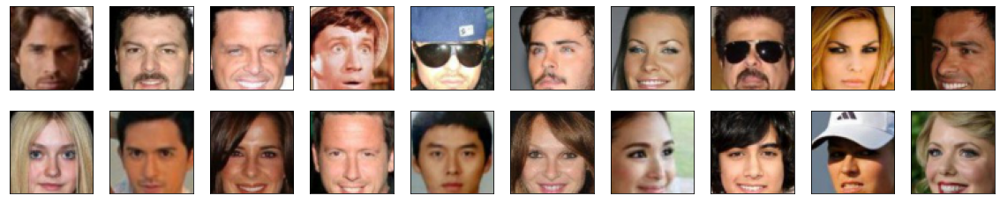

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
from torch.nn import Module

In [8]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        
        # the (first) conv. without batch normalization
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4,
                                     stride=2, padding=1, bias=False) # img_size = 64*64 => 3*64*64
        
        self.conv2 = torch.nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 128*16*16
        self.batchNorm2 = torch.nn.BatchNorm2d(128)
        
        self.conv3 = torch.nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 256*8*8
        self.batchNorm3 = torch.nn.BatchNorm2d(256)

        self.conv4 = torch.nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 512*4*4
        
        self.batchNorm4 = torch.nn.BatchNorm2d(512)
        
        self.flatten = torch.nn.Flatten()
        
        self.fc = torch.nn.Linear(512*4*4, 1)
        
        self.LeakyReLU = torch.nn.LeakyReLU(0.3)

        self.dropout = torch.nn.Dropout(0.3)
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method

        x = self.LeakyReLU(self.conv1(x))
        x = self.LeakyReLU(self.batchNorm2(self.conv2(x)))
        x = self.LeakyReLU(self.batchNorm3(self.conv3(x)))
        x = self.LeakyReLU(self.batchNorm4(self.conv4(x)))

        x = self.flatten(x)
        x = self.dropout(self.fc(x))

        return x.view(1, 1, 1, -1)


In [9]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [10]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        
        self.deconv1 = torch.nn.ConvTranspose2d(in_channels=latent_dim, out_channels=512,
                                                kernel_size=4, stride=1, padding=0, bias=False)
        self.batchNorm1 = torch.nn.BatchNorm2d(512)
        
        self.deconv2 = torch.nn.ConvTranspose2d(in_channels=512, out_channels=256,
                                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm2 = torch.nn.BatchNorm2d(256)
        
        
        self.deconv3 = torch.nn.ConvTranspose2d(in_channels=256, out_channels=128,
                                        kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm3 = torch.nn.BatchNorm2d(128)
        
        
        self.deconv4 = torch.nn.ConvTranspose2d(in_channels=128, out_channels=64,
                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm4 = torch.nn.BatchNorm2d(64)

        # the (last) conv. without batch normalization
        self.deconv5 = torch.nn.ConvTranspose2d(in_channels=64, out_channels=3,
                                        kernel_size=4, stride=2, padding=1, bias=True)

        self.relu = torch.nn.ReLU() # for conv. layers (except the last)
        self.tanh = torch.nn.Tanh() # for the last conv. layer

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        
        x = self.relu(self.batchNorm1(self.deconv1(x)))
        x = self.relu(self.batchNorm2(self.deconv2(x)))
        x = self.relu(self.batchNorm3(self.deconv3(x)))
        x = self.relu(self.batchNorm4(self.deconv4(x)))
        
        x = self.tanh(self.deconv5(x))

        return x

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [12]:
import torch.optim as optim

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    # param based on experiments 
    lr = 0.0002
    beta1=0.5
    beta2=0.999 # default.
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])

    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [13]:
def real_loss(D_out, smooth):

    labels = torch.ones_like(D_out)*0.9 if smooth else torch.ones_like(D_out) 
    labels = labels.cuda()
    
    criterion = torch.nn.BCEWithLogitsLoss()
    return criterion(D_out, labels) # loss


In [14]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    return real_loss(D_fake, smooth= True)

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [15]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    
    # real loss
    r_loss = real_loss(real_logits, smooth= True)
    
    # fake loss
    labels = torch.zeros_like(fake_logits).cuda() # all fake labels zeros
    criterion = torch.nn.BCEWithLogitsLoss()
    f_loss = criterion(fake_logits, labels)
    
    loss = r_loss + f_loss
    
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [16]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [17]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    
    g_optimizer.zero_grad()
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z)
    
    # get discriminator losses on fake images using flipped labels
    D_fake = discriminator(fake_images)
    g_loss = real_loss(D_fake, smooth= True)
    
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    
    gp=0 # I'm not using gradient penalty 
    
    d_optimizer.zero_grad()
    
    D_real = discriminator(real_images)
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z) 
    
    D_fake = discriminator(fake_images.detach())

    d_loss = discriminator_loss(D_real, D_fake)
    
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [18]:
from datetime import datetime

In [19]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [20]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [21]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2022-11-30 15:41:27 | Epoch [1/20] | Batch 0/509 | d_loss: 1.5364 | g_loss: 2.1470
2022-11-30 15:41:35 | Epoch [1/20] | Batch 50/509 | d_loss: 1.1074 | g_loss: 3.7359
2022-11-30 15:41:43 | Epoch [1/20] | Batch 100/509 | d_loss: 1.2759 | g_loss: 3.4928
2022-11-30 15:41:52 | Epoch [1/20] | Batch 150/509 | d_loss: 1.5169 | g_loss: 1.7393
2022-11-30 15:42:00 | Epoch [1/20] | Batch 200/509 | d_loss: 1.3794 | g_loss: 1.9710
2022-11-30 15:42:08 | Epoch [1/20] | Batch 250/509 | d_loss: 1.1602 | g_loss: 1.6324
2022-11-30 15:42:17 | Epoch [1/20] | Batch 300/509 | d_loss: 1.3917 | g_loss: 2.3149
2022-11-30 15:42:25 | Epoch [1/20] | Batch 350/509 | d_loss: 1.4001 | g_loss: 1.0397
2022-11-30 15:42:33 | Epoch [1/20] | Batch 400/509 | d_loss: 1.3013 | g_loss: 1.0142
2022-11-30 15:42:42 | Epoch [1/20] | Batch 450/509 | d_loss: 1.3779 | g_loss: 1.5314
2022-11-30 15:42:50 | Epoch [1/20] | Batch 500/509 | d_loss: 1.3647 | g_loss: 1.0118


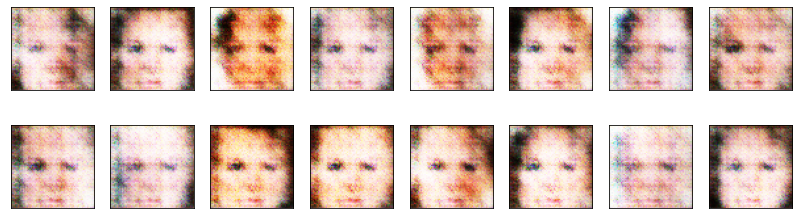

2022-11-30 15:42:53 | Epoch [2/20] | Batch 0/509 | d_loss: 1.4220 | g_loss: 0.8608
2022-11-30 15:43:01 | Epoch [2/20] | Batch 50/509 | d_loss: 1.3254 | g_loss: 1.1021
2022-11-30 15:43:09 | Epoch [2/20] | Batch 100/509 | d_loss: 1.3309 | g_loss: 1.1991
2022-11-30 15:43:17 | Epoch [2/20] | Batch 150/509 | d_loss: 1.2569 | g_loss: 1.2297
2022-11-30 15:43:26 | Epoch [2/20] | Batch 200/509 | d_loss: 1.4755 | g_loss: 0.8946
2022-11-30 15:43:34 | Epoch [2/20] | Batch 250/509 | d_loss: 1.3595 | g_loss: 1.1004
2022-11-30 15:43:42 | Epoch [2/20] | Batch 300/509 | d_loss: 1.4384 | g_loss: 1.1568
2022-11-30 15:43:51 | Epoch [2/20] | Batch 350/509 | d_loss: 1.6054 | g_loss: 0.8631
2022-11-30 15:43:59 | Epoch [2/20] | Batch 400/509 | d_loss: 1.4199 | g_loss: 1.1576
2022-11-30 15:44:07 | Epoch [2/20] | Batch 450/509 | d_loss: 1.3959 | g_loss: 0.9422
2022-11-30 15:44:16 | Epoch [2/20] | Batch 500/509 | d_loss: 1.4339 | g_loss: 1.0248


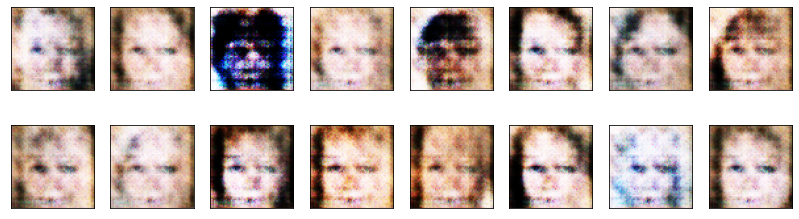

2022-11-30 15:44:18 | Epoch [3/20] | Batch 0/509 | d_loss: 1.3764 | g_loss: 0.9898
2022-11-30 15:44:27 | Epoch [3/20] | Batch 50/509 | d_loss: 1.4400 | g_loss: 0.9915
2022-11-30 15:44:35 | Epoch [3/20] | Batch 100/509 | d_loss: 1.4846 | g_loss: 1.4370
2022-11-30 15:44:43 | Epoch [3/20] | Batch 150/509 | d_loss: 1.2916 | g_loss: 1.4036
2022-11-30 15:44:51 | Epoch [3/20] | Batch 200/509 | d_loss: 1.2872 | g_loss: 0.9324
2022-11-30 15:45:00 | Epoch [3/20] | Batch 250/509 | d_loss: 1.4021 | g_loss: 1.1563
2022-11-30 15:45:08 | Epoch [3/20] | Batch 300/509 | d_loss: 1.2614 | g_loss: 0.8839
2022-11-30 15:45:16 | Epoch [3/20] | Batch 350/509 | d_loss: 1.3733 | g_loss: 1.2449
2022-11-30 15:45:25 | Epoch [3/20] | Batch 400/509 | d_loss: 1.3448 | g_loss: 1.2907
2022-11-30 15:45:33 | Epoch [3/20] | Batch 450/509 | d_loss: 1.3783 | g_loss: 0.9910
2022-11-30 15:45:41 | Epoch [3/20] | Batch 500/509 | d_loss: 1.2124 | g_loss: 1.3241


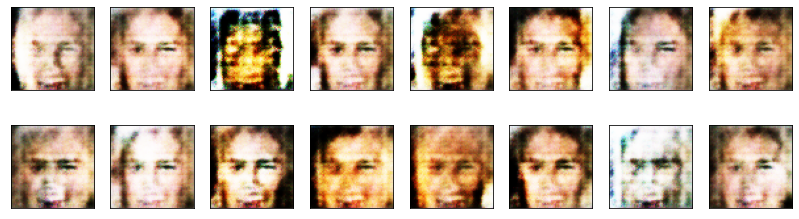

2022-11-30 15:45:44 | Epoch [4/20] | Batch 0/509 | d_loss: 1.2499 | g_loss: 1.1709
2022-11-30 15:45:52 | Epoch [4/20] | Batch 50/509 | d_loss: 1.3229 | g_loss: 1.2329
2022-11-30 15:46:01 | Epoch [4/20] | Batch 100/509 | d_loss: 1.4896 | g_loss: 1.0321
2022-11-30 15:46:09 | Epoch [4/20] | Batch 150/509 | d_loss: 1.4526 | g_loss: 0.8212
2022-11-30 15:46:17 | Epoch [4/20] | Batch 200/509 | d_loss: 1.3101 | g_loss: 1.2757
2022-11-30 15:46:26 | Epoch [4/20] | Batch 250/509 | d_loss: 1.3029 | g_loss: 1.7297
2022-11-30 15:46:34 | Epoch [4/20] | Batch 300/509 | d_loss: 1.2819 | g_loss: 1.0792
2022-11-30 15:46:42 | Epoch [4/20] | Batch 350/509 | d_loss: 1.3355 | g_loss: 1.1403
2022-11-30 15:46:51 | Epoch [4/20] | Batch 400/509 | d_loss: 1.2454 | g_loss: 1.6820
2022-11-30 15:46:59 | Epoch [4/20] | Batch 450/509 | d_loss: 1.2697 | g_loss: 1.0753
2022-11-30 15:47:07 | Epoch [4/20] | Batch 500/509 | d_loss: 1.4734 | g_loss: 1.3795


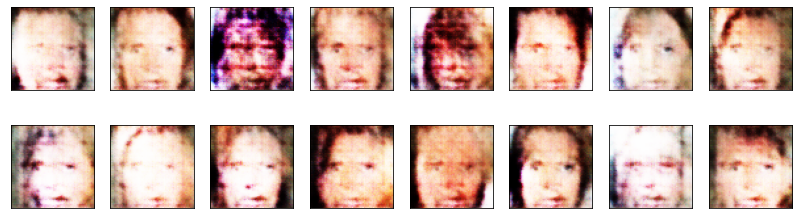

2022-11-30 15:47:10 | Epoch [5/20] | Batch 0/509 | d_loss: 1.2795 | g_loss: 0.9999
2022-11-30 15:47:18 | Epoch [5/20] | Batch 50/509 | d_loss: 1.3674 | g_loss: 1.2973
2022-11-30 15:47:26 | Epoch [5/20] | Batch 100/509 | d_loss: 1.2637 | g_loss: 1.2529
2022-11-30 15:47:35 | Epoch [5/20] | Batch 150/509 | d_loss: 1.2766 | g_loss: 1.3247
2022-11-30 15:47:43 | Epoch [5/20] | Batch 200/509 | d_loss: 1.4608 | g_loss: 1.3650
2022-11-30 15:47:51 | Epoch [5/20] | Batch 250/509 | d_loss: 1.5522 | g_loss: 1.0719
2022-11-30 15:48:00 | Epoch [5/20] | Batch 300/509 | d_loss: 1.3817 | g_loss: 1.2053
2022-11-30 15:48:08 | Epoch [5/20] | Batch 350/509 | d_loss: 1.4405 | g_loss: 1.0148
2022-11-30 15:48:16 | Epoch [5/20] | Batch 400/509 | d_loss: 1.3337 | g_loss: 1.0390
2022-11-30 15:48:25 | Epoch [5/20] | Batch 450/509 | d_loss: 1.3655 | g_loss: 0.9692
2022-11-30 15:48:33 | Epoch [5/20] | Batch 500/509 | d_loss: 1.6017 | g_loss: 1.7709


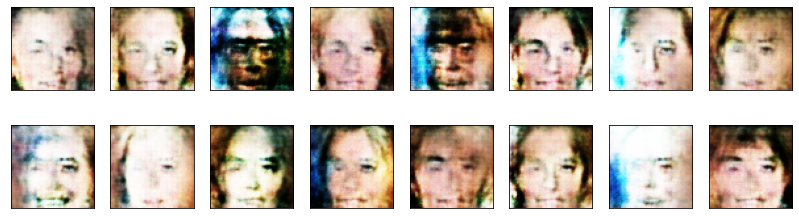

2022-11-30 15:48:36 | Epoch [6/20] | Batch 0/509 | d_loss: 1.2641 | g_loss: 1.0200
2022-11-30 15:48:44 | Epoch [6/20] | Batch 50/509 | d_loss: 1.3777 | g_loss: 1.1832
2022-11-30 15:48:52 | Epoch [6/20] | Batch 100/509 | d_loss: 1.3146 | g_loss: 0.9635
2022-11-30 15:49:00 | Epoch [6/20] | Batch 150/509 | d_loss: 1.3519 | g_loss: 0.9617
2022-11-30 15:49:09 | Epoch [6/20] | Batch 200/509 | d_loss: 1.4870 | g_loss: 1.1992
2022-11-30 15:49:17 | Epoch [6/20] | Batch 250/509 | d_loss: 1.3822 | g_loss: 1.3693
2022-11-30 15:49:25 | Epoch [6/20] | Batch 300/509 | d_loss: 1.4456 | g_loss: 0.7754
2022-11-30 15:49:34 | Epoch [6/20] | Batch 350/509 | d_loss: 1.4300 | g_loss: 1.1412
2022-11-30 15:49:42 | Epoch [6/20] | Batch 400/509 | d_loss: 1.4149 | g_loss: 0.8885
2022-11-30 15:49:50 | Epoch [6/20] | Batch 450/509 | d_loss: 1.3953 | g_loss: 0.9096
2022-11-30 15:49:59 | Epoch [6/20] | Batch 500/509 | d_loss: 1.4324 | g_loss: 1.3642


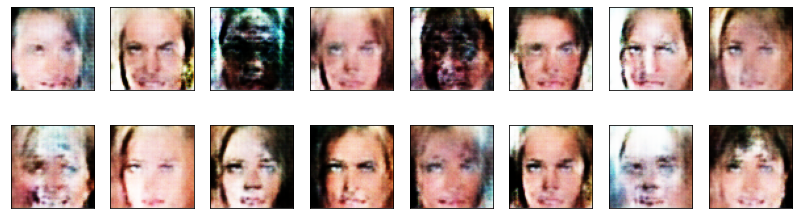

2022-11-30 15:50:01 | Epoch [7/20] | Batch 0/509 | d_loss: 1.3329 | g_loss: 0.8619
2022-11-30 15:50:10 | Epoch [7/20] | Batch 50/509 | d_loss: 1.4393 | g_loss: 0.9808
2022-11-30 15:50:18 | Epoch [7/20] | Batch 100/509 | d_loss: 1.3389 | g_loss: 1.1559
2022-11-30 15:50:26 | Epoch [7/20] | Batch 150/509 | d_loss: 1.4113 | g_loss: 1.1849
2022-11-30 15:50:34 | Epoch [7/20] | Batch 200/509 | d_loss: 1.2914 | g_loss: 1.1313
2022-11-30 15:50:43 | Epoch [7/20] | Batch 250/509 | d_loss: 1.3939 | g_loss: 0.9468
2022-11-30 15:50:51 | Epoch [7/20] | Batch 300/509 | d_loss: 1.3291 | g_loss: 1.0418
2022-11-30 15:50:59 | Epoch [7/20] | Batch 350/509 | d_loss: 1.3354 | g_loss: 0.8839
2022-11-30 15:51:08 | Epoch [7/20] | Batch 400/509 | d_loss: 1.3992 | g_loss: 1.0471
2022-11-30 15:51:16 | Epoch [7/20] | Batch 450/509 | d_loss: 1.3481 | g_loss: 1.0735
2022-11-30 15:51:24 | Epoch [7/20] | Batch 500/509 | d_loss: 1.4803 | g_loss: 0.9356


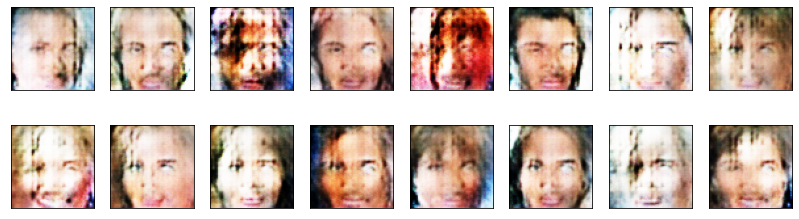

2022-11-30 15:51:27 | Epoch [8/20] | Batch 0/509 | d_loss: 1.2402 | g_loss: 1.3748
2022-11-30 15:51:35 | Epoch [8/20] | Batch 50/509 | d_loss: 1.4287 | g_loss: 1.5449
2022-11-30 15:51:44 | Epoch [8/20] | Batch 100/509 | d_loss: 1.3966 | g_loss: 1.1380
2022-11-30 15:51:52 | Epoch [8/20] | Batch 150/509 | d_loss: 1.4040 | g_loss: 1.3278
2022-11-30 15:52:00 | Epoch [8/20] | Batch 200/509 | d_loss: 1.3731 | g_loss: 0.9478
2022-11-30 15:52:09 | Epoch [8/20] | Batch 250/509 | d_loss: 1.3499 | g_loss: 1.3448
2022-11-30 15:52:17 | Epoch [8/20] | Batch 300/509 | d_loss: 1.3233 | g_loss: 0.9441
2022-11-30 15:52:25 | Epoch [8/20] | Batch 350/509 | d_loss: 1.2140 | g_loss: 1.4283
2022-11-30 15:52:34 | Epoch [8/20] | Batch 400/509 | d_loss: 1.2309 | g_loss: 1.0967
2022-11-30 15:52:42 | Epoch [8/20] | Batch 450/509 | d_loss: 1.3711 | g_loss: 0.6745
2022-11-30 15:52:50 | Epoch [8/20] | Batch 500/509 | d_loss: 1.4187 | g_loss: 1.1657


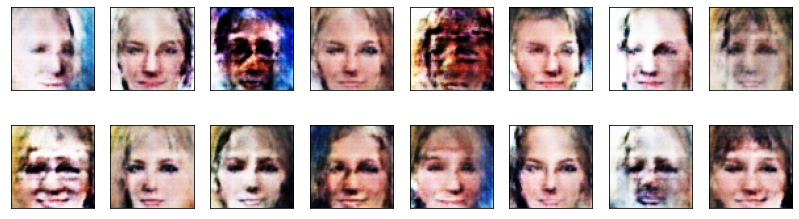

2022-11-30 15:52:53 | Epoch [9/20] | Batch 0/509 | d_loss: 1.2075 | g_loss: 1.1414
2022-11-30 15:53:01 | Epoch [9/20] | Batch 50/509 | d_loss: 1.3908 | g_loss: 0.8527
2022-11-30 15:53:09 | Epoch [9/20] | Batch 100/509 | d_loss: 1.3330 | g_loss: 1.1306
2022-11-30 15:53:18 | Epoch [9/20] | Batch 150/509 | d_loss: 1.2468 | g_loss: 1.3020
2022-11-30 15:53:26 | Epoch [9/20] | Batch 200/509 | d_loss: 1.3393 | g_loss: 0.8541
2022-11-30 15:53:34 | Epoch [9/20] | Batch 250/509 | d_loss: 1.3771 | g_loss: 1.1791
2022-11-30 15:53:43 | Epoch [9/20] | Batch 300/509 | d_loss: 1.3701 | g_loss: 1.3806
2022-11-30 15:53:51 | Epoch [9/20] | Batch 350/509 | d_loss: 1.3121 | g_loss: 0.8978
2022-11-30 15:53:59 | Epoch [9/20] | Batch 400/509 | d_loss: 1.2250 | g_loss: 1.2199
2022-11-30 15:54:08 | Epoch [9/20] | Batch 450/509 | d_loss: 1.3870 | g_loss: 1.0930
2022-11-30 15:54:16 | Epoch [9/20] | Batch 500/509 | d_loss: 1.3398 | g_loss: 1.2719


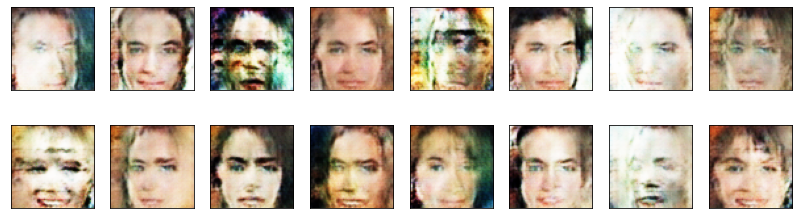

2022-11-30 15:54:19 | Epoch [10/20] | Batch 0/509 | d_loss: 1.2677 | g_loss: 1.1178
2022-11-30 15:54:27 | Epoch [10/20] | Batch 50/509 | d_loss: 1.2841 | g_loss: 1.0209
2022-11-30 15:54:35 | Epoch [10/20] | Batch 100/509 | d_loss: 1.5564 | g_loss: 2.1966
2022-11-30 15:54:43 | Epoch [10/20] | Batch 150/509 | d_loss: 1.3022 | g_loss: 1.0848
2022-11-30 15:54:52 | Epoch [10/20] | Batch 200/509 | d_loss: 1.2968 | g_loss: 1.3292
2022-11-30 15:55:00 | Epoch [10/20] | Batch 250/509 | d_loss: 1.2297 | g_loss: 1.1771
2022-11-30 15:55:08 | Epoch [10/20] | Batch 300/509 | d_loss: 1.6071 | g_loss: 0.9995
2022-11-30 15:55:17 | Epoch [10/20] | Batch 350/509 | d_loss: 1.2384 | g_loss: 1.2806
2022-11-30 15:55:25 | Epoch [10/20] | Batch 400/509 | d_loss: 1.3065 | g_loss: 1.6803
2022-11-30 15:55:33 | Epoch [10/20] | Batch 450/509 | d_loss: 1.1613 | g_loss: 0.9742
2022-11-30 15:55:41 | Epoch [10/20] | Batch 500/509 | d_loss: 1.3935 | g_loss: 1.0599


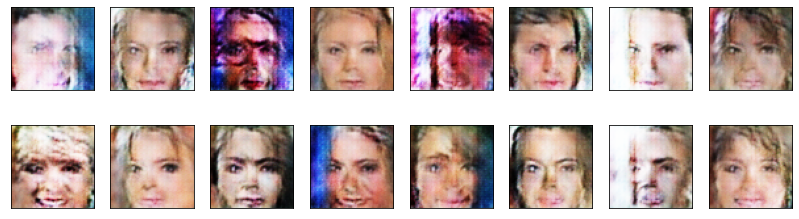

2022-11-30 15:55:44 | Epoch [11/20] | Batch 0/509 | d_loss: 1.2348 | g_loss: 1.2530
2022-11-30 15:55:52 | Epoch [11/20] | Batch 50/509 | d_loss: 1.2950 | g_loss: 1.1822
2022-11-30 15:56:01 | Epoch [11/20] | Batch 100/509 | d_loss: 1.3543 | g_loss: 1.6768
2022-11-30 15:56:09 | Epoch [11/20] | Batch 150/509 | d_loss: 1.2366 | g_loss: 1.1438
2022-11-30 15:56:17 | Epoch [11/20] | Batch 200/509 | d_loss: 1.1526 | g_loss: 1.1161
2022-11-30 15:56:26 | Epoch [11/20] | Batch 250/509 | d_loss: 1.3208 | g_loss: 0.9960
2022-11-30 15:56:34 | Epoch [11/20] | Batch 300/509 | d_loss: 1.2755 | g_loss: 1.3029
2022-11-30 15:56:42 | Epoch [11/20] | Batch 350/509 | d_loss: 1.3089 | g_loss: 1.3643
2022-11-30 15:56:50 | Epoch [11/20] | Batch 400/509 | d_loss: 1.2295 | g_loss: 1.2140
2022-11-30 15:56:59 | Epoch [11/20] | Batch 450/509 | d_loss: 1.3403 | g_loss: 1.6750
2022-11-30 15:57:07 | Epoch [11/20] | Batch 500/509 | d_loss: 1.1995 | g_loss: 1.4392


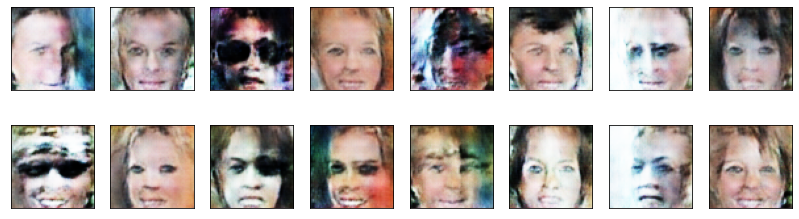

2022-11-30 15:57:10 | Epoch [12/20] | Batch 0/509 | d_loss: 1.2448 | g_loss: 1.1204
2022-11-30 15:57:18 | Epoch [12/20] | Batch 50/509 | d_loss: 1.2911 | g_loss: 1.1787
2022-11-30 15:57:27 | Epoch [12/20] | Batch 100/509 | d_loss: 1.3304 | g_loss: 0.8028
2022-11-30 15:57:35 | Epoch [12/20] | Batch 150/509 | d_loss: 1.2080 | g_loss: 1.3748
2022-11-30 15:57:43 | Epoch [12/20] | Batch 200/509 | d_loss: 1.4364 | g_loss: 2.6125
2022-11-30 15:57:51 | Epoch [12/20] | Batch 250/509 | d_loss: 1.3026 | g_loss: 0.8513
2022-11-30 15:58:00 | Epoch [12/20] | Batch 300/509 | d_loss: 1.3819 | g_loss: 1.2961
2022-11-30 15:58:08 | Epoch [12/20] | Batch 350/509 | d_loss: 1.3032 | g_loss: 1.7535
2022-11-30 15:58:16 | Epoch [12/20] | Batch 400/509 | d_loss: 1.4287 | g_loss: 0.8245
2022-11-30 15:58:25 | Epoch [12/20] | Batch 450/509 | d_loss: 1.2389 | g_loss: 1.0001
2022-11-30 15:58:33 | Epoch [12/20] | Batch 500/509 | d_loss: 1.2830 | g_loss: 1.1025


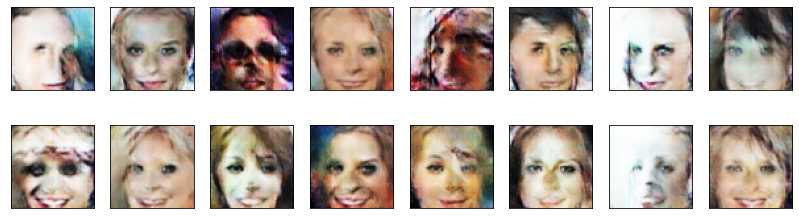

2022-11-30 15:58:36 | Epoch [13/20] | Batch 0/509 | d_loss: 1.0602 | g_loss: 1.3718
2022-11-30 15:58:44 | Epoch [13/20] | Batch 50/509 | d_loss: 1.1705 | g_loss: 1.7161
2022-11-30 15:58:52 | Epoch [13/20] | Batch 100/509 | d_loss: 1.1936 | g_loss: 1.0199
2022-11-30 15:59:00 | Epoch [13/20] | Batch 150/509 | d_loss: 1.4237 | g_loss: 1.8814
2022-11-30 15:59:09 | Epoch [13/20] | Batch 200/509 | d_loss: 1.2160 | g_loss: 0.9295
2022-11-30 15:59:17 | Epoch [13/20] | Batch 250/509 | d_loss: 1.4278 | g_loss: 1.2782
2022-11-30 15:59:25 | Epoch [13/20] | Batch 300/509 | d_loss: 1.2766 | g_loss: 1.5866
2022-11-30 15:59:34 | Epoch [13/20] | Batch 350/509 | d_loss: 1.2360 | g_loss: 1.4042
2022-11-30 15:59:42 | Epoch [13/20] | Batch 400/509 | d_loss: 1.3786 | g_loss: 1.1304
2022-11-30 15:59:50 | Epoch [13/20] | Batch 450/509 | d_loss: 1.3381 | g_loss: 1.7692
2022-11-30 15:59:58 | Epoch [13/20] | Batch 500/509 | d_loss: 1.2768 | g_loss: 1.1787


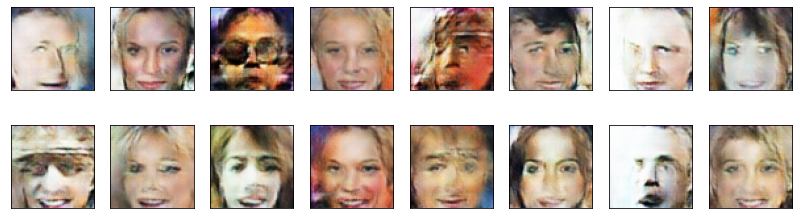

2022-11-30 16:00:01 | Epoch [14/20] | Batch 0/509 | d_loss: 1.3303 | g_loss: 2.3251
2022-11-30 16:00:09 | Epoch [14/20] | Batch 50/509 | d_loss: 1.2521 | g_loss: 1.5457
2022-11-30 16:00:18 | Epoch [14/20] | Batch 100/509 | d_loss: 1.4181 | g_loss: 1.7506
2022-11-30 16:00:26 | Epoch [14/20] | Batch 150/509 | d_loss: 1.1493 | g_loss: 1.4454
2022-11-30 16:00:34 | Epoch [14/20] | Batch 200/509 | d_loss: 1.4139 | g_loss: 0.9247
2022-11-30 16:00:43 | Epoch [14/20] | Batch 250/509 | d_loss: 1.2492 | g_loss: 1.1257
2022-11-30 16:00:51 | Epoch [14/20] | Batch 300/509 | d_loss: 1.2848 | g_loss: 1.1119
2022-11-30 16:00:59 | Epoch [14/20] | Batch 350/509 | d_loss: 1.3183 | g_loss: 1.2166
2022-11-30 16:01:07 | Epoch [14/20] | Batch 400/509 | d_loss: 1.0311 | g_loss: 1.3807
2022-11-30 16:01:16 | Epoch [14/20] | Batch 450/509 | d_loss: 1.2973 | g_loss: 0.8384
2022-11-30 16:01:24 | Epoch [14/20] | Batch 500/509 | d_loss: 1.8008 | g_loss: 2.3317


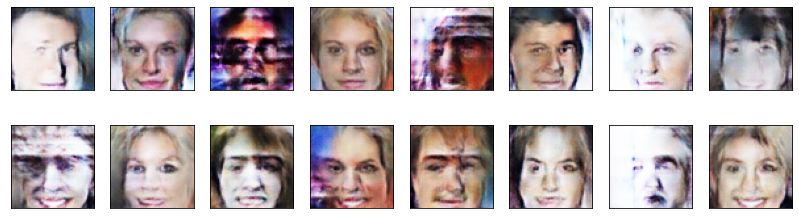

2022-11-30 16:01:27 | Epoch [15/20] | Batch 0/509 | d_loss: 1.2548 | g_loss: 1.0479
2022-11-30 16:01:35 | Epoch [15/20] | Batch 50/509 | d_loss: 1.1390 | g_loss: 1.5217
2022-11-30 16:01:43 | Epoch [15/20] | Batch 100/509 | d_loss: 1.2517 | g_loss: 1.2169
2022-11-30 16:01:52 | Epoch [15/20] | Batch 150/509 | d_loss: 1.2017 | g_loss: 1.5720
2022-11-30 16:02:00 | Epoch [15/20] | Batch 200/509 | d_loss: 1.0133 | g_loss: 1.5359
2022-11-30 16:02:08 | Epoch [15/20] | Batch 250/509 | d_loss: 1.1870 | g_loss: 1.0041
2022-11-30 16:02:16 | Epoch [15/20] | Batch 300/509 | d_loss: 2.1547 | g_loss: 1.6399
2022-11-30 16:02:25 | Epoch [15/20] | Batch 350/509 | d_loss: 1.2711 | g_loss: 0.9501
2022-11-30 16:02:33 | Epoch [15/20] | Batch 400/509 | d_loss: 1.2018 | g_loss: 1.3135
2022-11-30 16:02:41 | Epoch [15/20] | Batch 450/509 | d_loss: 1.4573 | g_loss: 1.7196
2022-11-30 16:02:50 | Epoch [15/20] | Batch 500/509 | d_loss: 1.1436 | g_loss: 1.2947


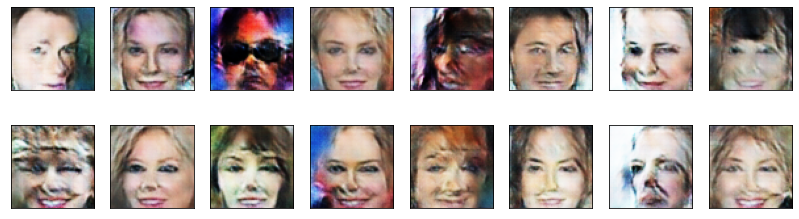

2022-11-30 16:02:52 | Epoch [16/20] | Batch 0/509 | d_loss: 1.0213 | g_loss: 1.1743
2022-11-30 16:03:01 | Epoch [16/20] | Batch 50/509 | d_loss: 1.2996 | g_loss: 1.4553
2022-11-30 16:03:09 | Epoch [16/20] | Batch 100/509 | d_loss: 1.2429 | g_loss: 1.4822
2022-11-30 16:03:17 | Epoch [16/20] | Batch 150/509 | d_loss: 1.1709 | g_loss: 1.2343
2022-11-30 16:03:26 | Epoch [16/20] | Batch 200/509 | d_loss: 1.1431 | g_loss: 0.9329
2022-11-30 16:03:34 | Epoch [16/20] | Batch 250/509 | d_loss: 1.5828 | g_loss: 1.0809
2022-11-30 16:03:42 | Epoch [16/20] | Batch 300/509 | d_loss: 1.1281 | g_loss: 1.2757
2022-11-30 16:03:50 | Epoch [16/20] | Batch 350/509 | d_loss: 1.2084 | g_loss: 1.5706
2022-11-30 16:03:59 | Epoch [16/20] | Batch 400/509 | d_loss: 1.2473 | g_loss: 0.8086
2022-11-30 16:04:07 | Epoch [16/20] | Batch 450/509 | d_loss: 1.0988 | g_loss: 1.0651
2022-11-30 16:04:15 | Epoch [16/20] | Batch 500/509 | d_loss: 1.4493 | g_loss: 2.5361


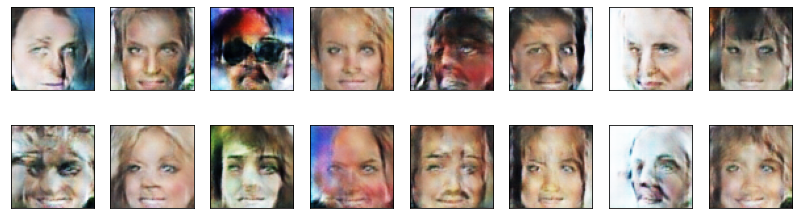

2022-11-30 16:04:18 | Epoch [17/20] | Batch 0/509 | d_loss: 1.2459 | g_loss: 1.0319
2022-11-30 16:04:26 | Epoch [17/20] | Batch 50/509 | d_loss: 1.1030 | g_loss: 1.4155
2022-11-30 16:04:34 | Epoch [17/20] | Batch 100/509 | d_loss: 1.1238 | g_loss: 1.1849
2022-11-30 16:04:43 | Epoch [17/20] | Batch 150/509 | d_loss: 1.3719 | g_loss: 1.7618
2022-11-30 16:04:51 | Epoch [17/20] | Batch 200/509 | d_loss: 1.2460 | g_loss: 0.9097
2022-11-30 16:04:59 | Epoch [17/20] | Batch 250/509 | d_loss: 1.3561 | g_loss: 1.0582
2022-11-30 16:05:08 | Epoch [17/20] | Batch 300/509 | d_loss: 1.5528 | g_loss: 0.7714
2022-11-30 16:05:16 | Epoch [17/20] | Batch 350/509 | d_loss: 1.1373 | g_loss: 2.1999
2022-11-30 16:05:24 | Epoch [17/20] | Batch 400/509 | d_loss: 1.0560 | g_loss: 1.4449
2022-11-30 16:05:32 | Epoch [17/20] | Batch 450/509 | d_loss: 1.2274 | g_loss: 1.8913
2022-11-30 16:05:41 | Epoch [17/20] | Batch 500/509 | d_loss: 1.0672 | g_loss: 1.4472


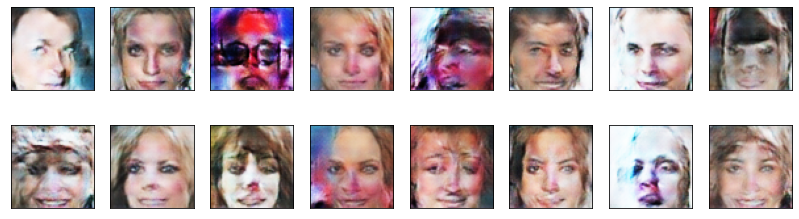

2022-11-30 16:05:43 | Epoch [18/20] | Batch 0/509 | d_loss: 1.1931 | g_loss: 1.5773
2022-11-30 16:05:52 | Epoch [18/20] | Batch 50/509 | d_loss: 1.1100 | g_loss: 1.4744
2022-11-30 16:06:00 | Epoch [18/20] | Batch 100/509 | d_loss: 1.1035 | g_loss: 1.7044
2022-11-30 16:06:08 | Epoch [18/20] | Batch 150/509 | d_loss: 1.3686 | g_loss: 1.6104
2022-11-30 16:06:16 | Epoch [18/20] | Batch 200/509 | d_loss: 1.1854 | g_loss: 1.7168
2022-11-30 16:06:25 | Epoch [18/20] | Batch 250/509 | d_loss: 0.9913 | g_loss: 1.7359
2022-11-30 16:06:33 | Epoch [18/20] | Batch 300/509 | d_loss: 1.0675 | g_loss: 1.4067
2022-11-30 16:06:41 | Epoch [18/20] | Batch 350/509 | d_loss: 1.2164 | g_loss: 1.4488
2022-11-30 16:06:50 | Epoch [18/20] | Batch 400/509 | d_loss: 1.2122 | g_loss: 1.2499
2022-11-30 16:06:58 | Epoch [18/20] | Batch 450/509 | d_loss: 1.2749 | g_loss: 2.5511
2022-11-30 16:07:06 | Epoch [18/20] | Batch 500/509 | d_loss: 1.2055 | g_loss: 0.7800


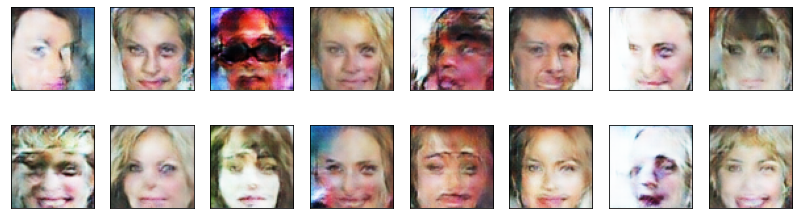

2022-11-30 16:07:09 | Epoch [19/20] | Batch 0/509 | d_loss: 1.0211 | g_loss: 1.6822
2022-11-30 16:07:17 | Epoch [19/20] | Batch 50/509 | d_loss: 1.1886 | g_loss: 1.2493
2022-11-30 16:07:26 | Epoch [19/20] | Batch 100/509 | d_loss: 1.0806 | g_loss: 1.4009
2022-11-30 16:07:34 | Epoch [19/20] | Batch 150/509 | d_loss: 1.1541 | g_loss: 1.5771
2022-11-30 16:07:42 | Epoch [19/20] | Batch 200/509 | d_loss: 0.8964 | g_loss: 1.1885
2022-11-30 16:07:50 | Epoch [19/20] | Batch 250/509 | d_loss: 1.0979 | g_loss: 1.3758
2022-11-30 16:07:59 | Epoch [19/20] | Batch 300/509 | d_loss: 1.2763 | g_loss: 2.2493
2022-11-30 16:08:07 | Epoch [19/20] | Batch 350/509 | d_loss: 1.2224 | g_loss: 1.7175
2022-11-30 16:08:15 | Epoch [19/20] | Batch 400/509 | d_loss: 1.0735 | g_loss: 1.3344
2022-11-30 16:08:24 | Epoch [19/20] | Batch 450/509 | d_loss: 1.1709 | g_loss: 1.4477
2022-11-30 16:08:32 | Epoch [19/20] | Batch 500/509 | d_loss: 1.0861 | g_loss: 1.2248


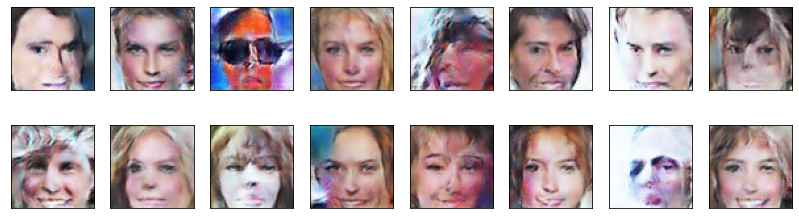

2022-11-30 16:08:34 | Epoch [20/20] | Batch 0/509 | d_loss: 1.0092 | g_loss: 1.0911
2022-11-30 16:08:43 | Epoch [20/20] | Batch 50/509 | d_loss: 1.0768 | g_loss: 1.2930
2022-11-30 16:08:51 | Epoch [20/20] | Batch 100/509 | d_loss: 1.2366 | g_loss: 1.6481
2022-11-30 16:08:59 | Epoch [20/20] | Batch 150/509 | d_loss: 1.0814 | g_loss: 0.9904
2022-11-30 16:09:08 | Epoch [20/20] | Batch 200/509 | d_loss: 1.2583 | g_loss: 2.2424
2022-11-30 16:09:16 | Epoch [20/20] | Batch 250/509 | d_loss: 1.2293 | g_loss: 1.4650
2022-11-30 16:09:24 | Epoch [20/20] | Batch 300/509 | d_loss: 1.2185 | g_loss: 1.1812
2022-11-30 16:09:32 | Epoch [20/20] | Batch 350/509 | d_loss: 1.2778 | g_loss: 1.5564
2022-11-30 16:09:41 | Epoch [20/20] | Batch 400/509 | d_loss: 1.1841 | g_loss: 1.2965
2022-11-30 16:09:49 | Epoch [20/20] | Batch 450/509 | d_loss: 1.2204 | g_loss: 1.0778
2022-11-30 16:09:57 | Epoch [20/20] | Batch 500/509 | d_loss: 1.0973 | g_loss: 1.4182


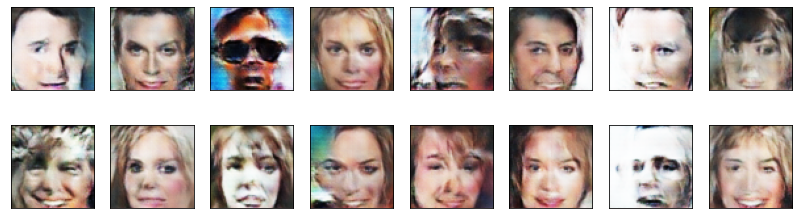

In [22]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        # 1. train discriminator
        if batch_i % 2 == 0: # to train the generator more then the discriminator
            d_loss = discriminator_step(batch_size, latent_dim, real_images)
            
        # 2. train generator
        g_loss = generator_step(batch_size, latent_dim)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

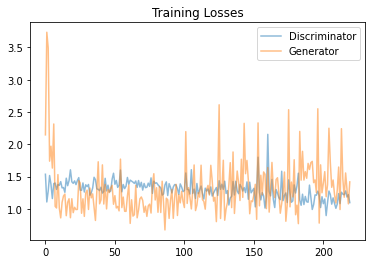

In [23]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** I will do more research on best hyperparameters for optimaizer, loss options, and models architectures.. because I noticed a huge difference after changing just single parameter (e.g. like learning rate on Adam optim.). So, I think it is more efficient to choose model hyperparameters after doing a research to see what a researchers found after a set of massive experimentation. For the dataset, adding celebrities from all the races could make the model more generalizable. In addition, more deeper architecture for the discriminator and generater would be better to capture an generate more specific details.

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.